In [50]:
import tensorflow as tf

In [51]:
tf.test.is_gpu_available()

True

In [52]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [53]:
len(tf.config.list_physical_devices('GPU'))

1

In [54]:
tf.test.is_built_with_cuda()

True

In [55]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import tensorflow
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
from keras import callbacks
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, LSTM, Dropout, GRU, Bidirectional
from tensorflow.keras.layers import Activation
from tensorflow.keras.optimizers import SGD
import math
from sklearn.metrics import mean_squared_error
from tensorflow.keras import backend as K
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
import random
import cv2
import os
from imutils import paths
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D

In [56]:
df = pd.read_csv('I:/Study Materials/Thesis/Dataset/dataset_5secondWindow.csv')

In [57]:
df

,id,time,activityrecognition#0,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
0,16170,78,NaN,100,9.811476,9.758895,9.849411,0.014626,0.029340,0.029014,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
1,15871,145,NaN,100,9.939207,7.707437,17.146631,1.775944,0.999925,0.999903,...,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,0.628595,Car,U12
2,16811,150,NaN,100,9.827178,9.804817,9.849262,0.011199,0.665215,0.665213,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
3,15831,105,NaN,77,9.673039,7.659674,12.304298,0.862553,0.996221,0.993781,...,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,0.628595,Car,U12
4,876,77,NaN,100,9.993466,8.965621,10.891645,0.504117,0.563792,0.521799,...,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,NaN,Car,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,14125,4,NaN,100,10.066610,4.564648,13.414389,3.373972,0.986319,0.974523,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Walking,U2
5889,19582,32,NaN,10,9.964271,8.768007,11.454213,0.665529,0.648602,0.648343,...,NaN,NaN,NaN,NaN,31.960054,31.960054,31.960054,NaN,Train,U3
5890,16178,86,NaN,100,9.812893,9.772881,9.862587,0.017633,0.024392,0.024081,...,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,Still,U12
5891,10973,199,NaN,100,9.831144,9.807347,9.874450,0.013485,0.481212,0.481209,...,NaN,NaN,NaN,NaN,1.090415,1.090415,1.090415,NaN,Still,U10


In [58]:
column_lst = list(df.columns)
mostly_null = []
partially_null = []
no_null = []

In [59]:
for i in column_lst:
    percentage = (df[i].isnull().sum()*100)/5893
    if percentage >= 60:
        mostly_null.append(i)
    elif df[i].isnull().sum() > 0:
        partially_null.append(i)
    elif df[i].isnull().sum() == 0:
        no_null.append(i)

    print('Feature Name:',i)
    print("Number of missing values: ",df[i].isnull().sum(),"out of 5893")
    print("Missing percentage:"+str(percentage)+"%")
    print()

Feature Name: id
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: time
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: activityrecognition#0
Number of missing values:  5893 out of 5893
Missing percentage:100.0%

Feature Name: activityrecognition#1
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#mean
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#min
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#max
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#std
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#mean
Number of missing values:  799 out of 5893
Missing percentage:13.558459188868149%

Feature Name: android.sensor.gam

In [60]:
if len(mostly_null)+len(partially_null)+len(no_null) == len(column_lst):
    print("True")
else:
    print("False")

True


In [61]:
mostly_null

['activityrecognition#0',
 'android.sensor.light#std',
 'android.sensor.pressure#mean',
 'android.sensor.pressure#min',
 'android.sensor.pressure#max',
 'android.sensor.pressure#std',
 'android.sensor.proximity#mean',
 'android.sensor.proximity#min',
 'android.sensor.proximity#max',
 'android.sensor.proximity#std',
 'android.sensor.step_counter#mean',
 'android.sensor.step_counter#min',
 'android.sensor.step_counter#max',
 'android.sensor.step_counter#std',
 'speed#std']

In [62]:
for i in mostly_null:
    df = df.drop([i], axis = 1)

In [63]:
df = df.drop(['id'], axis = 1)

In [64]:
partially_null

['android.sensor.game_rotation_vector#mean',
 'android.sensor.game_rotation_vector#min',
 'android.sensor.game_rotation_vector#max',
 'android.sensor.game_rotation_vector#std',
 'android.sensor.gravity#mean',
 'android.sensor.gravity#min',
 'android.sensor.gravity#max',
 'android.sensor.gravity#std',
 'android.sensor.gyroscope#mean',
 'android.sensor.gyroscope#min',
 'android.sensor.gyroscope#max',
 'android.sensor.gyroscope#std',
 'android.sensor.gyroscope_uncalibrated#mean',
 'android.sensor.gyroscope_uncalibrated#min',
 'android.sensor.gyroscope_uncalibrated#max',
 'android.sensor.gyroscope_uncalibrated#std',
 'android.sensor.light#mean',
 'android.sensor.light#min',
 'android.sensor.light#max',
 'android.sensor.linear_acceleration#mean',
 'android.sensor.linear_acceleration#min',
 'android.sensor.linear_acceleration#max',
 'android.sensor.linear_acceleration#std',
 'android.sensor.magnetic_field#mean',
 'android.sensor.magnetic_field#min',
 'android.sensor.magnetic_field#max',
 'an

In [65]:
for i in partially_null:
    print("Partially Null Feature Name:",i)
    print("Number of unique values: ",len(df[i].unique()),"and Number of missing values: ",df[i].isnull().sum())
    print()

Partially Null Feature Name: android.sensor.game_rotation_vector#mean
Number of unique values:  4922 and Number of missing values:  799

Partially Null Feature Name: android.sensor.game_rotation_vector#min
Number of unique values:  4913 and Number of missing values:  799

Partially Null Feature Name: android.sensor.game_rotation_vector#max
Number of unique values:  4914 and Number of missing values:  799

Partially Null Feature Name: android.sensor.game_rotation_vector#std
Number of unique values:  4472 and Number of missing values:  800

Partially Null Feature Name: android.sensor.gravity#mean
Number of unique values:  2367 and Number of missing values:  497

Partially Null Feature Name: android.sensor.gravity#min
Number of unique values:  2739 and Number of missing values:  497

Partially Null Feature Name: android.sensor.gravity#max
Number of unique values:  2736 and Number of missing values:  497

Partially Null Feature Name: android.sensor.gravity#std
Number of unique values:  134

In [66]:
for i in partially_null:
    df[i] = df[i].fillna(0)

In [67]:
newcolumns = list(df.columns)

In [68]:
for i in newcolumns:
    
    print('Feature Name:',i)
    print("Number of missing values: ",df[i].isnull().sum(),"out of 5893")
    print("Missing percentage:"+str(percentage)+"%")
    print()

Feature Name: time
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: activityrecognition#1
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#mean
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#min
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#max
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#std
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#mean
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#min
Number of missing values:  0 out of 5893
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#max
Number of missing values:  0 out of 5893
Missing percentage:0.0%


In [69]:
df

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,android.sensor.game_rotation_vector#std,...,android.sensor.rotation_vector#std,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,target,user
0,78,100,9.811476,9.758895,9.849411,0.014626,0.029340,0.029014,0.029526,0.000119,...,0.002109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Still,U12
1,145,100,9.939207,7.707437,17.146631,1.775944,0.999925,0.999903,0.999946,0.000030,...,0.000026,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,Car,U12
2,150,100,9.827178,9.804817,9.849262,0.011199,0.665215,0.665213,0.665218,0.000004,...,0.011312,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Still,U12
3,105,77,9.673039,7.659674,12.304298,0.862553,0.996221,0.993781,0.998661,0.003451,...,0.002788,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,Car,U12
4,77,100,9.993466,8.965621,10.891645,0.504117,0.563792,0.521799,0.672664,0.064792,...,0.025608,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,Car,U1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,4,100,10.066610,4.564648,13.414389,3.373972,0.986319,0.974523,0.992084,0.007186,...,0.008767,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Walking,U2
5889,32,10,9.964271,8.768007,11.454213,0.665529,0.648602,0.648343,0.648974,0.000331,...,0.018447,0.000000,0.000000,0.000000,0.000000,31.960054,31.960054,31.960054,Train,U3
5890,86,100,9.812893,9.772881,9.862587,0.017633,0.024392,0.024081,0.024696,0.000211,...,0.002659,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Still,U12
5891,199,100,9.831144,9.807347,9.874450,0.013485,0.481212,0.481209,0.481216,0.000002,...,0.000005,0.000000,0.000000,0.000000,0.000000,1.090415,1.090415,1.090415,Still,U10


In [70]:
df['target'].unique()

array(['Still', 'Car', 'Train', 'Bus', 'Walking'], dtype=object)

In [71]:
df['target'] = df['target'].map({'Bus':0,'Car':1,'Still':2,'Train':3,'Walking':4}) 

In [72]:
df = df.drop(['user'], axis = 1)

In [73]:
df

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,android.sensor.game_rotation_vector#std,...,android.sensor.rotation_vector#max,android.sensor.rotation_vector#std,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,target
0,78,100,9.811476,9.758895,9.849411,0.014626,0.029340,0.029014,0.029526,0.000119,...,0.056351,0.002109,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2
1,145,100,9.939207,7.707437,17.146631,1.775944,0.999925,0.999903,0.999946,0.000030,...,0.999999,0.000026,89.200210,89.065143,89.335277,0.191013,16.539349,16.539349,16.539349,1
2,150,100,9.827178,9.804817,9.849262,0.011199,0.665215,0.665213,0.665218,0.000004,...,0.610456,0.011312,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2
3,105,77,9.673039,7.659674,12.304298,0.862553,0.996221,0.993781,0.998661,0.003451,...,0.998112,0.002788,87.470377,87.470377,87.470377,2.284186,17.739895,17.739895,17.739895,1
4,77,100,9.993466,8.965621,10.891645,0.504117,0.563792,0.521799,0.672664,0.064792,...,0.378193,0.025608,89.770732,89.770732,89.770732,0.006389,9.000000,9.000000,9.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,4,100,10.066610,4.564648,13.414389,3.373972,0.986319,0.974523,0.992084,0.007186,...,0.941454,0.008767,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4
5889,32,10,9.964271,8.768007,11.454213,0.665529,0.648602,0.648343,0.648974,0.000331,...,0.320622,0.018447,0.000000,0.000000,0.000000,0.000000,31.960054,31.960054,31.960054,3
5890,86,100,9.812893,9.772881,9.862587,0.017633,0.024392,0.024081,0.024696,0.000211,...,0.059438,0.002659,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2
5891,199,100,9.831144,9.807347,9.874450,0.013485,0.481212,0.481209,0.481216,0.000002,...,0.276354,0.000005,0.000000,0.000000,0.000000,0.000000,1.090415,1.090415,1.090415,2


<AxesSubplot:>

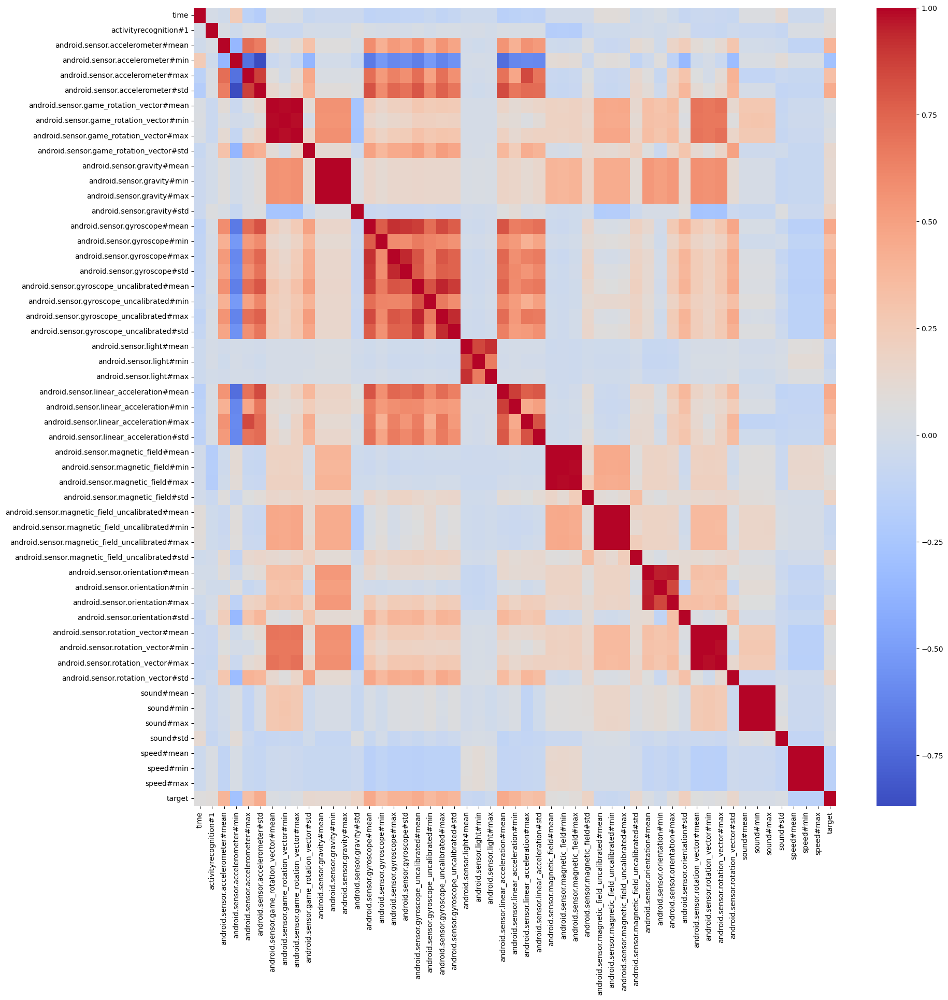

In [74]:
corr = df.corr()

plt.figure(figsize=(20,20))  
sns.heatmap(corr, annot = False, cmap = 'coolwarm')

In [75]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >= threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [76]:
corr_features = correlation(df, 0.7)
len(set(corr_features))

32

In [77]:
corr_features

{'android.sensor.accelerometer#max',
 'android.sensor.accelerometer#std',
 'android.sensor.game_rotation_vector#max',
 'android.sensor.game_rotation_vector#min',
 'android.sensor.gravity#max',
 'android.sensor.gravity#min',
 'android.sensor.gyroscope#max',
 'android.sensor.gyroscope#mean',
 'android.sensor.gyroscope#min',
 'android.sensor.gyroscope#std',
 'android.sensor.gyroscope_uncalibrated#max',
 'android.sensor.gyroscope_uncalibrated#mean',
 'android.sensor.gyroscope_uncalibrated#min',
 'android.sensor.gyroscope_uncalibrated#std',
 'android.sensor.light#max',
 'android.sensor.light#min',
 'android.sensor.linear_acceleration#max',
 'android.sensor.linear_acceleration#mean',
 'android.sensor.linear_acceleration#min',
 'android.sensor.linear_acceleration#std',
 'android.sensor.magnetic_field#max',
 'android.sensor.magnetic_field#min',
 'android.sensor.magnetic_field_uncalibrated#max',
 'android.sensor.magnetic_field_uncalibrated#min',
 'android.sensor.orientation#max',
 'android.sens

In [78]:
df1 = df.drop(corr_features,axis=1)

In [79]:
df1

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,android.sensor.light#mean,android.sensor.magnetic_field#mean,...,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,sound#std,speed#mean,target
0,78,100,9.811476,9.758895,0.029340,0.000119,9.806650,4.780000e-07,0.000,57.099638,...,51.363566,0.080899,354.286933,0.245676,0.050413,0.002109,0.000000,0.000000,0.000000,2
1,145,100,9.939207,7.707437,0.999925,0.000030,9.806624,6.470000e-07,0.000,29.351288,...,82.767760,0.506105,332.695577,1.705816,0.999981,0.000026,89.200210,0.191013,16.539349,1
2,150,100,9.827178,9.804817,0.665215,0.000004,9.806650,2.820000e-07,2.000,29.904927,...,55.695716,0.128945,74.752653,0.413704,0.610456,0.011312,0.000000,0.000000,0.000000,2
3,105,77,9.673039,7.659674,0.996221,0.003451,9.806638,2.120000e-06,0.000,37.836471,...,95.743821,0.112446,373.556039,8.870011,0.998112,0.002788,87.470377,2.284186,17.739895,1
4,77,100,9.993466,8.965621,0.563792,0.064792,9.806650,2.640000e-07,30.000,78.375718,...,157.429217,0.895633,193.201458,181.729455,0.322242,0.025608,89.770732,0.006389,9.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,4,100,10.066610,4.564648,0.986319,0.007186,9.806650,2.230000e-07,4.000,28.551588,...,56.502261,23.640120,198.025171,0.858121,0.932682,0.008767,0.000000,0.000000,0.000000,4
5889,32,10,9.964271,8.768007,0.648602,0.000331,9.806650,8.170000e-07,126.123,40.665641,...,85.122017,4.265621,35.427524,1.794702,0.295905,0.018447,0.000000,0.000000,31.960054,3
5890,86,100,9.812893,9.772881,0.024392,0.000211,9.806650,4.290000e-07,0.000,57.026001,...,51.317797,0.074212,354.182815,0.307487,0.051333,0.002659,0.000000,0.000000,0.000000,2
5891,199,100,9.831144,9.807347,0.481212,0.000002,9.806621,2.930000e-05,16.000,62.277008,...,270.495205,0.235700,32.077433,0.000209,0.276348,0.000005,0.000000,0.000000,1.090415,2


<AxesSubplot:>

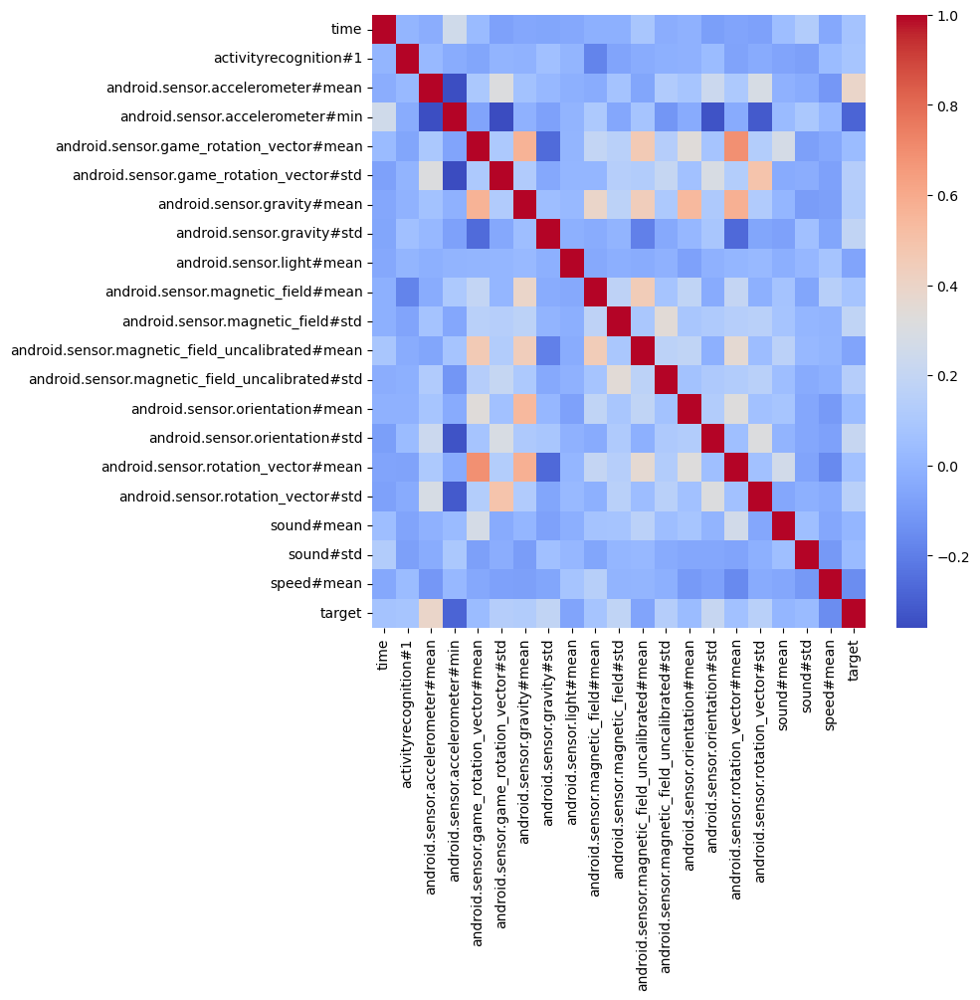

In [80]:
corr = df1.corr()

plt.figure(figsize=(8,8))  
sns.heatmap(corr, annot = False, cmap = 'coolwarm')


In [81]:
#from sklearn.preprocessing import OneHotEncoder
#enc = OneHotEncoder(handle_unknown='ignore')

#enc_df = pd.DataFrame(enc.fit_transform(df1[['target']]).toarray())

#final_df = df1.join(enc_df)

In [82]:
final_df = df1

In [83]:
final_df

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,android.sensor.light#mean,android.sensor.magnetic_field#mean,...,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,sound#std,speed#mean,target
0,78,100,9.811476,9.758895,0.029340,0.000119,9.806650,4.780000e-07,0.000,57.099638,...,51.363566,0.080899,354.286933,0.245676,0.050413,0.002109,0.000000,0.000000,0.000000,2
1,145,100,9.939207,7.707437,0.999925,0.000030,9.806624,6.470000e-07,0.000,29.351288,...,82.767760,0.506105,332.695577,1.705816,0.999981,0.000026,89.200210,0.191013,16.539349,1
2,150,100,9.827178,9.804817,0.665215,0.000004,9.806650,2.820000e-07,2.000,29.904927,...,55.695716,0.128945,74.752653,0.413704,0.610456,0.011312,0.000000,0.000000,0.000000,2
3,105,77,9.673039,7.659674,0.996221,0.003451,9.806638,2.120000e-06,0.000,37.836471,...,95.743821,0.112446,373.556039,8.870011,0.998112,0.002788,87.470377,2.284186,17.739895,1
4,77,100,9.993466,8.965621,0.563792,0.064792,9.806650,2.640000e-07,30.000,78.375718,...,157.429217,0.895633,193.201458,181.729455,0.322242,0.025608,89.770732,0.006389,9.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,4,100,10.066610,4.564648,0.986319,0.007186,9.806650,2.230000e-07,4.000,28.551588,...,56.502261,23.640120,198.025171,0.858121,0.932682,0.008767,0.000000,0.000000,0.000000,4
5889,32,10,9.964271,8.768007,0.648602,0.000331,9.806650,8.170000e-07,126.123,40.665641,...,85.122017,4.265621,35.427524,1.794702,0.295905,0.018447,0.000000,0.000000,31.960054,3
5890,86,100,9.812893,9.772881,0.024392,0.000211,9.806650,4.290000e-07,0.000,57.026001,...,51.317797,0.074212,354.182815,0.307487,0.051333,0.002659,0.000000,0.000000,0.000000,2
5891,199,100,9.831144,9.807347,0.481212,0.000002,9.806621,2.930000e-05,16.000,62.277008,...,270.495205,0.235700,32.077433,0.000209,0.276348,0.000005,0.000000,0.000000,1.090415,2


In [84]:
X = final_df.iloc[:,0:20] 
y = final_df.iloc[:,20]

In [85]:
X

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,android.sensor.light#mean,android.sensor.magnetic_field#mean,android.sensor.magnetic_field#std,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,sound#std,speed#mean
0,78,100,9.811476,9.758895,0.029340,0.000119,9.806650,4.780000e-07,0.000,57.099638,0.177549,51.363566,0.080899,354.286933,0.245676,0.050413,0.002109,0.000000,0.000000,0.000000
1,145,100,9.939207,7.707437,0.999925,0.000030,9.806624,6.470000e-07,0.000,29.351288,0.921547,82.767760,0.506105,332.695577,1.705816,0.999981,0.000026,89.200210,0.191013,16.539349
2,150,100,9.827178,9.804817,0.665215,0.000004,9.806650,2.820000e-07,2.000,29.904927,0.130851,55.695716,0.128945,74.752653,0.413704,0.610456,0.011312,0.000000,0.000000,0.000000
3,105,77,9.673039,7.659674,0.996221,0.003451,9.806638,2.120000e-06,0.000,37.836471,0.439461,95.743821,0.112446,373.556039,8.870011,0.998112,0.002788,87.470377,2.284186,17.739895
4,77,100,9.993466,8.965621,0.563792,0.064792,9.806650,2.640000e-07,30.000,78.375718,1.104361,157.429217,0.895633,193.201458,181.729455,0.322242,0.025608,89.770732,0.006389,9.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5888,4,100,10.066610,4.564648,0.986319,0.007186,9.806650,2.230000e-07,4.000,28.551588,0.381842,56.502261,23.640120,198.025171,0.858121,0.932682,0.008767,0.000000,0.000000,0.000000
5889,32,10,9.964271,8.768007,0.648602,0.000331,9.806650,8.170000e-07,126.123,40.665641,1.755636,85.122017,4.265621,35.427524,1.794702,0.295905,0.018447,0.000000,0.000000,31.960054
5890,86,100,9.812893,9.772881,0.024392,0.000211,9.806650,4.290000e-07,0.000,57.026001,0.209266,51.317797,0.074212,354.182815,0.307487,0.051333,0.002659,0.000000,0.000000,0.000000
5891,199,100,9.831144,9.807347,0.481212,0.000002,9.806621,2.930000e-05,16.000,62.277008,0.636157,270.495205,0.235700,32.077433,0.000209,0.276348,0.000005,0.000000,0.000000,1.090415


In [86]:
y

0       2
1       1
2       2
3       1
4       1
       ..
5888    4
5889    3
5890    2
5891    2
5892    4
Name: target, Length: 5893, dtype: int64

In [87]:
from sklearn.preprocessing import MinMaxScaler   #min max scaling

scaler = MinMaxScaler(feature_range=(0,1))

scaler.fit(X)

X_scaled = scaler.transform(X)


In [88]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test =train_test_split(X_scaled,y,test_size=0.2)

In [89]:
y_train.shape

(4714,)

In [90]:
from re import L

def create_clients(feature_list, label_list, num_clients=5, initial='clients'):
    ''' return: a dictionary with keys clients' names and value as 
                data shards - tuple of features and label lists.
        args: 
            feature_list: a list of numpy arrays of training features
            label_list:a list of binarized labels for each feature
            num_client: number of fedrated members (clients)
            initials: the clients'name prefix, e.g, clients_1 
            
    '''

    #create a list of client names
    client_names = ['{}_{}'.format(initial, i+1) for i in range(num_clients)]

    #randomize the data
    print(len(feature_list))
    print(len(label_list))
    data = list(zip(feature_list, label_list))
    print(len(data))
    random.shuffle(data)
    #shard data and place at each client
    size = len(data)//num_clients
    shards = [data[i:i + size] for i in range(0, size*num_clients, size)]

    #number of clients must equal number of shards
    assert(len(shards) == len(client_names))

    return {client_names[i] : shards[i] for i in range(len(client_names))} 

In [91]:
X_train.shape

(4714, 20)

In [92]:

#create clients
clients = create_clients(X_train, y_train, num_clients=5, initial='client')

4714
4714
4714


In [93]:
len(clients['client_3'])

942

In [94]:
def batch_data(data_shard, bs=32):
    '''Takes in a clients data shard and create a tfds object off it
    args:
        shard: a data, label constituting a client's data shard
        bs:batch size
    return:
        tfds object'''
    #seperate shard into data and labels lists
    data, label = zip(*data_shard)
    dataset = tf.data.Dataset.from_tensor_slices((list(data), list(label)))
    return dataset.shuffle(len(label)).batch(bs)

In [95]:

#process and batch the training data for each client
clients_batched = dict()
for (client_name, data) in clients.items():
    clients_batched[client_name] = batch_data(data)
    
#process and batch the test set  
test_batched = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(len(y_test))

In [96]:
class SimpleMLP:
    @staticmethod
    def build(shape, classes):
        model = Sequential()
        model.add(Dense(256, input_shape=(20,)))
        model.add(Activation("relu"))
        model.add(Dropout(0.40))
        model.add(Dense(256))
        model.add(Activation("relu"))
        model.add(Dropout(0.40))
        model.add(Dense(5))
        model.add(Activation("softmax"))
        return model

In [97]:

lr = 0.01 
comms_round = 200
loss='sparse_categorical_crossentropy'
metrics = ['sparse_categorical_accuracy']
optimizer = SGD(learning_rate=lr, 
                decay=lr / comms_round, 
                momentum=0.9)   

In [98]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from sklearn.preprocessing import LabelBinarizer
def weight_scalling_factor(clients_trn_data, client_name):
    client_names = list(clients_trn_data.keys())
    #get the bs
    bs = list(clients_trn_data[client_name])[0][0].shape[0]
    #first calculate the total training data points across clinets
    global_count = sum([tf.data.experimental.cardinality(clients_trn_data[client_name]).numpy() for client_name in client_names])*bs
    # get the total number of data points held by a client
    local_count = tf.data.experimental.cardinality(clients_trn_data[client_name]).numpy()*bs
    return local_count/global_count


def scale_model_weights(weight, scalar):
    '''function for scaling a models weights'''
    weight_final = []
    steps = len(weight)
    for i in range(steps):
        weight_final.append(scalar * weight[i])
    return weight_final



def sum_scaled_weights(scaled_weight_list):
    '''Return the sum of the listed scaled weights. The is equivalent to scaled avg of the weights'''
    avg_grad = list()
    #get the average grad accross all client gradients
    for grad_list_tuple in zip(*scaled_weight_list):
        layer_mean = tf.math.reduce_sum(grad_list_tuple, axis=0)
        avg_grad.append(layer_mean)
        
    return avg_grad


def test_model(X_test, Y_test, model, comm_round):
    y_pred = []
    cce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    #logits = model.predict(X_test, batch_size=100)
    logits = model.predict(X_test)
    c1 = tf.argmax(logits, axis=1).numpy()
    for i in range(len(c1)):
        y_pred.append(c1[i])

    y_pred = np.array(y_pred)

    print("y_pred =", y_pred)
    loss = cce(Y_test, logits)
    print(Y_test)
    acc = accuracy_score(y_pred, Y_test)
    print(y_pred.shape)
    print(Y_test.shape)
    print('comm_round: {} | global_acc: {:.3%} | global_loss: {}'.format(comm_round, acc, loss))
    cf=classification_report(Y_test,y_pred)
    print(cf)
    
    '''
    fpr, tpr, _ = metrics.roc_curve(np.array(Y_test), y_pred)
    auc = round(metrics.roc_auc_score(np.array(Y_test), y_pred), 4)
    plt.plot(fpr,tpr,label="FedMLP-5s, AUC="+str(auc))

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for multi-class data')
    plt.legend(loc="lower right")
    '''
    '''
    n_classes = 5
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    lw=2
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(Y_test[:, i], y_pred[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    colors = cycle(['blue', 'red', 'green', 'yellow', 'pink'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                label='ROC curve of class {0} (area = {1:0.2f})'
                ''.format(i, roc_auc[i]))
    plt.plot([0, 1], [0, 1], 'k--', lw=lw)
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic for multi-class data')
    plt.legend(loc="lower right")
    plt.show()
    '''
    
    target= ["Bus","Car", "Still","Train","Walking"]

    # set plot figure size
    fig, c_ax = plt.subplots(1,1, figsize = (8, 6))
    lb = LabelBinarizer()
    lb.fit(Y_test)
    Y_test = lb.transform(Y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(target):
        fpr, tpr, thresholds = roc_curve(Y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
    print(roc_auc_score(Y_test, y_pred, average="macro"))


    c_ax.legend()
    c_ax.set_xlabel('False Positive Rate', size=14)
    c_ax.set_ylabel('True Positive Rate', size=14)
    c_ax.set_title('ROC Curve for FedMLP (5-second window)', size=14)
    plt.show()
        

    return acc, loss

30/30 [==============================] - 1s 7ms/step - loss: 1.6050 - sparse_categorical_accuracy: 0.2420
y_pred = [1 2 2 ... 0 0 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 0 | global_acc: 44.699% | global_loss: 1.5994712114334106
              precision    recall  f1-score   support

           0       0.30      0.57      0.39       235
           1       0.53      0.32      0.40       228
           2       0.57      0.37      0.45       228
           3       0.44      0.34      0.38       269
           4       0.61      0.66      0.63       219

    accuracy                           0.45      1179
   macro avg       0.49      0.45      0.45      1179
weighted avg       0.49      0.45      0.45      1179

0.6566350721296592


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


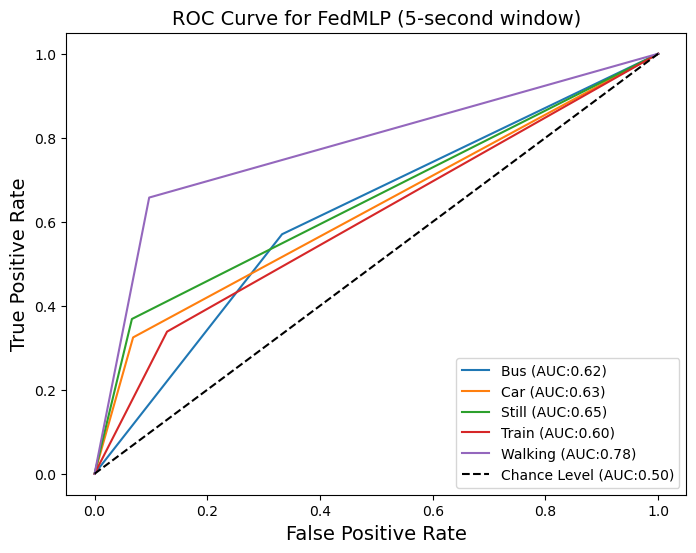

30/30 [==============================] - 0s 4ms/step - loss: 1.5680 - sparse_categorical_accuracy: 0.3163
y_pred = [1 2 2 ... 4 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 1 | global_acc: 41.137% | global_loss: 1.590158224105835
              precision    recall  f1-score   support

           0       0.36      0.15      0.21       235
           1       0.53      0.53      0.53       228
           2       0.58      0.47      0.52       228
           3       0.45      0.15      0.23       269
           4       0.31      0.83      0.46       219

    accuracy                           0.41      1179
   macro avg       0.45      0.43      0.39      1179
weighted avg       0.45      0.41      0.38      1179

0.6399282512927307


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


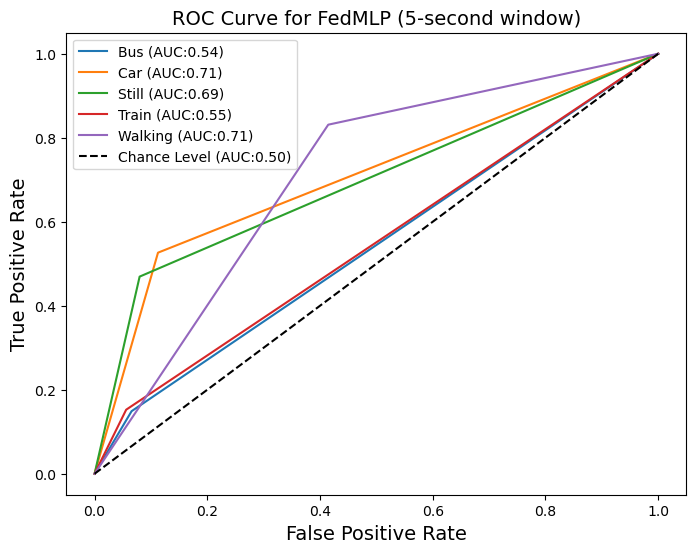

30/30 [==============================] - 0s 5ms/step - loss: 1.5292 - sparse_categorical_accuracy: 0.3546
y_pred = [1 2 2 ... 4 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 2 | global_acc: 50.042% | global_loss: 1.5786237716674805
              precision    recall  f1-score   support

           0       0.45      0.28      0.35       235
           1       0.52      0.59      0.55       228
           2       0.63      0.52      0.57       228
           3       0.40      0.37      0.38       269
           4       0.51      0.79      0.62       219

    accuracy                           0.50      1179
   macro avg       0.50      0.51      0.49      1179
weighted avg       0.50      0.50      0.49      1179

0.6918638780629764


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


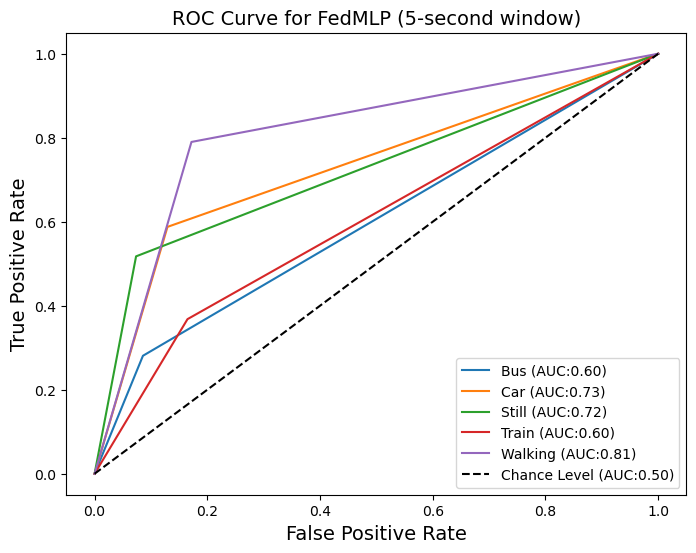

30/30 [==============================] - 1s 11ms/step - loss: 1.4839 - sparse_categorical_accuracy: 0.3737
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 3 | global_acc: 53.859% | global_loss: 1.5640875101089478
              precision    recall  f1-score   support

           0       0.44      0.60      0.50       235
           1       0.53      0.63      0.57       228
           2       0.61      0.60      0.60       228
           3       0.38      0.25      0.30       269
           4       0.82      0.67      0.74       219

    accuracy                           0.54      1179
   macro avg       0.55      0.55      0.54      1179
weighted avg       0.55      0.54      0.53      1179

0.7169020660898339


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


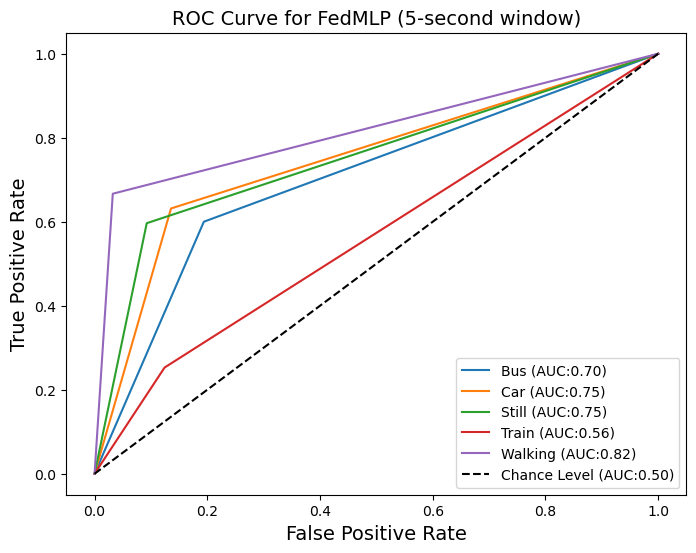

30/30 [==============================] - 0s 4ms/step - loss: 1.4445 - sparse_categorical_accuracy: 0.4066
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 4 | global_acc: 55.131% | global_loss: 1.5474014282226562
              precision    recall  f1-score   support

           0       0.44      0.63      0.52       235
           1       0.54      0.66      0.59       228
           2       0.62      0.57      0.60       228
           3       0.42      0.27      0.33       269
           4       0.81      0.68      0.74       219

    accuracy                           0.55      1179
   macro avg       0.57      0.56      0.56      1179
weighted avg       0.56      0.55      0.55      1179

0.7248582684097855


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


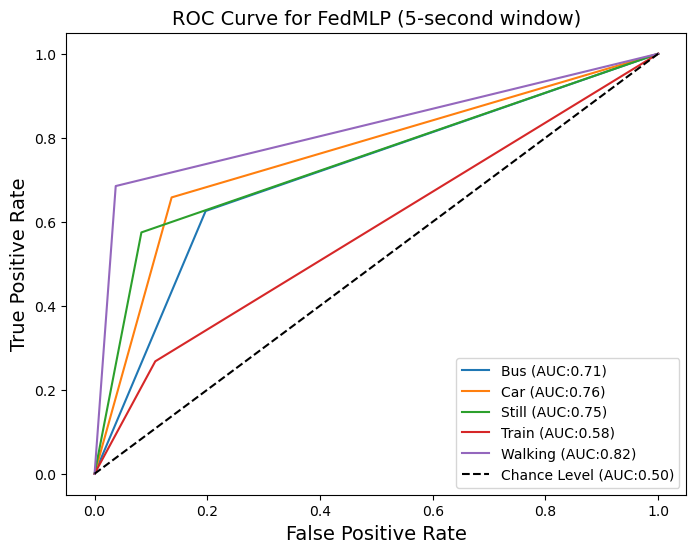

30/30 [==============================] - 1s 3ms/step - loss: 1.3806 - sparse_categorical_accuracy: 0.4586
y_pred = [1 2 2 ... 4 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 5 | global_acc: 55.725% | global_loss: 1.5286853313446045
              precision    recall  f1-score   support

           0       0.44      0.58      0.50       235
           1       0.54      0.67      0.60       228
           2       0.65      0.57      0.60       228
           3       0.44      0.27      0.33       269
           4       0.74      0.76      0.75       219

    accuracy                           0.56      1179
   macro avg       0.56      0.57      0.56      1179
weighted avg       0.56      0.56      0.55      1179

0.7291635892227707


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


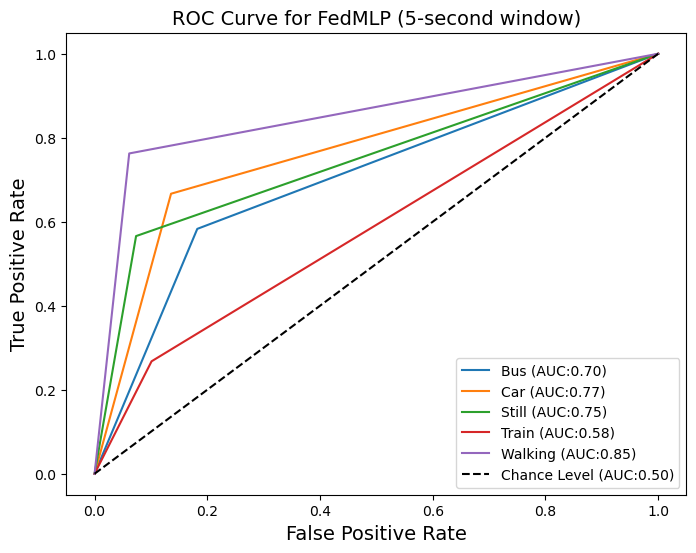

30/30 [==============================] - 0s 4ms/step - loss: 1.3516 - sparse_categorical_accuracy: 0.4809
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 6 | global_acc: 55.725% | global_loss: 1.5111464262008667
              precision    recall  f1-score   support

           0       0.43      0.66      0.52       235
           1       0.54      0.61      0.57       228
           2       0.68      0.55      0.61       228
           3       0.43      0.26      0.33       269
           4       0.77      0.76      0.77       219

    accuracy                           0.56      1179
   macro avg       0.57      0.57      0.56      1179
weighted avg       0.56      0.56      0.55      1179

0.729018988991907


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


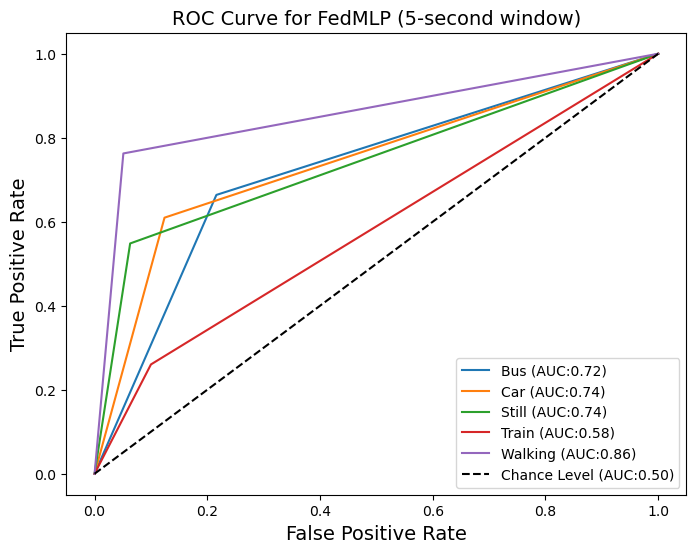

30/30 [==============================] - 0s 5ms/step - loss: 1.2891 - sparse_categorical_accuracy: 0.5000
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 7 | global_acc: 56.404% | global_loss: 1.4906320571899414
              precision    recall  f1-score   support

           0       0.46      0.60      0.52       235
           1       0.56      0.73      0.63       228
           2       0.64      0.60      0.62       228
           3       0.41      0.25      0.31       269
           4       0.79      0.70      0.74       219

    accuracy                           0.56      1179
   macro avg       0.57      0.58      0.56      1179
weighted avg       0.56      0.56      0.55      1179

0.7335328229970244


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


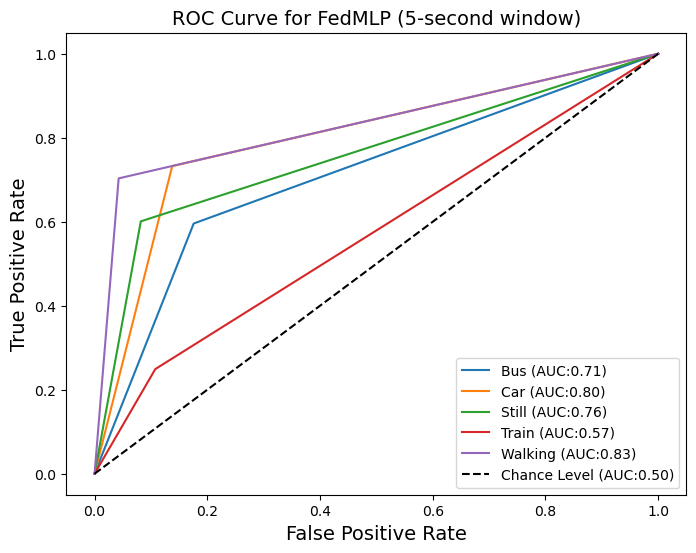

30/30 [==============================] - 0s 4ms/step - loss: 1.2445 - sparse_categorical_accuracy: 0.5053
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 8 | global_acc: 57.506% | global_loss: 1.4712793827056885
              precision    recall  f1-score   support

           0       0.46      0.61      0.52       235
           1       0.56      0.66      0.60       228
           2       0.66      0.68      0.67       228
           3       0.44      0.25      0.32       269
           4       0.78      0.73      0.76       219

    accuracy                           0.58      1179
   macro avg       0.58      0.59      0.58      1179
weighted avg       0.57      0.58      0.56      1179

0.7406370341422139


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


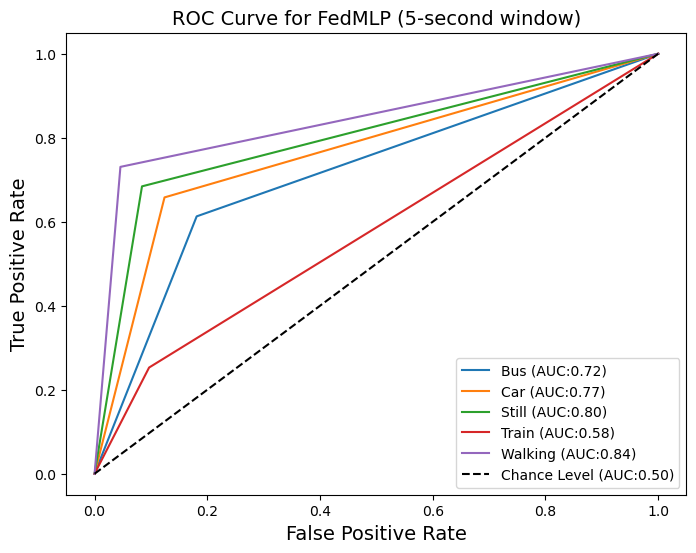

30/30 [==============================] - 0s 5ms/step - loss: 1.2230 - sparse_categorical_accuracy: 0.5000
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 9 | global_acc: 61.069% | global_loss: 1.4521613121032715
              precision    recall  f1-score   support

           0       0.49      0.60      0.54       235
           1       0.58      0.75      0.65       228
           2       0.67      0.79      0.72       228
           3       0.54      0.19      0.28       269
           4       0.76      0.81      0.79       219

    accuracy                           0.61      1179
   macro avg       0.61      0.63      0.60      1179
weighted avg       0.60      0.61      0.58      1179

0.7651548341989729


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


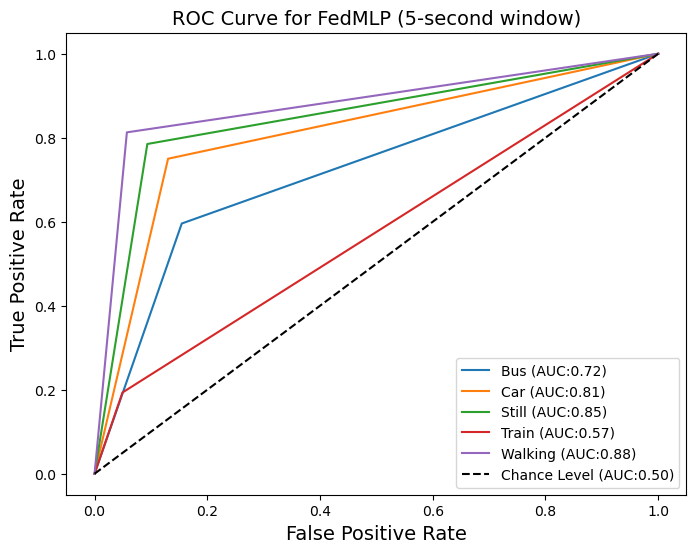

30/30 [==============================] - 0s 4ms/step - loss: 1.1425 - sparse_categorical_accuracy: 0.5584
y_pred = [1 2 2 ... 4 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 10 | global_acc: 59.627% | global_loss: 1.4349108934402466
              precision    recall  f1-score   support

           0       0.47      0.49      0.48       235
           1       0.58      0.71      0.64       228
           2       0.66      0.79      0.72       228
           3       0.48      0.22      0.30       269
           4       0.72      0.85      0.78       219

    accuracy                           0.60      1179
   macro avg       0.58      0.61      0.58      1179
weighted avg       0.58      0.60      0.57      1179

0.7557635914486875


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


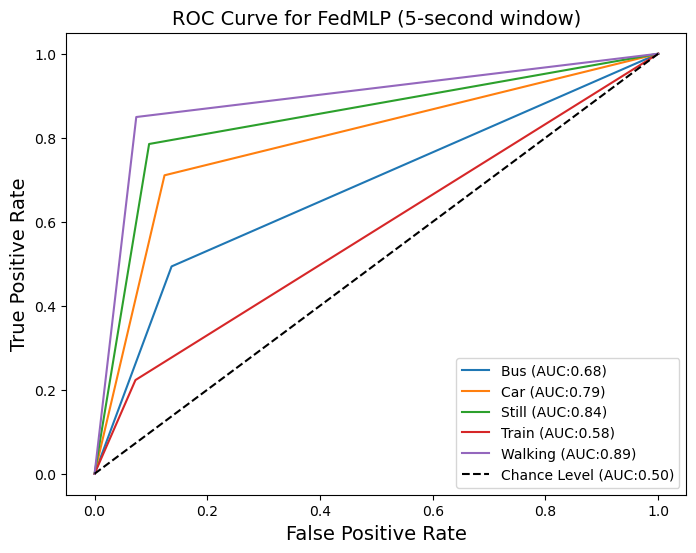

30/30 [==============================] - 0s 4ms/step - loss: 1.1189 - sparse_categorical_accuracy: 0.5743
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 11 | global_acc: 59.796% | global_loss: 1.422791600227356
              precision    recall  f1-score   support

           0       0.50      0.51      0.51       235
           1       0.57      0.69      0.63       228
           2       0.70      0.71      0.71       228
           3       0.44      0.36      0.40       269
           4       0.79      0.76      0.78       219

    accuracy                           0.60      1179
   macro avg       0.60      0.61      0.60      1179
weighted avg       0.59      0.60      0.59      1179

0.7536074378416875


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


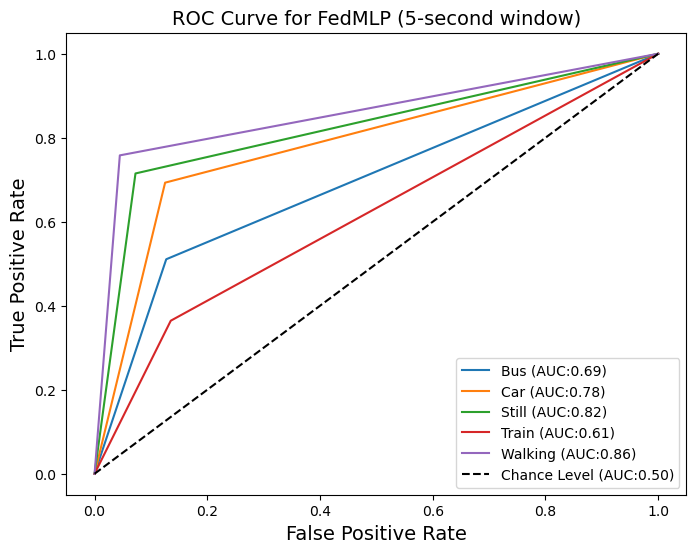

30/30 [==============================] - 0s 5ms/step - loss: 1.0782 - sparse_categorical_accuracy: 0.5743
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 12 | global_acc: 62.256% | global_loss: 1.410321593284607
              precision    recall  f1-score   support

           0       0.49      0.60      0.54       235
           1       0.58      0.74      0.65       228
           2       0.73      0.76      0.74       228
           3       0.52      0.28      0.36       269
           4       0.80      0.80      0.80       219

    accuracy                           0.62      1179
   macro avg       0.62      0.64      0.62      1179
weighted avg       0.62      0.62      0.61      1179

0.7710357779795576


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


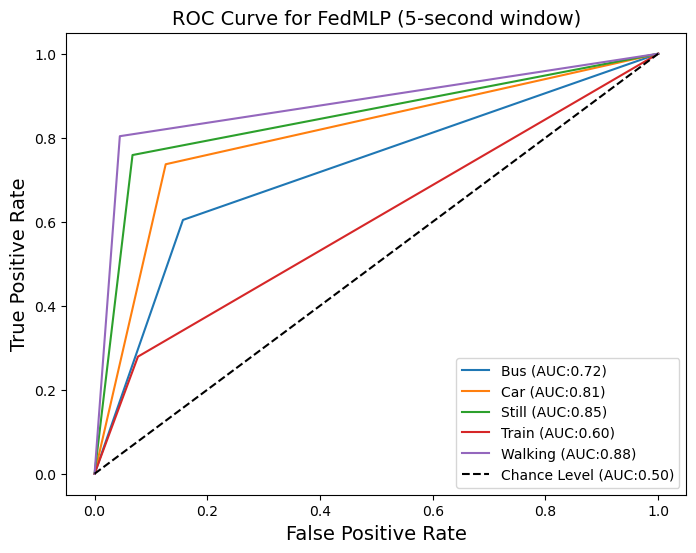

30/30 [==============================] - 0s 4ms/step - loss: 1.0676 - sparse_categorical_accuracy: 0.5817
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 13 | global_acc: 62.765% | global_loss: 1.3986018896102905
              precision    recall  f1-score   support

           0       0.51      0.60      0.55       235
           1       0.60      0.66      0.63       228
           2       0.70      0.85      0.77       228
           3       0.48      0.30      0.37       269
           4       0.84      0.79      0.82       219

    accuracy                           0.63      1179
   macro avg       0.63      0.64      0.63      1179
weighted avg       0.62      0.63      0.62      1179

0.7737282718206953


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


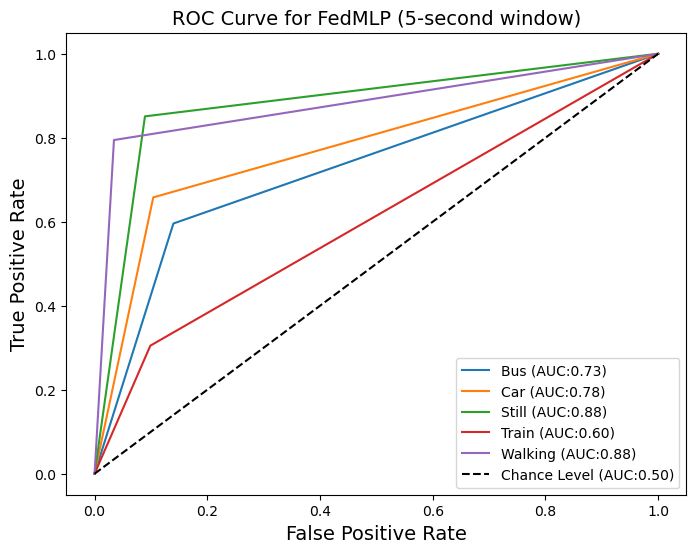

30/30 [==============================] - 0s 4ms/step - loss: 1.0835 - sparse_categorical_accuracy: 0.5754
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 14 | global_acc: 63.020% | global_loss: 1.3890902996063232
              precision    recall  f1-score   support

           0       0.49      0.63      0.55       235
           1       0.61      0.68      0.65       228
           2       0.72      0.82      0.77       228
           3       0.50      0.29      0.36       269
           4       0.84      0.80      0.82       219

    accuracy                           0.63      1179
   macro avg       0.63      0.64      0.63      1179
weighted avg       0.63      0.63      0.62      1179

0.7756877410012841


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


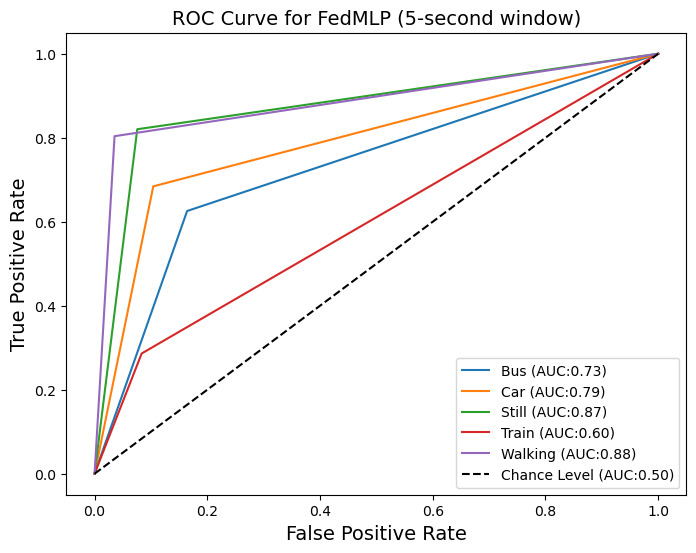

30/30 [==============================] - 0s 4ms/step - loss: 1.0307 - sparse_categorical_accuracy: 0.5987
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 15 | global_acc: 64.292% | global_loss: 1.3783884048461914
              precision    recall  f1-score   support

           0       0.51      0.62      0.56       235
           1       0.62      0.74      0.67       228
           2       0.72      0.82      0.77       228
           3       0.53      0.30      0.39       269
           4       0.84      0.80      0.82       219

    accuracy                           0.64      1179
   macro avg       0.64      0.66      0.64      1179
weighted avg       0.64      0.64      0.63      1179

0.7835447446101471


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


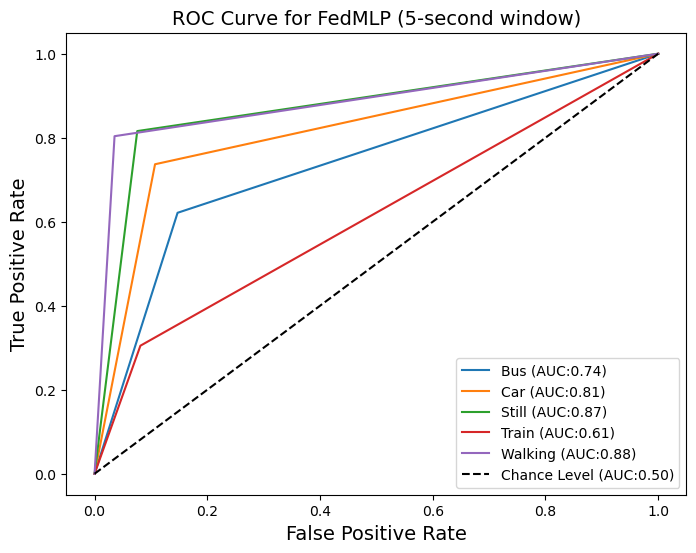

30/30 [==============================] - 0s 4ms/step - loss: 1.0018 - sparse_categorical_accuracy: 0.6104
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 16 | global_acc: 64.801% | global_loss: 1.3714839220046997
              precision    recall  f1-score   support

           0       0.50      0.69      0.58       235
           1       0.62      0.73      0.67       228
           2       0.75      0.81      0.78       228
           3       0.56      0.27      0.36       269
           4       0.85      0.81      0.83       219

    accuracy                           0.65      1179
   macro avg       0.66      0.66      0.64      1179
weighted avg       0.65      0.65      0.63      1179

0.7873600563891552


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


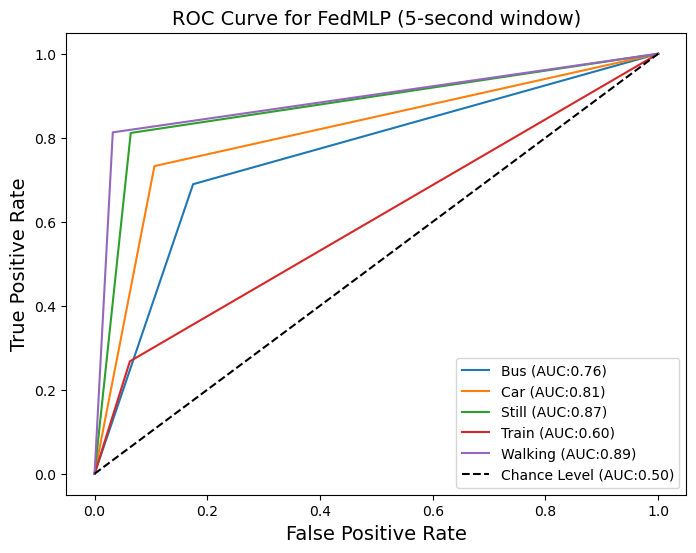

30/30 [==============================] - 0s 4ms/step - loss: 0.9663 - sparse_categorical_accuracy: 0.6242
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 17 | global_acc: 65.818% | global_loss: 1.3634403944015503
              precision    recall  f1-score   support

           0       0.52      0.65      0.58       235
           1       0.66      0.68      0.67       228
           2       0.75      0.82      0.78       228
           3       0.55      0.41      0.46       269
           4       0.87      0.80      0.83       219

    accuracy                           0.66      1179
   macro avg       0.67      0.67      0.66      1179
weighted avg       0.66      0.66      0.65      1179

0.7913418834631866


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


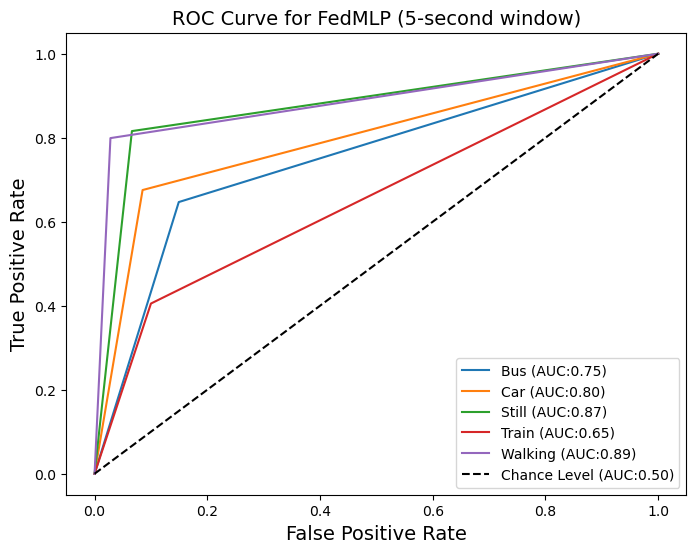

30/30 [==============================] - 0s 6ms/step - loss: 0.9662 - sparse_categorical_accuracy: 0.6285
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 18 | global_acc: 65.734% | global_loss: 1.3576252460479736
              precision    recall  f1-score   support

           0       0.54      0.60      0.57       235
           1       0.63      0.72      0.67       228
           2       0.71      0.85      0.77       228
           3       0.54      0.38      0.44       269
           4       0.88      0.79      0.84       219

    accuracy                           0.66      1179
   macro avg       0.66      0.67      0.66      1179
weighted avg       0.65      0.66      0.65      1179

0.7914053447834043


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


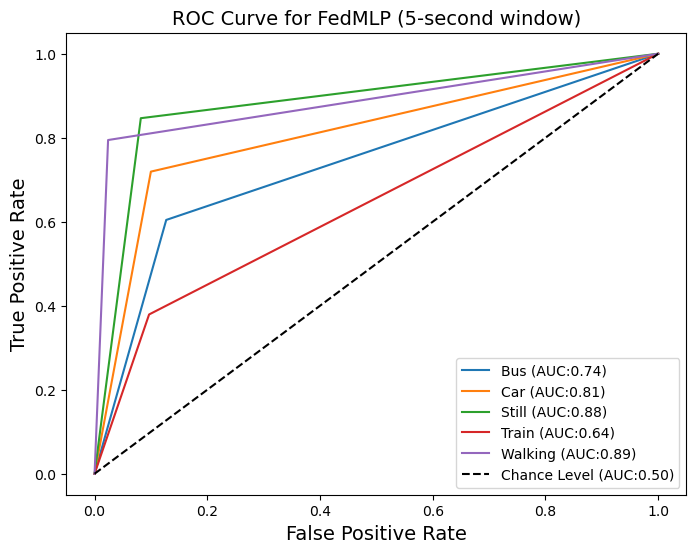

30/30 [==============================] - 0s 5ms/step - loss: 1.0158 - sparse_categorical_accuracy: 0.5966
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 19 | global_acc: 65.818% | global_loss: 1.3477388620376587
              precision    recall  f1-score   support

           0       0.56      0.59      0.57       235
           1       0.66      0.68      0.67       228
           2       0.69      0.85      0.76       228
           3       0.53      0.41      0.46       269
           4       0.86      0.81      0.83       219

    accuracy                           0.66      1179
   macro avg       0.66      0.67      0.66      1179
weighted avg       0.65      0.66      0.65      1179

0.7914199117664642


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


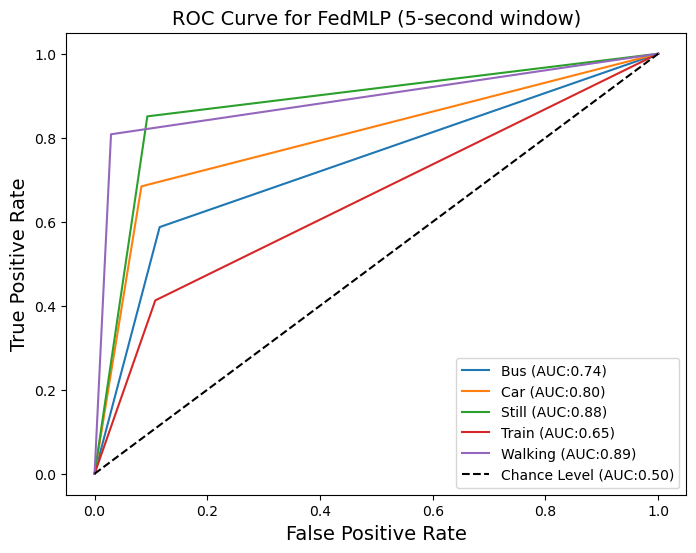

30/30 [==============================] - 0s 5ms/step - loss: 0.9733 - sparse_categorical_accuracy: 0.6104
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 20 | global_acc: 67.091% | global_loss: 1.3399006128311157
              precision    recall  f1-score   support

           0       0.55      0.61      0.58       235
           1       0.67      0.71      0.69       228
           2       0.72      0.83      0.77       228
           3       0.56      0.43      0.48       269
           4       0.86      0.83      0.85       219

    accuracy                           0.67      1179
   macro avg       0.67      0.68      0.67      1179
weighted avg       0.67      0.67      0.67      1179

0.7993622399187393


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


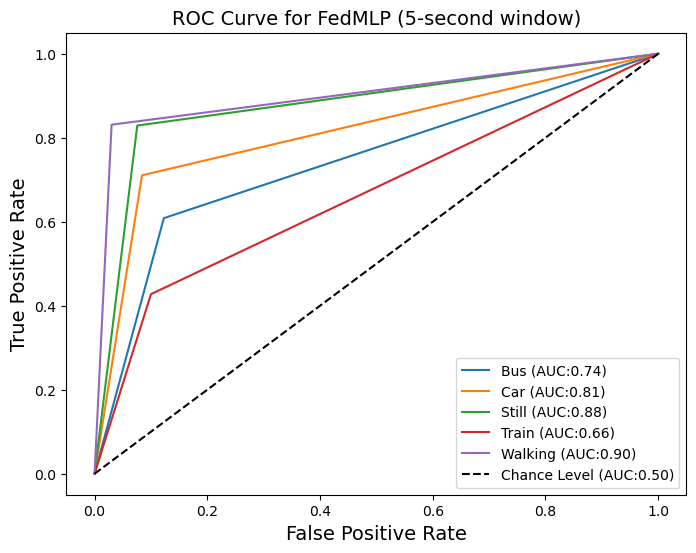

30/30 [==============================] - 0s 4ms/step - loss: 0.9031 - sparse_categorical_accuracy: 0.6316
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 21 | global_acc: 67.939% | global_loss: 1.3323702812194824
              precision    recall  f1-score   support

           0       0.56      0.63      0.59       235
           1       0.65      0.72      0.69       228
           2       0.76      0.82      0.79       228
           3       0.59      0.41      0.48       269
           4       0.84      0.87      0.85       219

    accuracy                           0.68      1179
   macro avg       0.68      0.69      0.68      1179
weighted avg       0.67      0.68      0.67      1179

0.8052852970054512


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


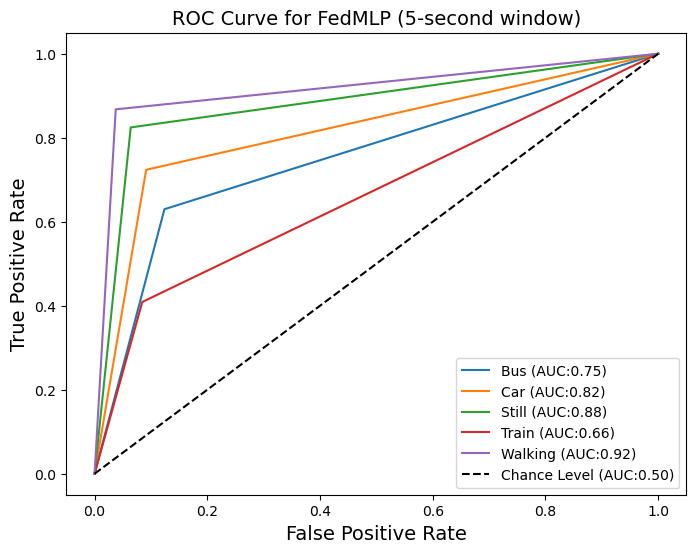

30/30 [==============================] - 0s 4ms/step - loss: 0.8948 - sparse_categorical_accuracy: 0.6465
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 22 | global_acc: 67.939% | global_loss: 1.3244061470031738
              precision    recall  f1-score   support

           0       0.56      0.66      0.61       235
           1       0.66      0.73      0.69       228
           2       0.72      0.85      0.78       228
           3       0.62      0.37      0.46       269
           4       0.86      0.85      0.86       219

    accuracy                           0.68      1179
   macro avg       0.68      0.69      0.68      1179
weighted avg       0.68      0.68      0.67      1179

0.8059274640000982


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


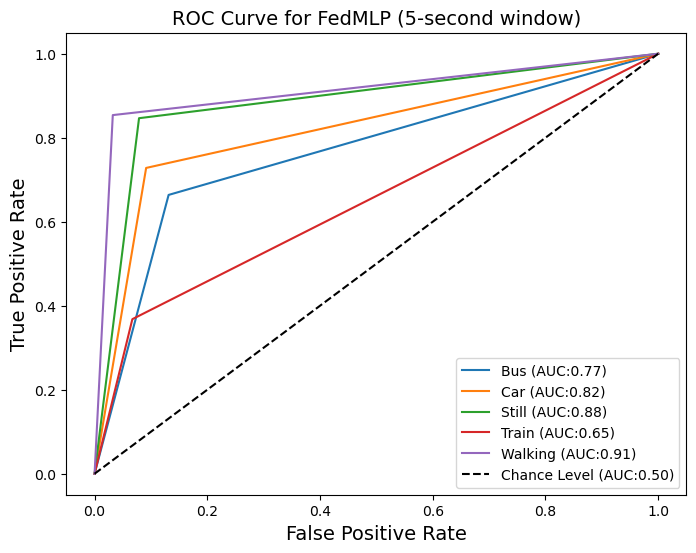

30/30 [==============================] - 0s 3ms/step - loss: 0.9354 - sparse_categorical_accuracy: 0.6412
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 23 | global_acc: 68.617% | global_loss: 1.3192306756973267
              precision    recall  f1-score   support

           0       0.60      0.56      0.58       235
           1       0.65      0.78      0.71       228
           2       0.72      0.85      0.78       228
           3       0.60      0.45      0.51       269
           4       0.86      0.85      0.86       219

    accuracy                           0.69      1179
   macro avg       0.68      0.70      0.69      1179
weighted avg       0.68      0.69      0.68      1179

0.8091375107343761


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


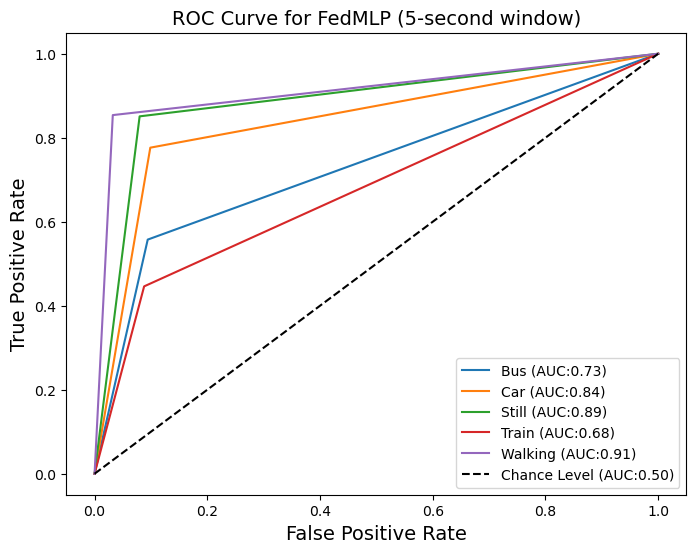

30/30 [==============================] - 0s 4ms/step - loss: 0.8617 - sparse_categorical_accuracy: 0.6688
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 24 | global_acc: 68.278% | global_loss: 1.3146967887878418
              precision    recall  f1-score   support

           0       0.59      0.62      0.60       235
           1       0.67      0.75      0.71       228
           2       0.67      0.89      0.76       228
           3       0.62      0.40      0.49       269
           4       0.89      0.81      0.85       219

    accuracy                           0.68      1179
   macro avg       0.69      0.69      0.68      1179
weighted avg       0.68      0.68      0.67      1179

0.8074724171030688


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


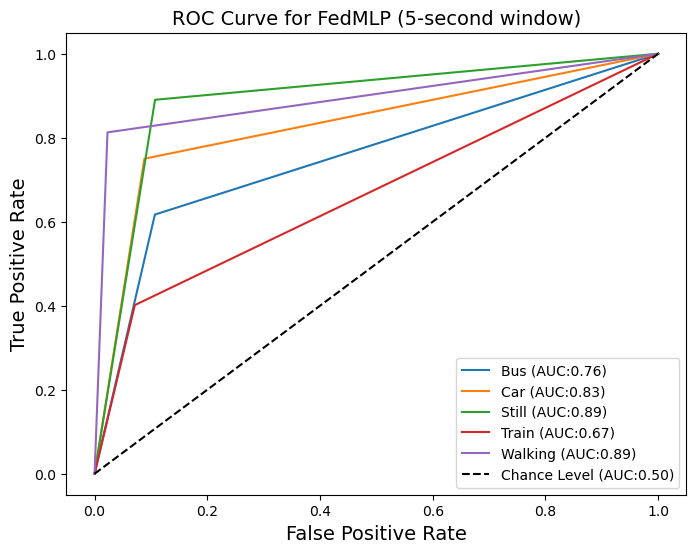

30/30 [==============================] - 0s 4ms/step - loss: 0.9184 - sparse_categorical_accuracy: 0.6401
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 25 | global_acc: 68.702% | global_loss: 1.3081750869750977
              precision    recall  f1-score   support

           0       0.58      0.66      0.62       235
           1       0.64      0.80      0.71       228
           2       0.72      0.86      0.78       228
           3       0.65      0.33      0.44       269
           4       0.87      0.85      0.86       219

    accuracy                           0.69      1179
   macro avg       0.69      0.70      0.68      1179
weighted avg       0.69      0.69      0.67      1179

0.8115009293280618


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


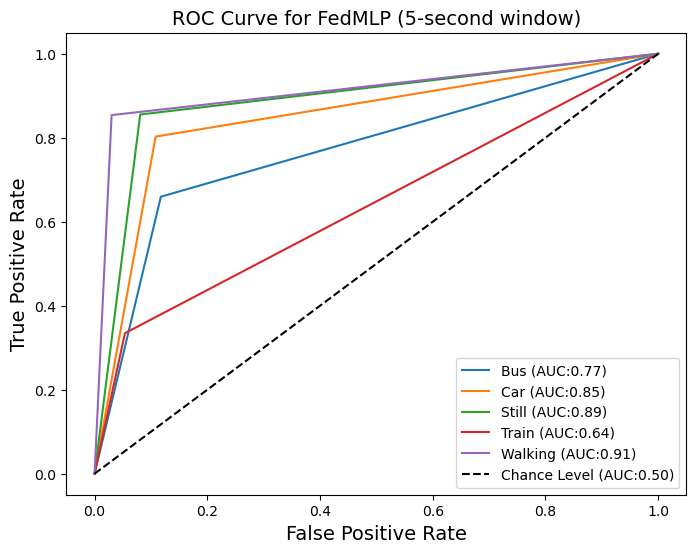

30/30 [==============================] - 0s 4ms/step - loss: 0.8562 - sparse_categorical_accuracy: 0.6709
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 26 | global_acc: 70.568% | global_loss: 1.3014451265335083
              precision    recall  f1-score   support

           0       0.63      0.63      0.63       235
           1       0.69      0.78      0.73       228
           2       0.69      0.87      0.77       228
           3       0.66      0.45      0.54       269
           4       0.87      0.85      0.86       219

    accuracy                           0.71      1179
   macro avg       0.71      0.72      0.71      1179
weighted avg       0.70      0.71      0.70      1179

0.8213460858068441


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


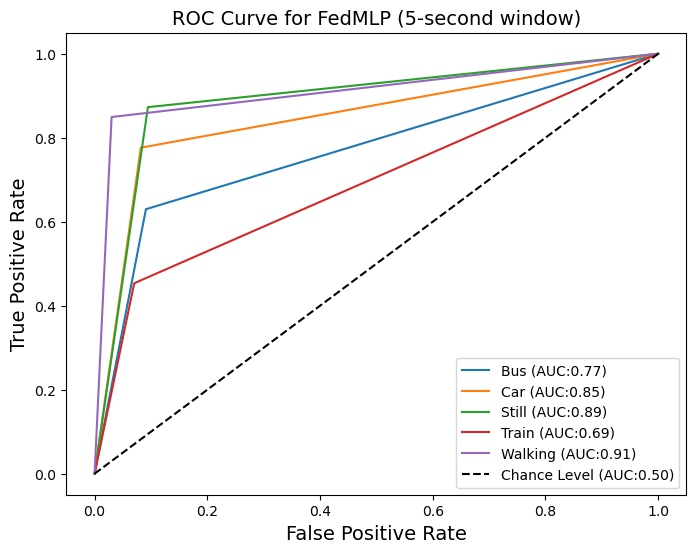

30/30 [==============================] - 0s 6ms/step - loss: 0.8281 - sparse_categorical_accuracy: 0.6837
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 27 | global_acc: 70.992% | global_loss: 1.295174241065979
              precision    recall  f1-score   support

           0       0.61      0.70      0.65       235
           1       0.70      0.75      0.73       228
           2       0.70      0.87      0.77       228
           3       0.69      0.42      0.53       269
           4       0.87      0.85      0.86       219

    accuracy                           0.71      1179
   macro avg       0.71      0.72      0.71      1179
weighted avg       0.71      0.71      0.70      1179

0.8244421198872631


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


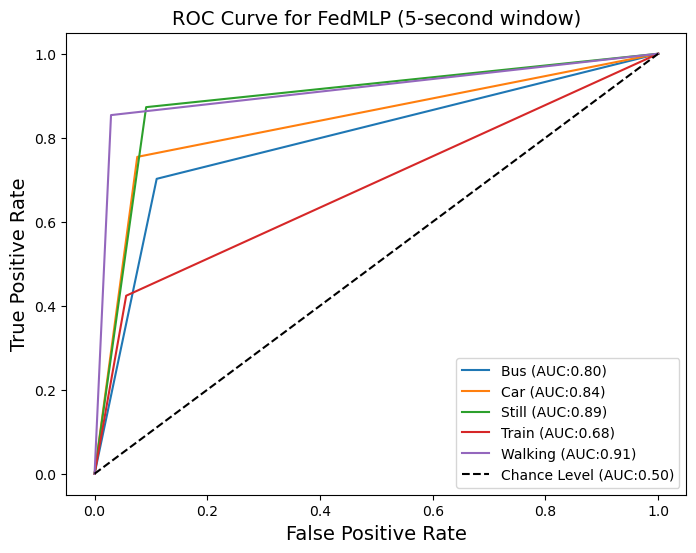

30/30 [==============================] - 0s 4ms/step - loss: 0.8522 - sparse_categorical_accuracy: 0.6677
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 28 | global_acc: 73.622% | global_loss: 1.2956801652908325
              precision    recall  f1-score   support

           0       0.61      0.78      0.68       235
           1       0.72      0.77      0.75       228
           2       0.83      0.81      0.82       228
           3       0.68      0.52      0.59       269
           4       0.90      0.84      0.87       219

    accuracy                           0.74      1179
   macro avg       0.75      0.74      0.74      1179
weighted avg       0.74      0.74      0.73      1179

0.8391182618996744


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


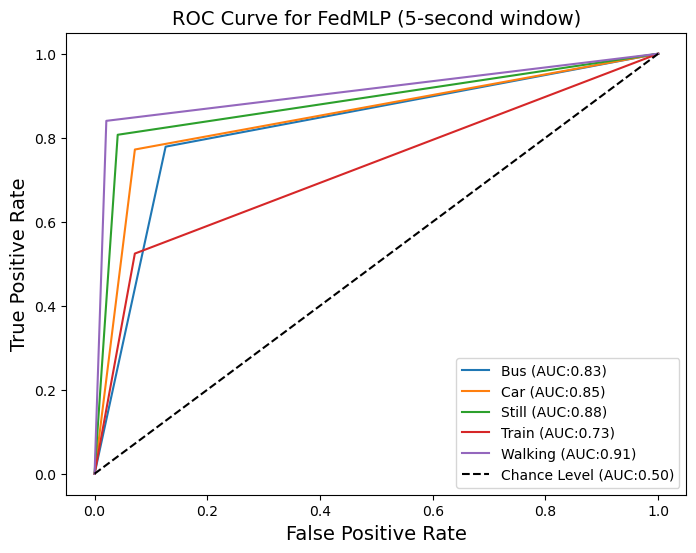

30/30 [==============================] - 0s 5ms/step - loss: 0.8288 - sparse_categorical_accuracy: 0.6794
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 29 | global_acc: 72.349% | global_loss: 1.2870914936065674
              precision    recall  f1-score   support

           0       0.63      0.71      0.66       235
           1       0.72      0.79      0.75       228
           2       0.69      0.89      0.78       228
           3       0.73      0.45      0.56       269
           4       0.90      0.83      0.86       219

    accuracy                           0.72      1179
   macro avg       0.73      0.73      0.72      1179
weighted avg       0.73      0.72      0.72      1179

0.8325285599656038


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


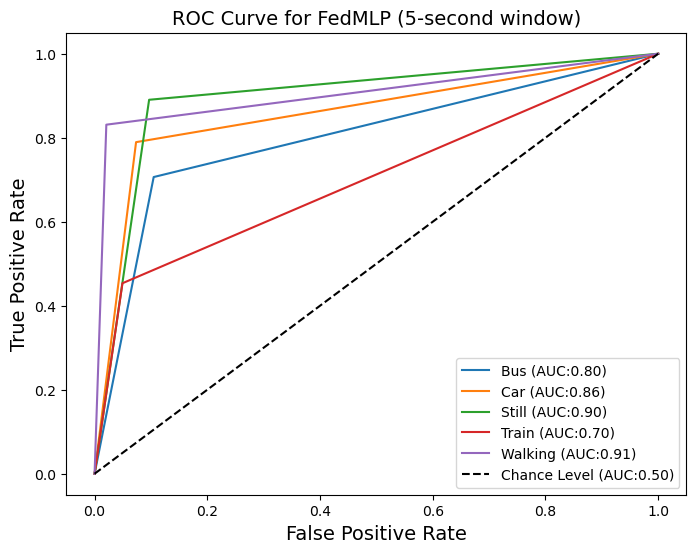

30/30 [==============================] - 0s 5ms/step - loss: 0.8508 - sparse_categorical_accuracy: 0.6879
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 30 | global_acc: 74.300% | global_loss: 1.2787928581237793
              precision    recall  f1-score   support

           0       0.68      0.69      0.69       235
           1       0.74      0.78      0.76       228
           2       0.71      0.89      0.79       228
           3       0.73      0.52      0.61       269
           4       0.86      0.88      0.87       219

    accuracy                           0.74      1179
   macro avg       0.75      0.75      0.74      1179
weighted avg       0.74      0.74      0.74      1179

0.8440172951390231


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


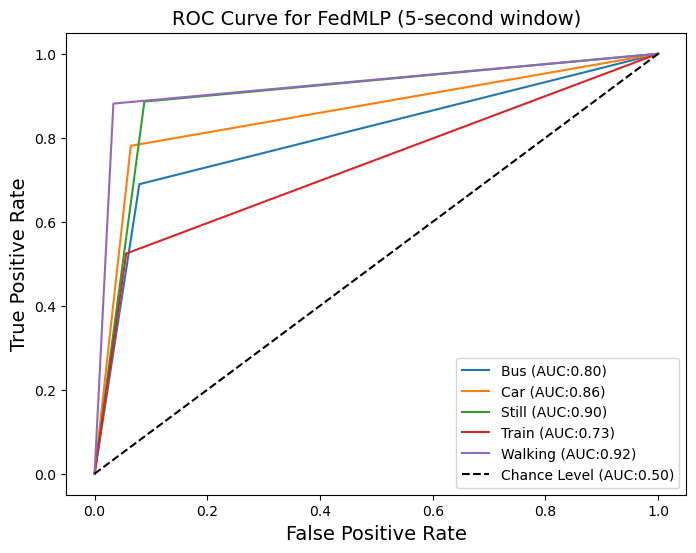

30/30 [==============================] - 0s 4ms/step - loss: 0.7958 - sparse_categorical_accuracy: 0.6964
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 31 | global_acc: 74.640% | global_loss: 1.2743135690689087
              precision    recall  f1-score   support

           0       0.64      0.77      0.70       235
           1       0.76      0.77      0.76       228
           2       0.77      0.83      0.80       228
           3       0.71      0.54      0.61       269
           4       0.88      0.87      0.87       219

    accuracy                           0.75      1179
   macro avg       0.75      0.75      0.75      1179
weighted avg       0.75      0.75      0.74      1179

0.8454992023295281


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


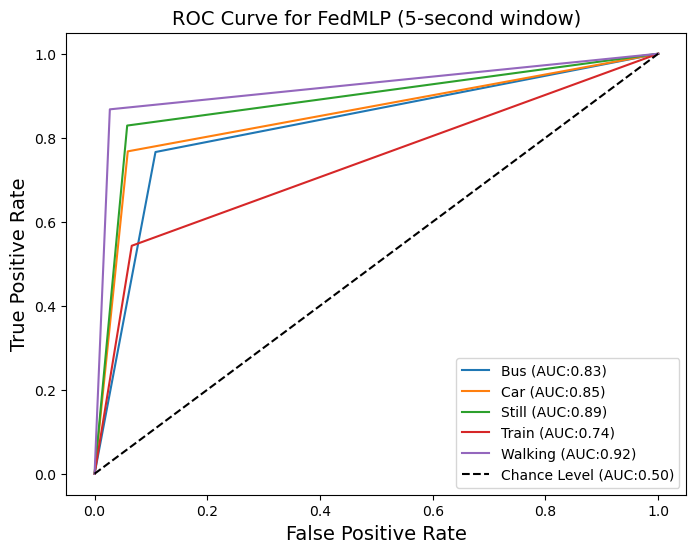

30/30 [==============================] - 0s 4ms/step - loss: 0.8025 - sparse_categorical_accuracy: 0.6900
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 32 | global_acc: 75.657% | global_loss: 1.2733566761016846
              precision    recall  f1-score   support

           0       0.61      0.81      0.70       235
           1       0.78      0.78      0.78       228
           2       0.83      0.81      0.82       228
           3       0.73      0.57      0.64       269
           4       0.89      0.85      0.87       219

    accuracy                           0.76      1179
   macro avg       0.77      0.76      0.76      1179
weighted avg       0.77      0.76      0.76      1179

0.8513048687629796


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


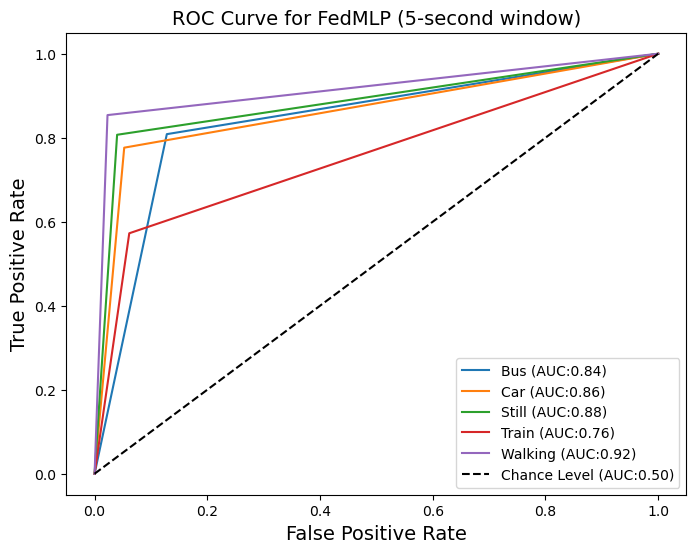

30/30 [==============================] - 0s 4ms/step - loss: 0.7767 - sparse_categorical_accuracy: 0.7187
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 33 | global_acc: 76.166% | global_loss: 1.2676724195480347
              precision    recall  f1-score   support

           0       0.64      0.79      0.70       235
           1       0.81      0.77      0.79       228
           2       0.75      0.86      0.80       228
           3       0.75      0.59      0.66       269
           4       0.91      0.83      0.87       219

    accuracy                           0.76      1179
   macro avg       0.77      0.77      0.77      1179
weighted avg       0.77      0.76      0.76      1179

0.8542367853140543


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


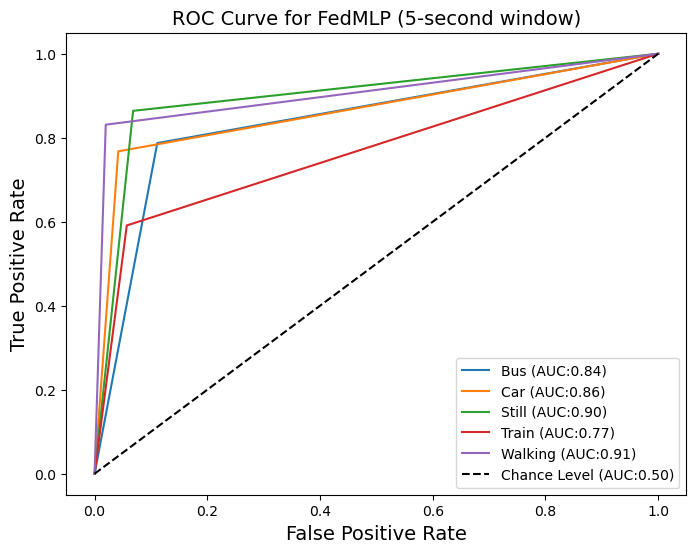

30/30 [==============================] - 0s 4ms/step - loss: 0.7585 - sparse_categorical_accuracy: 0.7070
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 34 | global_acc: 74.894% | global_loss: 1.2582330703735352
              precision    recall  f1-score   support

           0       0.68      0.71      0.70       235
           1       0.77      0.78      0.77       228
           2       0.68      0.89      0.77       228
           3       0.78      0.54      0.63       269
           4       0.87      0.88      0.87       219

    accuracy                           0.75      1179
   macro avg       0.76      0.76      0.75      1179
weighted avg       0.76      0.75      0.74      1179

0.8475678781114541


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


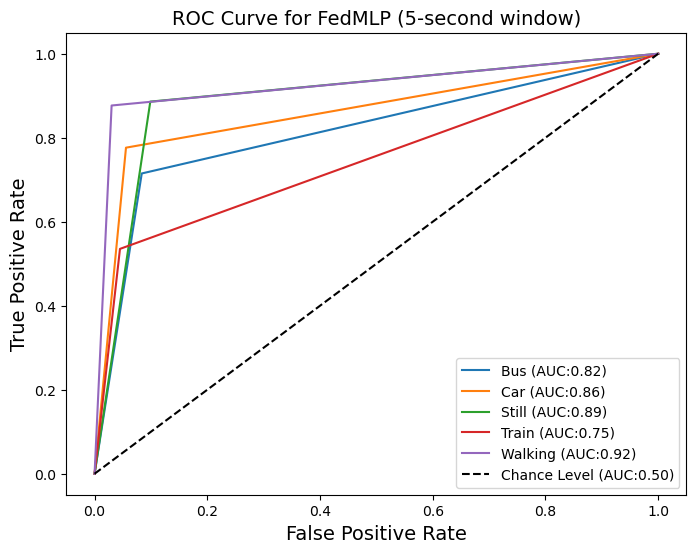

30/30 [==============================] - 0s 5ms/step - loss: 0.7669 - sparse_categorical_accuracy: 0.7335
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 35 | global_acc: 76.336% | global_loss: 1.2548352479934692
              precision    recall  f1-score   support

           0       0.68      0.75      0.72       235
           1       0.80      0.80      0.80       228
           2       0.70      0.89      0.78       228
           3       0.80      0.54      0.65       269
           4       0.88      0.88      0.88       219

    accuracy                           0.76      1179
   macro avg       0.77      0.77      0.76      1179
weighted avg       0.77      0.76      0.76      1179

0.8566058534921069


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


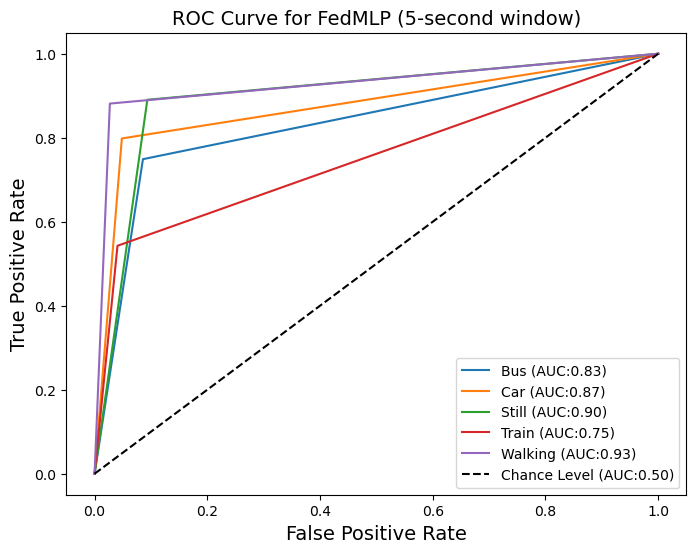

30/30 [==============================] - 0s 5ms/step - loss: 0.7376 - sparse_categorical_accuracy: 0.7229
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 36 | global_acc: 77.523% | global_loss: 1.2520147562026978
              precision    recall  f1-score   support

           0       0.73      0.68      0.70       235
           1       0.78      0.80      0.79       228
           2       0.72      0.89      0.80       228
           3       0.78      0.65      0.71       269
           4       0.88      0.89      0.88       219

    accuracy                           0.78      1179
   macro avg       0.78      0.78      0.78      1179
weighted avg       0.78      0.78      0.77      1179

0.8625284019518021


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


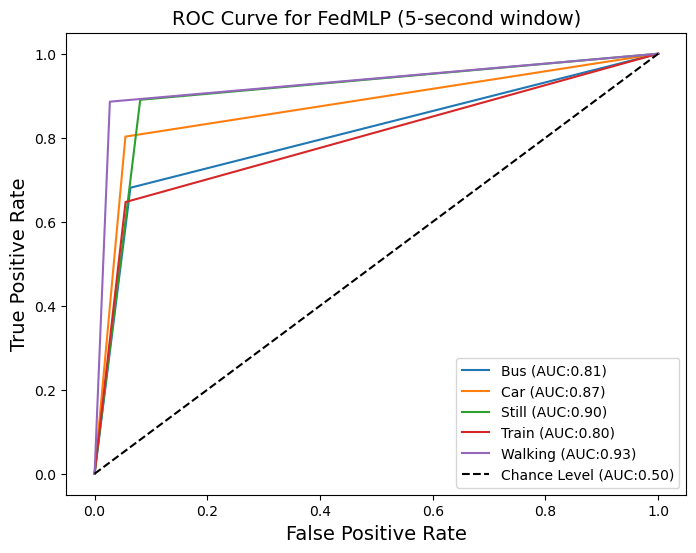

30/30 [==============================] - 1s 4ms/step - loss: 0.7447 - sparse_categorical_accuracy: 0.7251
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 37 | global_acc: 77.523% | global_loss: 1.2483309507369995
              precision    recall  f1-score   support

           0       0.67      0.77      0.72       235
           1       0.81      0.80      0.80       228
           2       0.79      0.81      0.80       228
           3       0.75      0.62      0.68       269
           4       0.88      0.90      0.89       219

    accuracy                           0.78      1179
   macro avg       0.78      0.78      0.78      1179
weighted avg       0.78      0.78      0.77      1179

0.8626443326864066


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


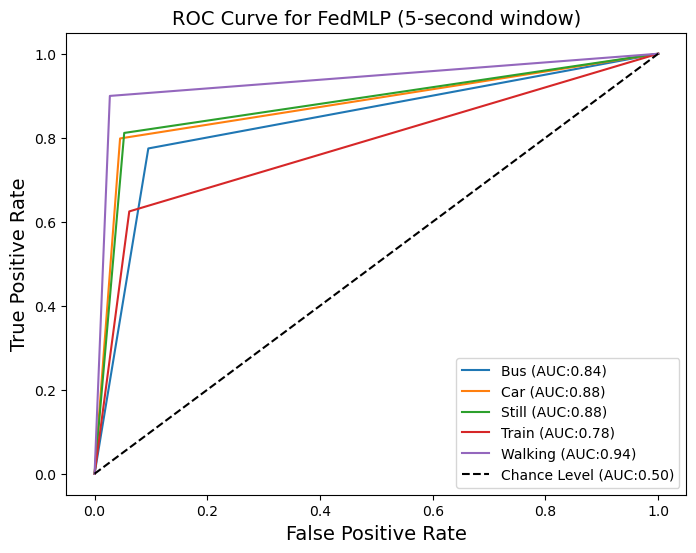

30/30 [==============================] - 0s 4ms/step - loss: 0.7128 - sparse_categorical_accuracy: 0.7346
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 38 | global_acc: 78.626% | global_loss: 1.24517023563385
              precision    recall  f1-score   support

           0       0.65      0.83      0.73       235
           1       0.83      0.80      0.81       228
           2       0.83      0.81      0.82       228
           3       0.79      0.64      0.70       269
           4       0.89      0.88      0.89       219

    accuracy                           0.79      1179
   macro avg       0.80      0.79      0.79      1179
weighted avg       0.80      0.79      0.79      1179

0.8692170958438872


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


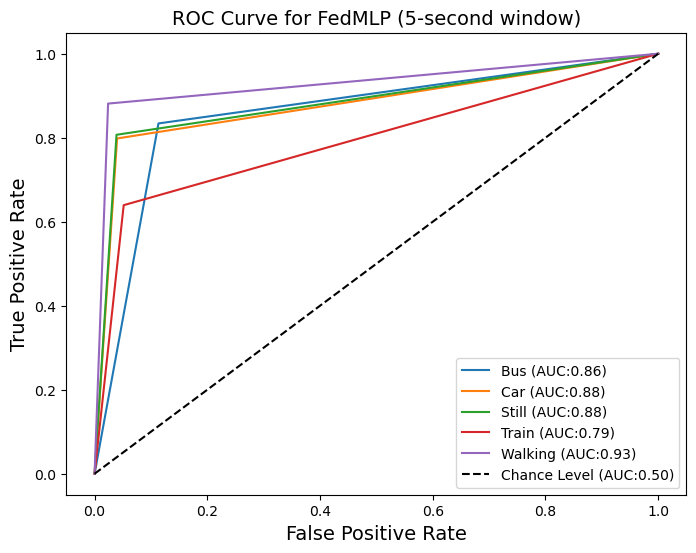

30/30 [==============================] - 0s 4ms/step - loss: 0.7432 - sparse_categorical_accuracy: 0.7325
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 39 | global_acc: 77.354% | global_loss: 1.241517424583435
              precision    recall  f1-score   support

           0       0.63      0.83      0.72       235
           1       0.85      0.75      0.80       228
           2       0.75      0.87      0.81       228
           3       0.82      0.59      0.69       269
           4       0.89      0.85      0.87       219

    accuracy                           0.77      1179
   macro avg       0.79      0.78      0.78      1179
weighted avg       0.79      0.77      0.77      1179

0.8619429698814625


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


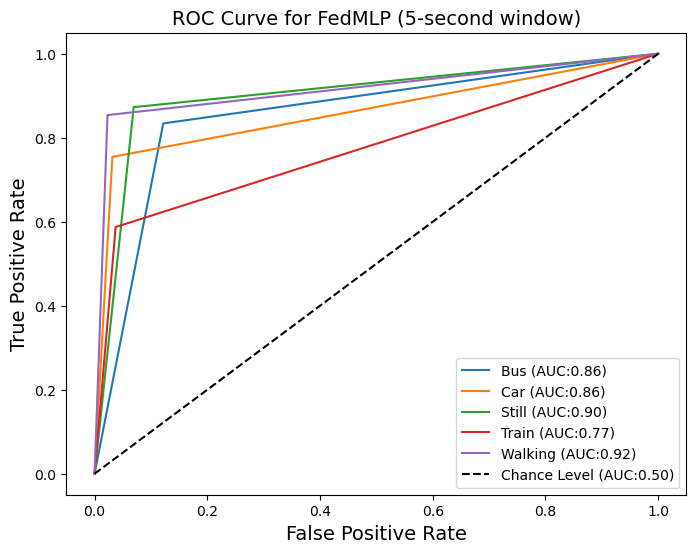

30/30 [==============================] - 0s 4ms/step - loss: 0.7805 - sparse_categorical_accuracy: 0.7229
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 40 | global_acc: 78.541% | global_loss: 1.2403385639190674
              precision    recall  f1-score   support

           0       0.68      0.80      0.73       235
           1       0.85      0.75      0.80       228
           2       0.75      0.87      0.81       228
           3       0.79      0.68      0.73       269
           4       0.91      0.84      0.87       219

    accuracy                           0.79      1179
   macro avg       0.80      0.79      0.79      1179
weighted avg       0.79      0.79      0.79      1179

0.8678838895878804


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


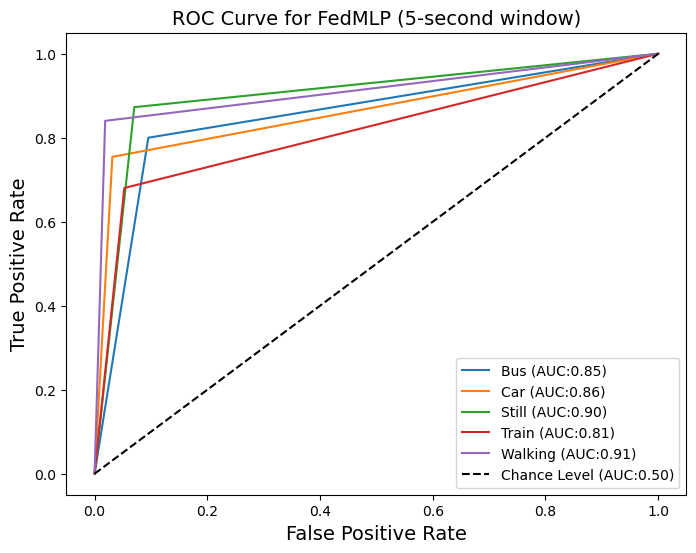

30/30 [==============================] - 0s 4ms/step - loss: 0.7790 - sparse_categorical_accuracy: 0.6953
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 41 | global_acc: 78.880% | global_loss: 1.2370970249176025
              precision    recall  f1-score   support

           0       0.65      0.82      0.72       235
           1       0.82      0.82      0.82       228
           2       0.85      0.81      0.83       228
           3       0.79      0.64      0.71       269
           4       0.89      0.89      0.89       219

    accuracy                           0.79      1179
   macro avg       0.80      0.79      0.79      1179
weighted avg       0.80      0.79      0.79      1179

0.8709627372163166


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


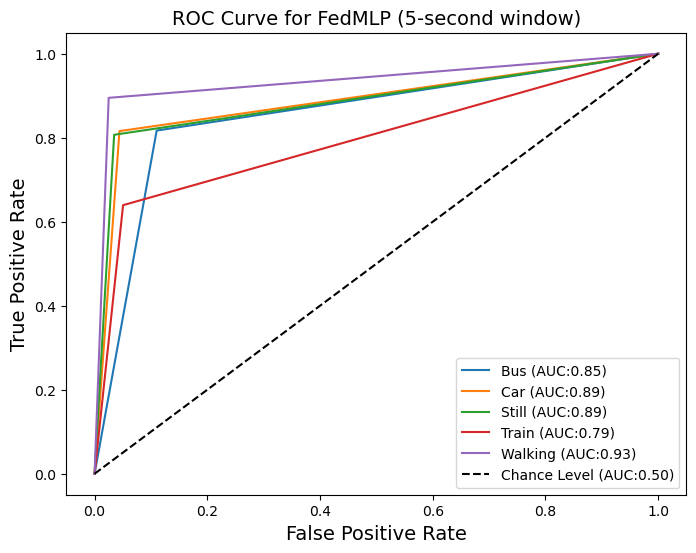

30/30 [==============================] - 0s 5ms/step - loss: 0.7160 - sparse_categorical_accuracy: 0.7452
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 42 | global_acc: 79.813% | global_loss: 1.2277228832244873
              precision    recall  f1-score   support

           0       0.72      0.79      0.75       235
           1       0.85      0.79      0.82       228
           2       0.77      0.84      0.81       228
           3       0.78      0.72      0.75       269
           4       0.89      0.87      0.88       219

    accuracy                           0.80      1179
   macro avg       0.80      0.80      0.80      1179
weighted avg       0.80      0.80      0.80      1179

0.875367116305048


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


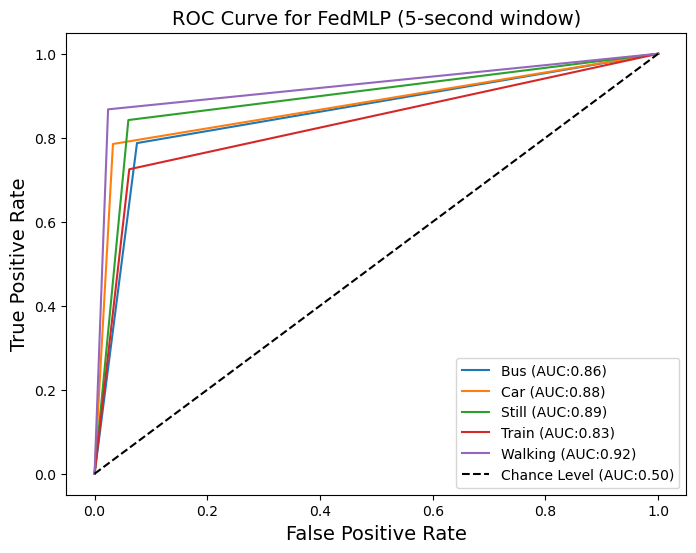

30/30 [==============================] - 0s 4ms/step - loss: 0.7089 - sparse_categorical_accuracy: 0.7261
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 43 | global_acc: 80.492% | global_loss: 1.22500741481781
              precision    recall  f1-score   support

           0       0.72      0.78      0.75       235
           1       0.84      0.81      0.82       228
           2       0.85      0.82      0.83       228
           3       0.76      0.78      0.77       269
           4       0.90      0.85      0.87       219

    accuracy                           0.80      1179
   macro avg       0.81      0.81      0.81      1179
weighted avg       0.81      0.80      0.81      1179

0.878671277154352


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


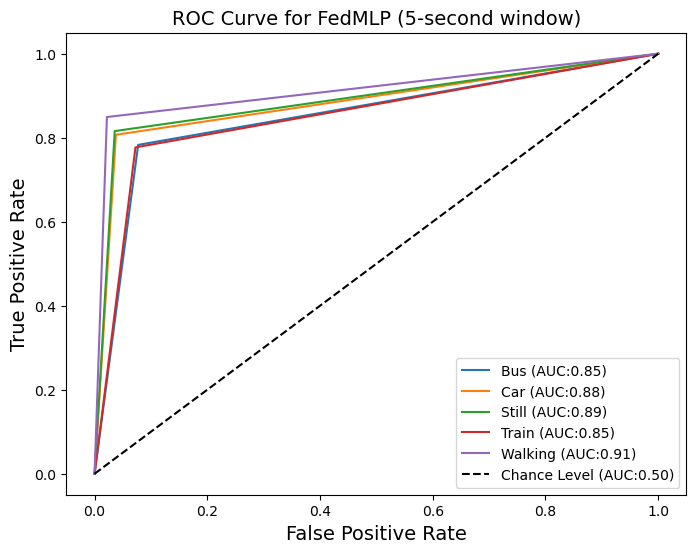

30/30 [==============================] - 0s 4ms/step - loss: 0.6914 - sparse_categorical_accuracy: 0.7558
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 44 | global_acc: 79.983% | global_loss: 1.2182024717330933
              precision    recall  f1-score   support

           0       0.75      0.74      0.75       235
           1       0.84      0.78      0.81       228
           2       0.81      0.82      0.82       228
           3       0.73      0.78      0.75       269
           4       0.90      0.88      0.89       219

    accuracy                           0.80      1179
   macro avg       0.81      0.80      0.80      1179
weighted avg       0.80      0.80      0.80      1179

0.8755545815811979


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


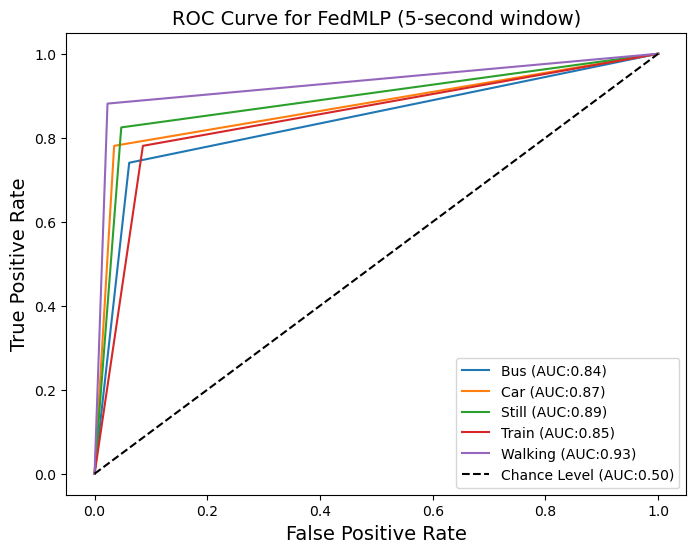

30/30 [==============================] - 0s 4ms/step - loss: 0.6973 - sparse_categorical_accuracy: 0.7463
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 45 | global_acc: 79.220% | global_loss: 1.2188928127288818
              precision    recall  f1-score   support

           0       0.70      0.77      0.74       235
           1       0.88      0.75      0.81       228
           2       0.75      0.86      0.80       228
           3       0.77      0.75      0.76       269
           4       0.91      0.84      0.87       219

    accuracy                           0.79      1179
   macro avg       0.80      0.79      0.80      1179
weighted avg       0.80      0.79      0.79      1179

0.8709906796525615


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


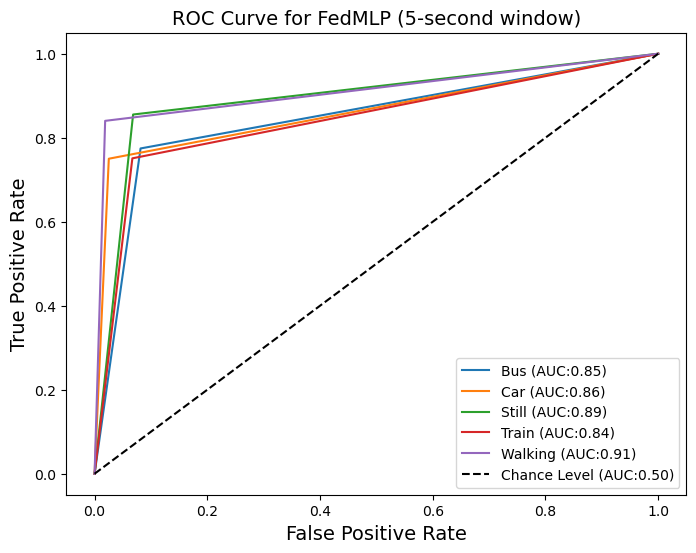

30/30 [==============================] - 0s 5ms/step - loss: 0.7135 - sparse_categorical_accuracy: 0.7282
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 46 | global_acc: 80.153% | global_loss: 1.2150112390518188
              precision    recall  f1-score   support

           0       0.70      0.79      0.75       235
           1       0.87      0.77      0.82       228
           2       0.78      0.84      0.81       228
           3       0.79      0.76      0.77       269
           4       0.90      0.86      0.88       219

    accuracy                           0.80      1179
   macro avg       0.81      0.80      0.80      1179
weighted avg       0.81      0.80      0.80      1179

0.8768934005799263


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


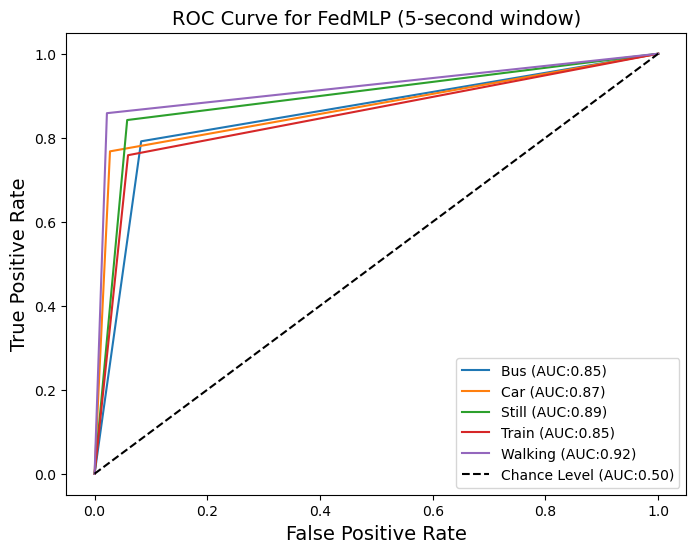

30/30 [==============================] - 0s 4ms/step - loss: 0.6754 - sparse_categorical_accuracy: 0.7580
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 47 | global_acc: 80.322% | global_loss: 1.2118196487426758
              precision    recall  f1-score   support

           0       0.74      0.76      0.75       235
           1       0.85      0.79      0.82       228
           2       0.72      0.89      0.80       228
           3       0.84      0.71      0.77       269
           4       0.89      0.89      0.89       219

    accuracy                           0.80      1179
   macro avg       0.81      0.81      0.81      1179
weighted avg       0.81      0.80      0.80      1179

0.8791575900120318


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


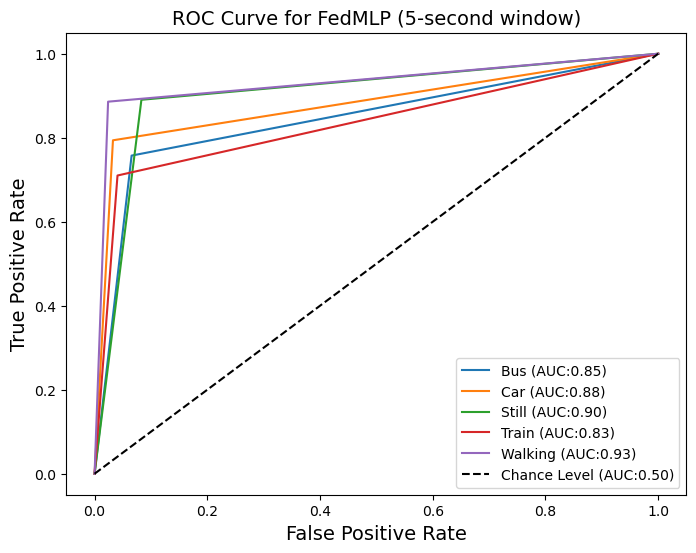

30/30 [==============================] - 0s 5ms/step - loss: 0.7106 - sparse_categorical_accuracy: 0.7590
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 48 | global_acc: 79.304% | global_loss: 1.2089537382125854
              precision    recall  f1-score   support

           0       0.68      0.83      0.74       235
           1       0.87      0.77      0.82       228
           2       0.71      0.89      0.79       228
           3       0.89      0.61      0.73       269
           4       0.90      0.89      0.90       219

    accuracy                           0.79      1179
   macro avg       0.81      0.80      0.80      1179
weighted avg       0.81      0.79      0.79      1179

0.874253081886053


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


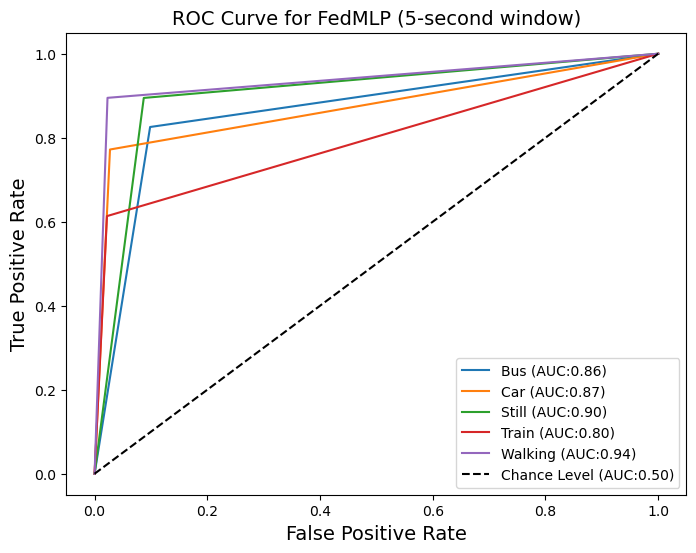

30/30 [==============================] - 0s 4ms/step - loss: 0.6728 - sparse_categorical_accuracy: 0.7389
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 49 | global_acc: 80.322% | global_loss: 1.2053214311599731
              precision    recall  f1-score   support

           0       0.71      0.80      0.75       235
           1       0.87      0.79      0.83       228
           2       0.76      0.86      0.81       228
           3       0.82      0.71      0.76       269
           4       0.89      0.88      0.88       219

    accuracy                           0.80      1179
   macro avg       0.81      0.81      0.81      1179
weighted avg       0.81      0.80      0.80      1179

0.8789009466080699


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


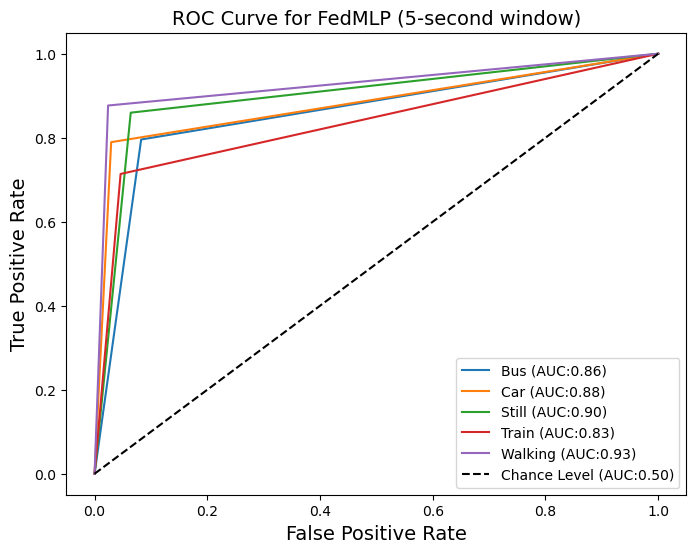

30/30 [==============================] - 0s 4ms/step - loss: 0.6757 - sparse_categorical_accuracy: 0.7548
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 50 | global_acc: 81.510% | global_loss: 1.2023272514343262
              precision    recall  f1-score   support

           0       0.72      0.80      0.76       235
           1       0.87      0.79      0.83       228
           2       0.86      0.79      0.82       228
           3       0.77      0.82      0.80       269
           4       0.90      0.87      0.89       219

    accuracy                           0.82      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.82      0.82      1179

0.884493638127451


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


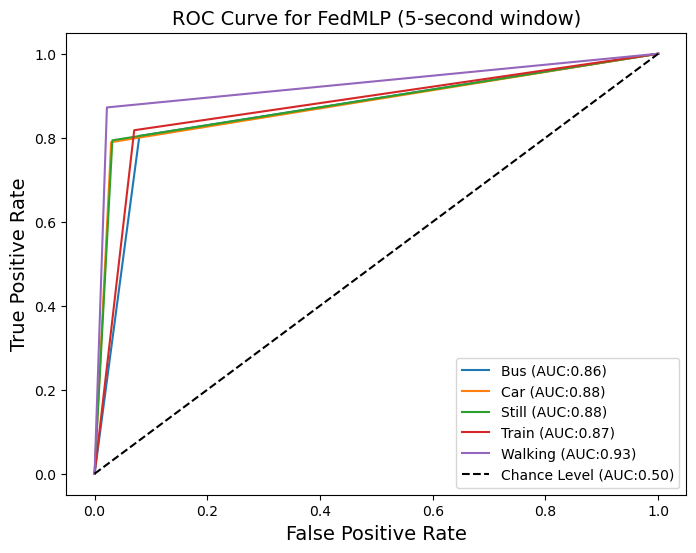

30/30 [==============================] - 0s 4ms/step - loss: 0.6365 - sparse_categorical_accuracy: 0.7707
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 51 | global_acc: 80.746% | global_loss: 1.195440649986267
              precision    recall  f1-score   support

           0       0.72      0.78      0.75       235
           1       0.87      0.77      0.82       228
           2       0.79      0.84      0.81       228
           3       0.80      0.76      0.78       269
           4       0.89      0.89      0.89       219

    accuracy                           0.81      1179
   macro avg       0.81      0.81      0.81      1179
weighted avg       0.81      0.81      0.81      1179

0.8808928031034056


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


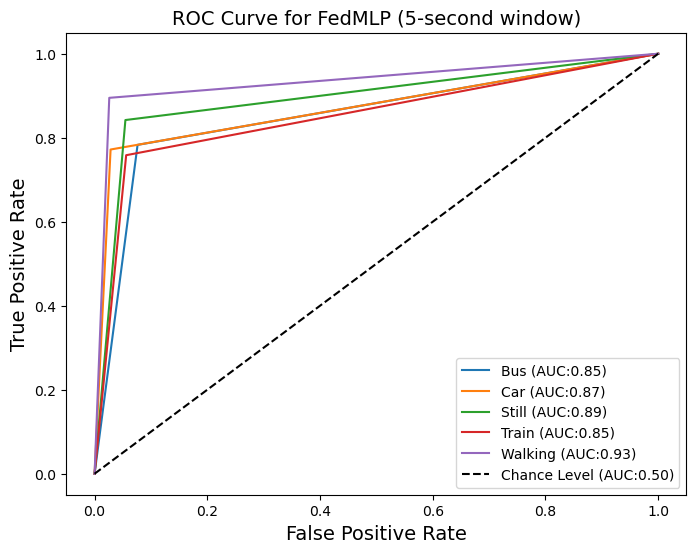

30/30 [==============================] - 0s 5ms/step - loss: 0.6997 - sparse_categorical_accuracy: 0.7548
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 52 | global_acc: 81.255% | global_loss: 1.196591854095459
              precision    recall  f1-score   support

           0       0.72      0.78      0.75       235
           1       0.84      0.81      0.82       228
           2       0.82      0.83      0.83       228
           3       0.81      0.75      0.78       269
           4       0.88      0.90      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.81      1179
weighted avg       0.81      0.81      0.81      1179

0.8842601070295875


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


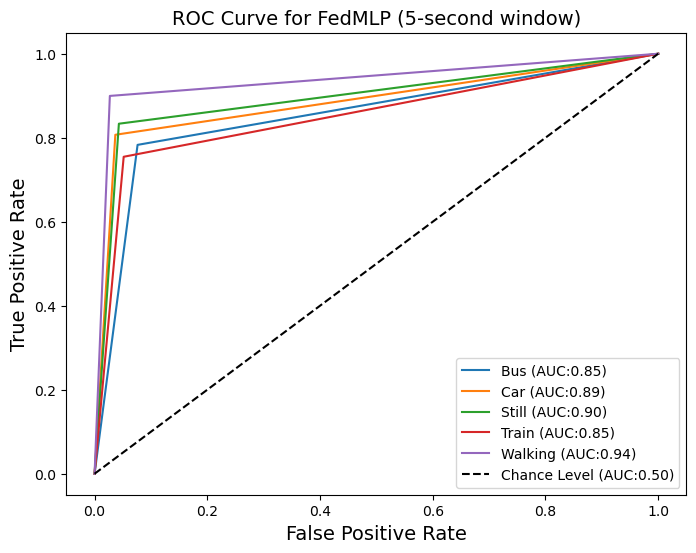

30/30 [==============================] - 0s 4ms/step - loss: 0.6429 - sparse_categorical_accuracy: 0.7760
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 53 | global_acc: 81.001% | global_loss: 1.194883942604065
              precision    recall  f1-score   support

           0       0.72      0.79      0.76       235
           1       0.87      0.79      0.83       228
           2       0.76      0.87      0.81       228
           3       0.83      0.73      0.78       269
           4       0.89      0.89      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.81      0.81      1179
weighted avg       0.81      0.81      0.81      1179

0.8830703503481478


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


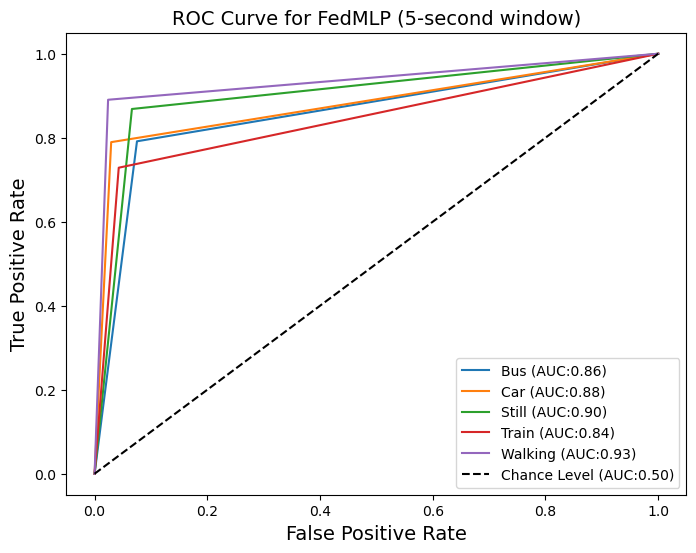

30/30 [==============================] - 0s 5ms/step - loss: 0.6908 - sparse_categorical_accuracy: 0.7410
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 54 | global_acc: 80.662% | global_loss: 1.1948126554489136
              precision    recall  f1-score   support

           0       0.66      0.86      0.74       235
           1       0.87      0.77      0.82       228
           2       0.86      0.81      0.83       228
           3       0.83      0.71      0.76       269
           4       0.89      0.91      0.90       219

    accuracy                           0.81      1179
   macro avg       0.82      0.81      0.81      1179
weighted avg       0.82      0.81      0.81      1179

0.8811341959849937


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


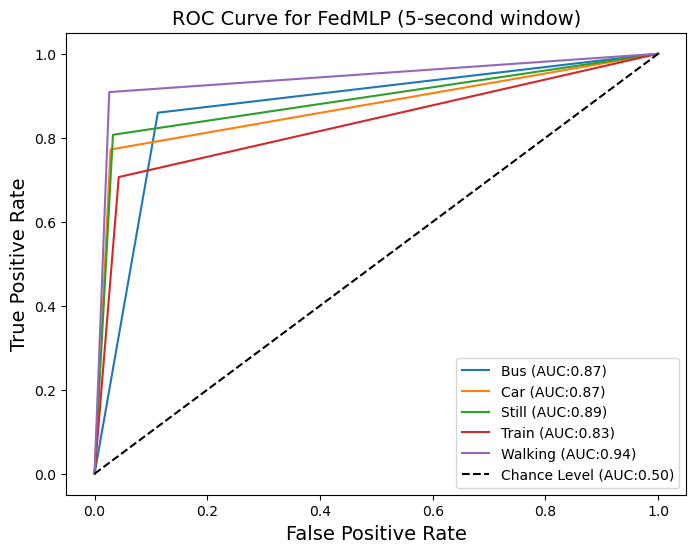

30/30 [==============================] - 0s 5ms/step - loss: 0.6565 - sparse_categorical_accuracy: 0.7633
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 55 | global_acc: 81.340% | global_loss: 1.1909818649291992
              precision    recall  f1-score   support

           0       0.68      0.85      0.76       235
           1       0.88      0.80      0.84       228
           2       0.84      0.82      0.83       228
           3       0.84      0.71      0.77       269
           4       0.86      0.91      0.88       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.81      0.81      1179

0.8854885619327846


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


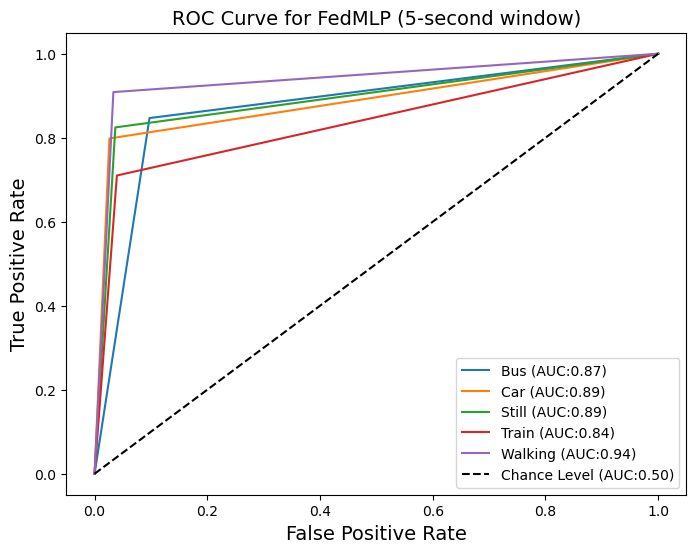

30/30 [==============================] - 0s 4ms/step - loss: 0.6293 - sparse_categorical_accuracy: 0.7749
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 56 | global_acc: 81.170% | global_loss: 1.1881492137908936
              precision    recall  f1-score   support

           0       0.69      0.85      0.76       235
           1       0.88      0.79      0.83       228
           2       0.78      0.86      0.81       228
           3       0.85      0.72      0.78       269
           4       0.91      0.86      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.81      1179
weighted avg       0.82      0.81      0.81      1179

0.8839524207745735


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


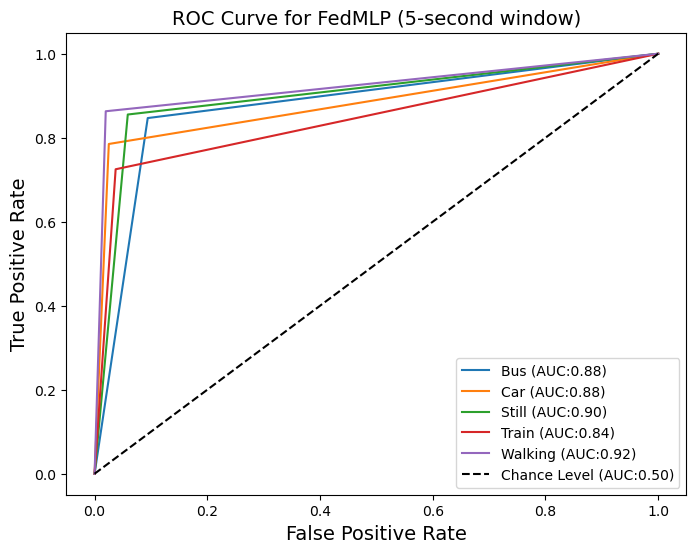

30/30 [==============================] - 1s 4ms/step - loss: 0.6467 - sparse_categorical_accuracy: 0.7548
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 57 | global_acc: 81.764% | global_loss: 1.1902656555175781
              precision    recall  f1-score   support

           0       0.68      0.85      0.75       235
           1       0.88      0.79      0.83       228
           2       0.86      0.82      0.84       228
           3       0.85      0.72      0.78       269
           4       0.87      0.92      0.90       219

    accuracy                           0.82      1179
   macro avg       0.83      0.82      0.82      1179
weighted avg       0.83      0.82      0.82      1179

0.8879803596193293


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


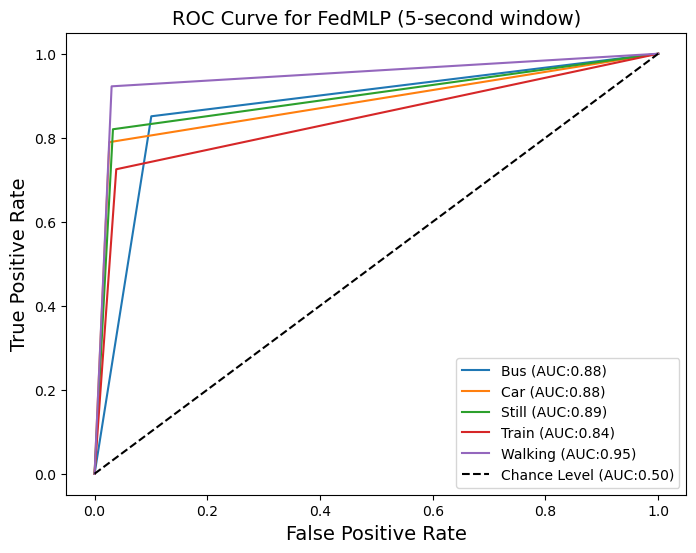

30/30 [==============================] - 0s 4ms/step - loss: 0.6670 - sparse_categorical_accuracy: 0.7665
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 58 | global_acc: 82.188% | global_loss: 1.1821500062942505
              precision    recall  f1-score   support

           0       0.71      0.82      0.76       235
           1       0.88      0.79      0.83       228
           2       0.85      0.82      0.83       228
           3       0.81      0.80      0.81       269
           4       0.88      0.90      0.89       219

    accuracy                           0.82      1179
   macro avg       0.83      0.82      0.82      1179
weighted avg       0.83      0.82      0.82      1179

0.8893165260743935


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


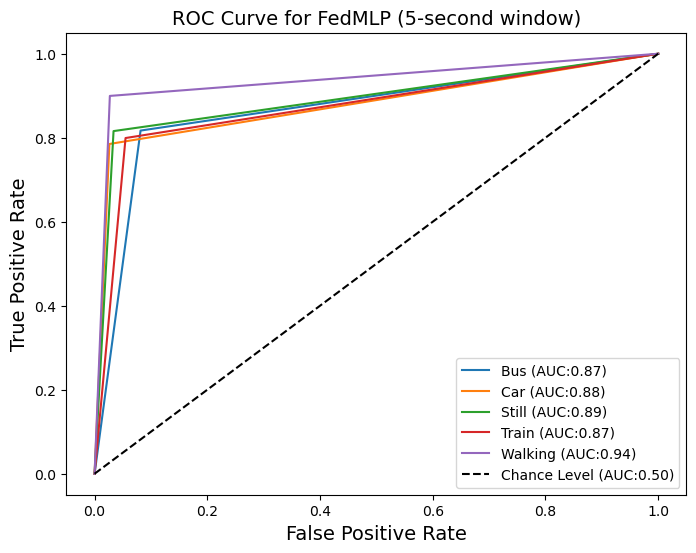

30/30 [==============================] - 0s 4ms/step - loss: 0.6227 - sparse_categorical_accuracy: 0.7728
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 59 | global_acc: 81.425% | global_loss: 1.1838083267211914
              precision    recall  f1-score   support

           0       0.69      0.83      0.75       235
           1       0.86      0.81      0.83       228
           2       0.81      0.83      0.82       228
           3       0.85      0.74      0.79       269
           4       0.90      0.88      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.81      0.82      1179

0.8854519112536451


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


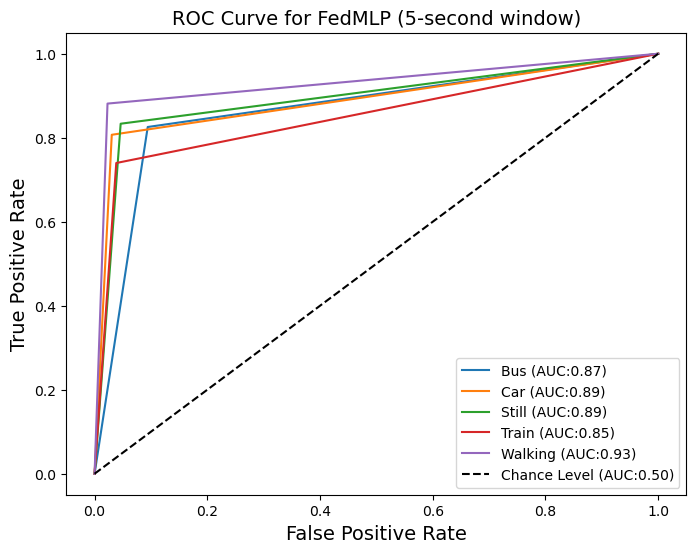

30/30 [==============================] - 0s 5ms/step - loss: 0.6102 - sparse_categorical_accuracy: 0.7813
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 60 | global_acc: 81.170% | global_loss: 1.1856292486190796
              precision    recall  f1-score   support

           0       0.67      0.86      0.75       235
           1       0.88      0.80      0.84       228
           2       0.80      0.84      0.82       228
           3       0.87      0.70      0.77       269
           4       0.90      0.89      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.81      0.81      1179

0.8845526231001077


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


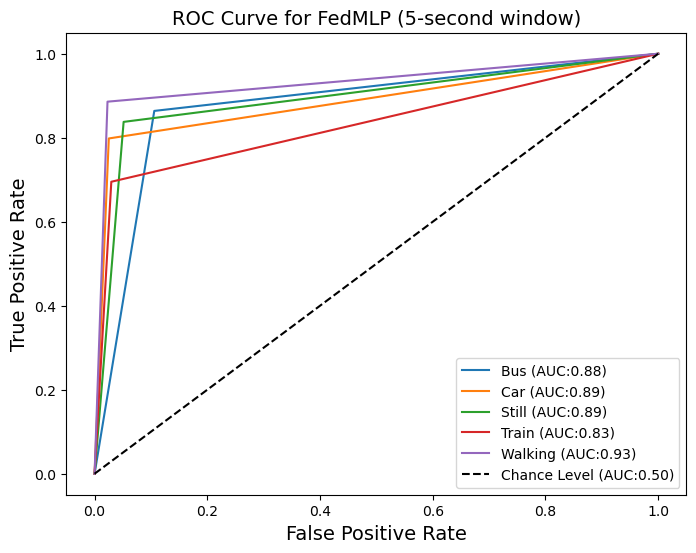

30/30 [==============================] - 0s 4ms/step - loss: 0.6316 - sparse_categorical_accuracy: 0.7665
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 61 | global_acc: 82.697% | global_loss: 1.176423192024231
              precision    recall  f1-score   support

           0       0.72      0.84      0.77       235
           1       0.90      0.79      0.84       228
           2       0.79      0.86      0.82       228
           3       0.87      0.75      0.81       269
           4       0.89      0.91      0.90       219

    accuracy                           0.83      1179
   macro avg       0.83      0.83      0.83      1179
weighted avg       0.83      0.83      0.83      1179

0.8935024611220562


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


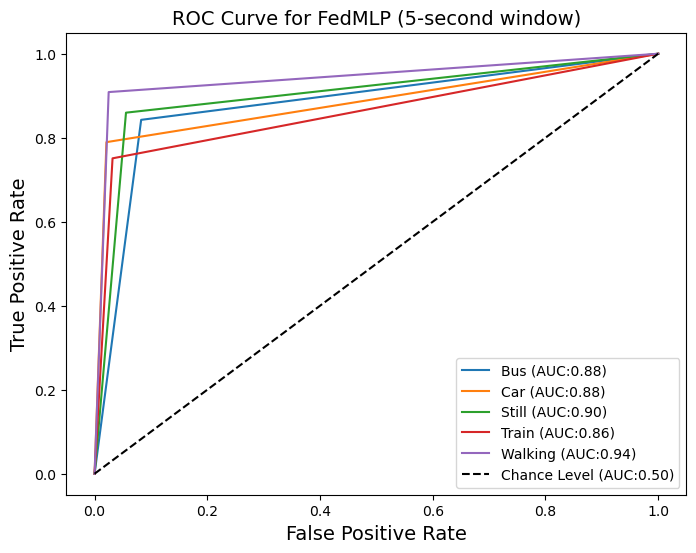

30/30 [==============================] - 0s 4ms/step - loss: 0.6145 - sparse_categorical_accuracy: 0.7813
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 62 | global_acc: 81.764% | global_loss: 1.1757837533950806
              precision    recall  f1-score   support

           0       0.72      0.82      0.77       235
           1       0.88      0.79      0.84       228
           2       0.77      0.86      0.81       228
           3       0.85      0.76      0.80       269
           4       0.91      0.87      0.89       219

    accuracy                           0.82      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.82      0.82      1179

0.8872683658894281


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


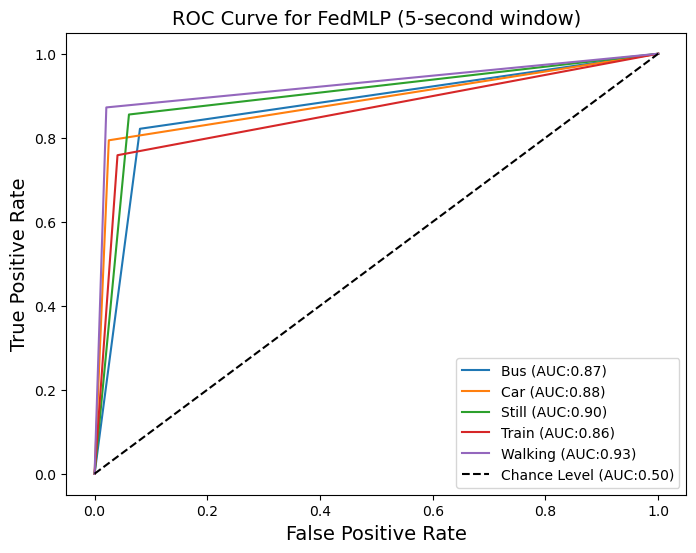

30/30 [==============================] - 0s 4ms/step - loss: 0.6097 - sparse_categorical_accuracy: 0.7803
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 63 | global_acc: 81.425% | global_loss: 1.1752796173095703
              precision    recall  f1-score   support

           0       0.71      0.81      0.76       235
           1       0.85      0.80      0.83       228
           2       0.80      0.84      0.82       228
           3       0.83      0.77      0.80       269
           4       0.90      0.87      0.89       219

    accuracy                           0.81      1179
   macro avg       0.82      0.82      0.82      1179
weighted avg       0.82      0.81      0.82      1179

0.8849555930385357


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


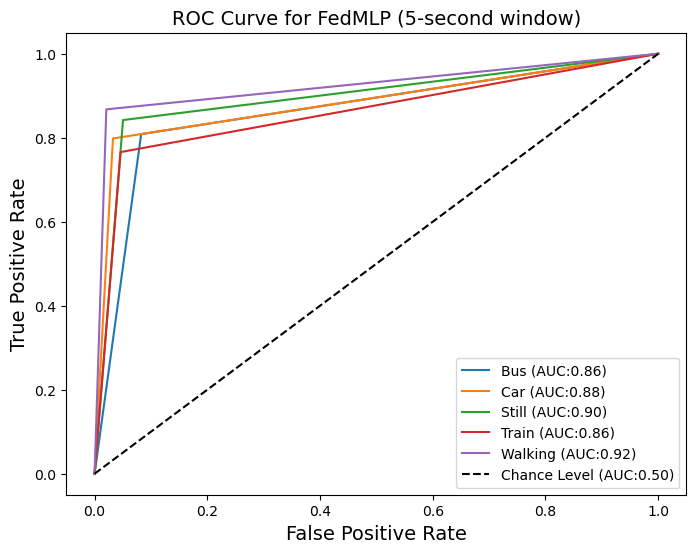

30/30 [==============================] - 0s 4ms/step - loss: 0.6405 - sparse_categorical_accuracy: 0.7665
y_pred = [1 2 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 64 | global_acc: 82.273% | global_loss: 1.171352505683899
              precision    recall  f1-score   support

           0       0.77      0.75      0.76       235
           1       0.86      0.82      0.84       228
           2       0.85      0.80      0.83       228
           3       0.76      0.87      0.81       269
           4       0.91      0.87      0.89       219

    accuracy                           0.82      1179
   macro avg       0.83      0.82      0.82      1179
weighted avg       0.83      0.82      0.82      1179

0.8885730978053761


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


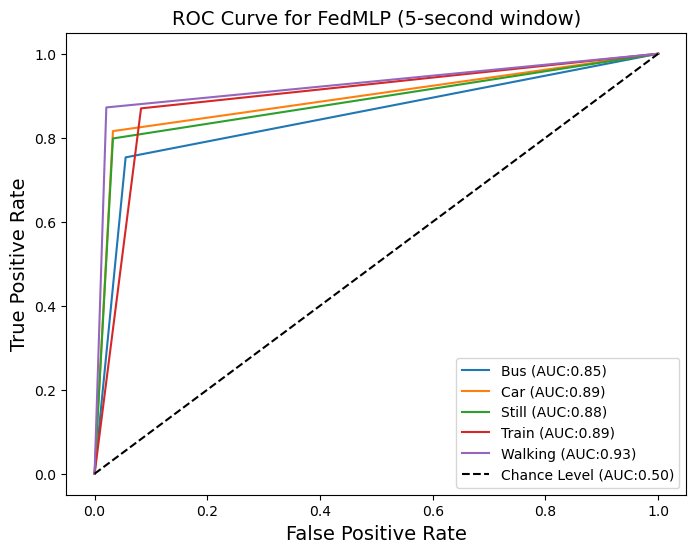

30/30 [==============================] - 0s 4ms/step - loss: 0.6511 - sparse_categorical_accuracy: 0.7654
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 65 | global_acc: 81.934% | global_loss: 1.1745235919952393
              precision    recall  f1-score   support

           0       0.69      0.84      0.76       235
           1       0.87      0.82      0.84       228
           2       0.83      0.83      0.83       228
           3       0.85      0.76      0.80       269
           4       0.90      0.86      0.88       219

    accuracy                           0.82      1179
   macro avg       0.83      0.82      0.82      1179
weighted avg       0.83      0.82      0.82      1179

0.8882427959211003


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


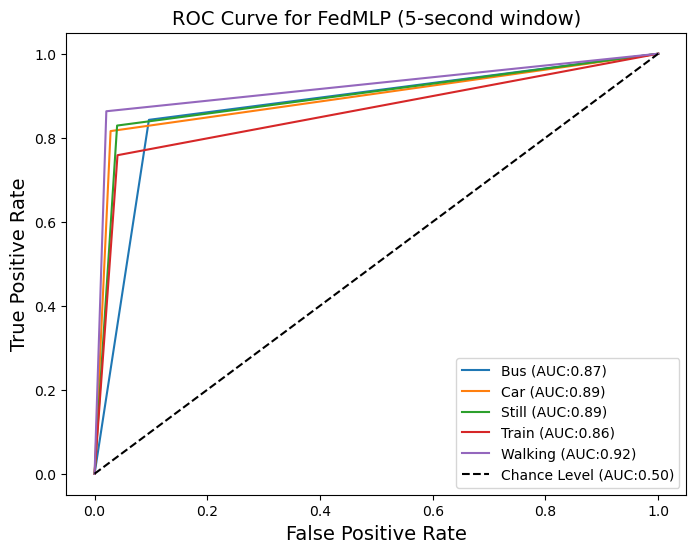

30/30 [==============================] - 0s 4ms/step - loss: 0.5872 - sparse_categorical_accuracy: 0.8004
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 66 | global_acc: 82.019% | global_loss: 1.169744610786438
              precision    recall  f1-score   support

           0       0.70      0.85      0.76       235
           1       0.89      0.78      0.83       228
           2       0.77      0.89      0.82       228
           3       0.92      0.71      0.80       269
           4       0.88      0.91      0.90       219

    accuracy                           0.82      1179
   macro avg       0.83      0.82      0.82      1179
weighted avg       0.83      0.82      0.82      1179

0.889998139521782


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


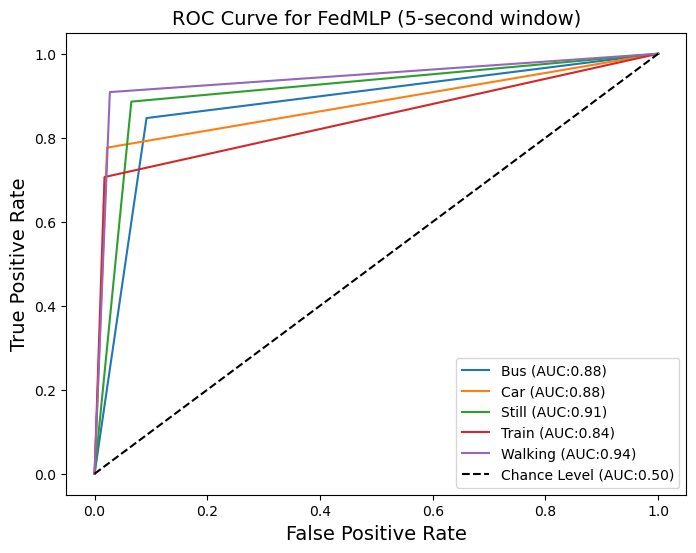

30/30 [==============================] - 0s 4ms/step - loss: 0.5667 - sparse_categorical_accuracy: 0.8015
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 67 | global_acc: 82.697% | global_loss: 1.1668779850006104
              precision    recall  f1-score   support

           0       0.74      0.80      0.77       235
           1       0.89      0.79      0.84       228
           2       0.88      0.78      0.82       228
           3       0.78      0.85      0.81       269
           4       0.89      0.92      0.90       219

    accuracy                           0.83      1179
   macro avg       0.83      0.83      0.83      1179
weighted avg       0.83      0.83      0.83      1179

0.8917228009847108


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


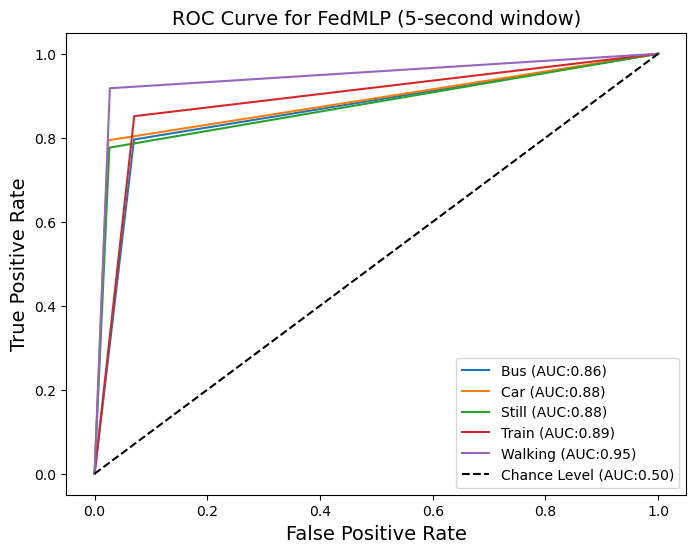

30/30 [==============================] - 0s 4ms/step - loss: 0.6179 - sparse_categorical_accuracy: 0.7749
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 68 | global_acc: 82.358% | global_loss: 1.16798734664917
              precision    recall  f1-score   support

           0       0.70      0.85      0.77       235
           1       0.90      0.78      0.83       228
           2       0.77      0.87      0.82       228
           3       0.90      0.75      0.82       269
           4       0.91      0.88      0.89       219

    accuracy                           0.82      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.82      0.83      1179

0.8912161714356435


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


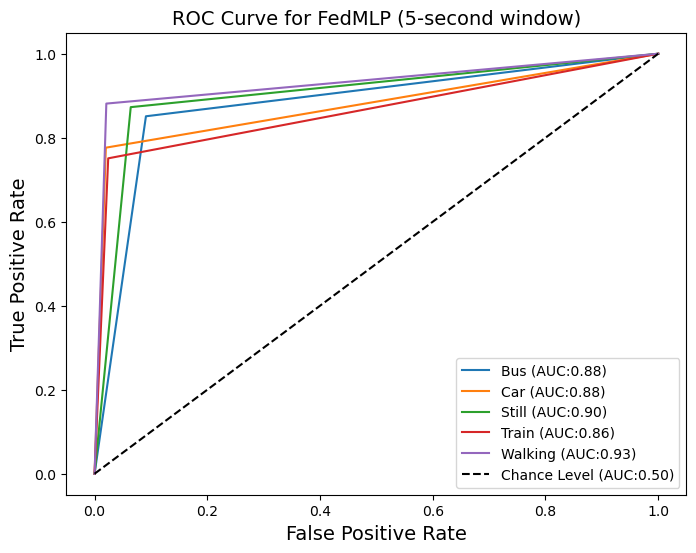

30/30 [==============================] - 0s 4ms/step - loss: 0.6260 - sparse_categorical_accuracy: 0.7877
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 69 | global_acc: 82.952% | global_loss: 1.165652871131897
              precision    recall  f1-score   support

           0       0.72      0.85      0.78       235
           1       0.87      0.82      0.85       228
           2       0.81      0.83      0.82       228
           3       0.86      0.76      0.81       269
           4       0.91      0.89      0.90       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.8948175565631917


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


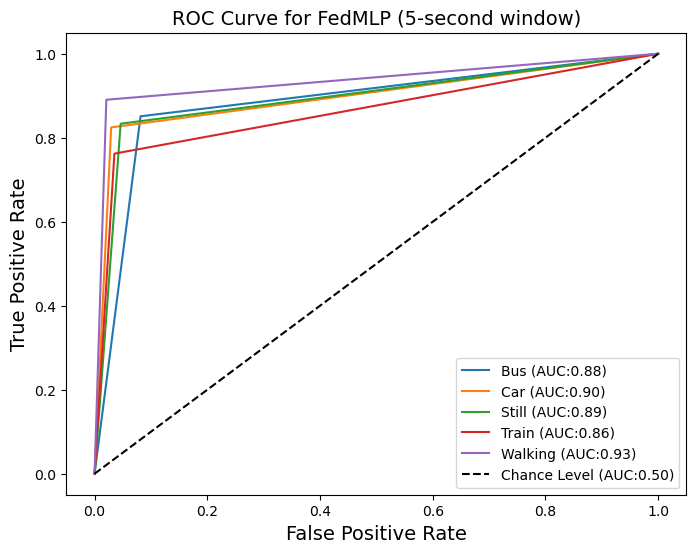

30/30 [==============================] - 0s 4ms/step - loss: 0.6201 - sparse_categorical_accuracy: 0.7739
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 70 | global_acc: 82.443% | global_loss: 1.1663737297058105
              precision    recall  f1-score   support

           0       0.71      0.86      0.77       235
           1       0.92      0.78      0.84       228
           2       0.78      0.85      0.81       228
           3       0.86      0.78      0.82       269
           4       0.92      0.86      0.89       219

    accuracy                           0.82      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.83      0.82      0.83      1179

0.8909921024878129


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


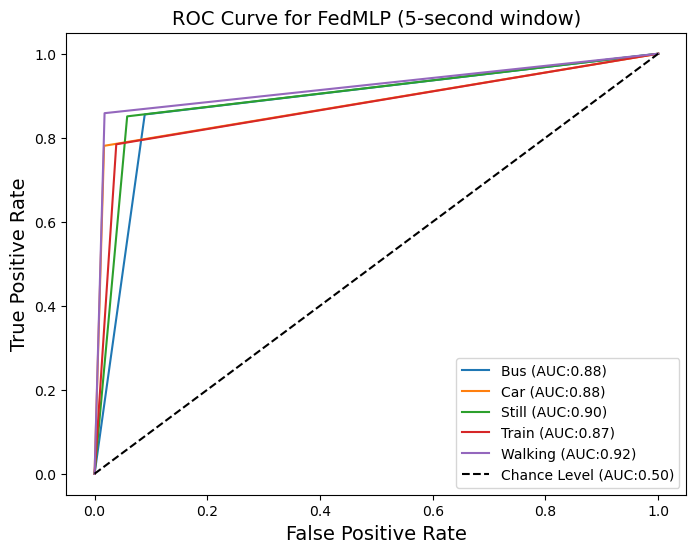

30/30 [==============================] - 0s 4ms/step - loss: 0.6014 - sparse_categorical_accuracy: 0.7686
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 71 | global_acc: 83.461% | global_loss: 1.1610891819000244
              precision    recall  f1-score   support

           0       0.74      0.82      0.78       235
           1       0.90      0.79      0.84       228
           2       0.85      0.83      0.84       228
           3       0.81      0.84      0.83       269
           4       0.89      0.89      0.89       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.84      1179
weighted avg       0.84      0.83      0.84      1179

0.8966301070607994


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


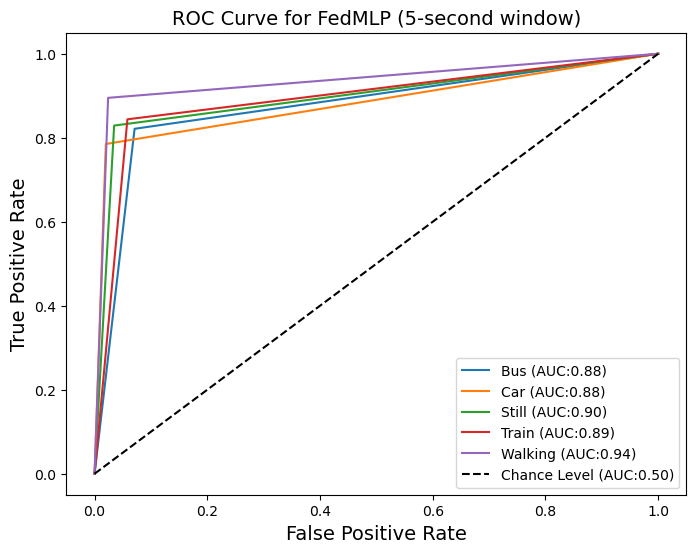

30/30 [==============================] - 0s 4ms/step - loss: 0.5934 - sparse_categorical_accuracy: 0.7951
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 72 | global_acc: 82.443% | global_loss: 1.1615455150604248
              precision    recall  f1-score   support

           0       0.70      0.86      0.77       235
           1       0.92      0.76      0.83       228
           2       0.78      0.87      0.82       228
           3       0.86      0.78      0.82       269
           4       0.92      0.86      0.89       219

    accuracy                           0.82      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.82      0.83      1179

0.8909952806620064


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


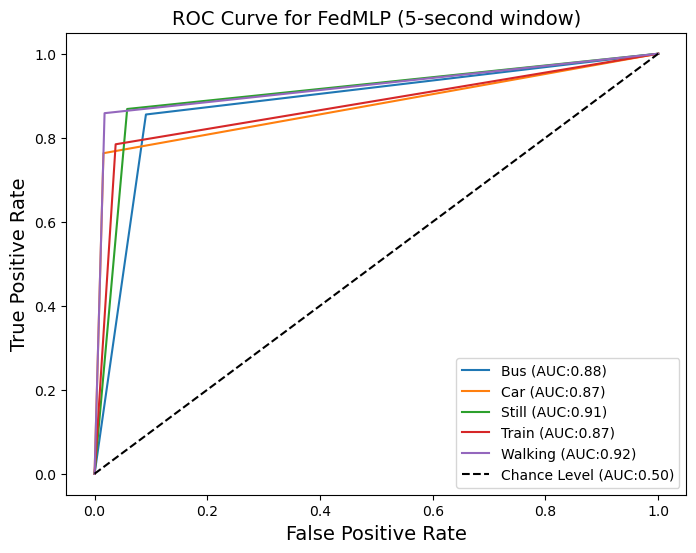

30/30 [==============================] - 0s 4ms/step - loss: 0.6122 - sparse_categorical_accuracy: 0.7877
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 73 | global_acc: 83.715% | global_loss: 1.162595510482788
              precision    recall  f1-score   support

           0       0.73      0.85      0.79       235
           1       0.89      0.82      0.85       228
           2       0.79      0.87      0.82       228
           3       0.92      0.75      0.83       269
           4       0.89      0.92      0.91       219

    accuracy                           0.84      1179
   macro avg       0.84      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.900164188418041


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


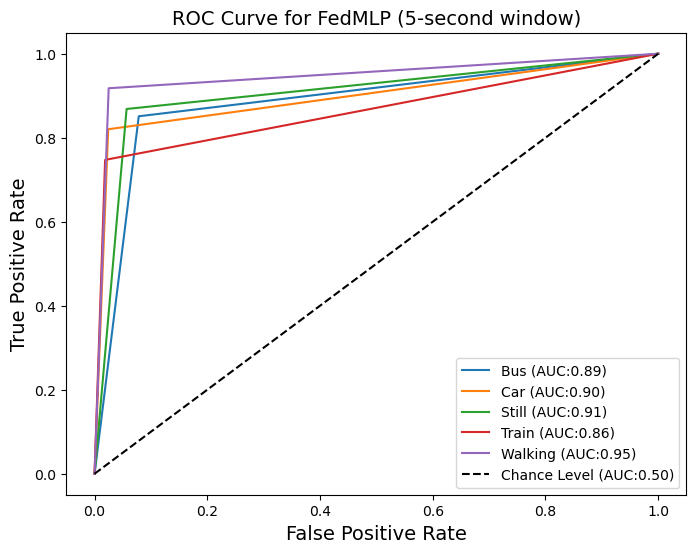

30/30 [==============================] - 0s 4ms/step - loss: 0.5940 - sparse_categorical_accuracy: 0.7739
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 74 | global_acc: 83.291% | global_loss: 1.1575262546539307
              precision    recall  f1-score   support

           0       0.76      0.79      0.78       235
           1       0.85      0.82      0.84       228
           2       0.77      0.88      0.82       228
           3       0.89      0.78      0.83       269
           4       0.91      0.90      0.90       219

    accuracy                           0.83      1179
   macro avg       0.84      0.84      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.896924457764305


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


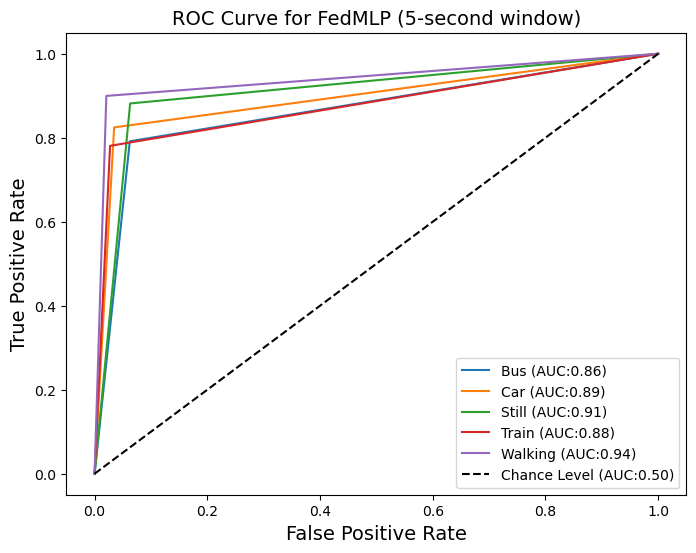

30/30 [==============================] - 0s 4ms/step - loss: 0.6149 - sparse_categorical_accuracy: 0.7781
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 75 | global_acc: 84.054% | global_loss: 1.154343843460083
              precision    recall  f1-score   support

           0       0.75      0.80      0.77       235
           1       0.89      0.81      0.85       228
           2       0.88      0.83      0.85       228
           3       0.82      0.86      0.84       269
           4       0.89      0.90      0.90       219

    accuracy                           0.84      1179
   macro avg       0.84      0.84      0.84      1179
weighted avg       0.84      0.84      0.84      1179

0.9002848904036711


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


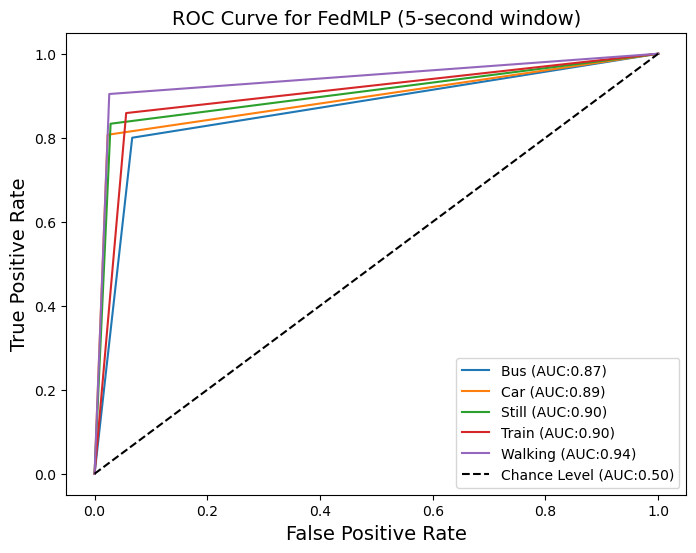

30/30 [==============================] - 0s 4ms/step - loss: 0.6012 - sparse_categorical_accuracy: 0.7909
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 76 | global_acc: 83.800% | global_loss: 1.1522890329360962
              precision    recall  f1-score   support

           0       0.72      0.85      0.78       235
           1       0.92      0.79      0.85       228
           2       0.81      0.86      0.83       228
           3       0.89      0.79      0.83       269
           4       0.90      0.91      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.8998850651593082


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


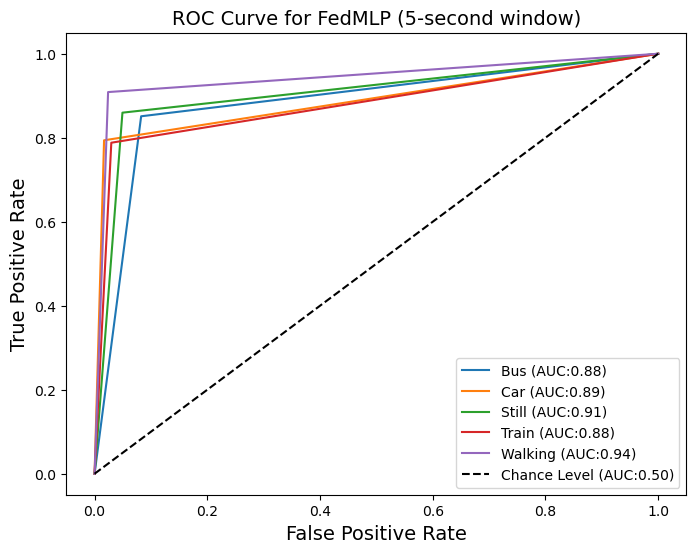

30/30 [==============================] - 0s 4ms/step - loss: 0.5669 - sparse_categorical_accuracy: 0.8132
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 77 | global_acc: 82.782% | global_loss: 1.1574891805648804
              precision    recall  f1-score   support

           0       0.70      0.86      0.77       235
           1       0.92      0.78      0.85       228
           2       0.78      0.86      0.82       228
           3       0.91      0.75      0.82       269
           4       0.89      0.91      0.90       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.8940371201427528


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


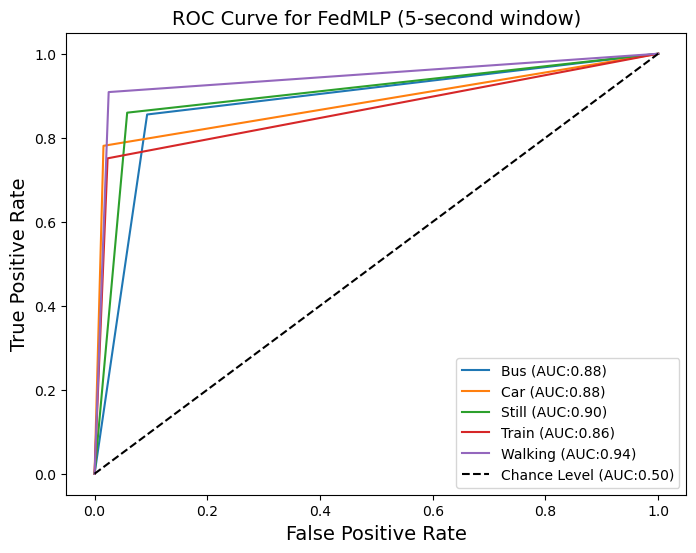

30/30 [==============================] - 1s 5ms/step - loss: 0.5728 - sparse_categorical_accuracy: 0.8047
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 78 | global_acc: 83.036% | global_loss: 1.1536892652511597
              precision    recall  f1-score   support

           0       0.72      0.85      0.78       235
           1       0.90      0.80      0.84       228
           2       0.81      0.84      0.83       228
           3       0.86      0.80      0.83       269
           4       0.91      0.87      0.89       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.8945811943412325


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


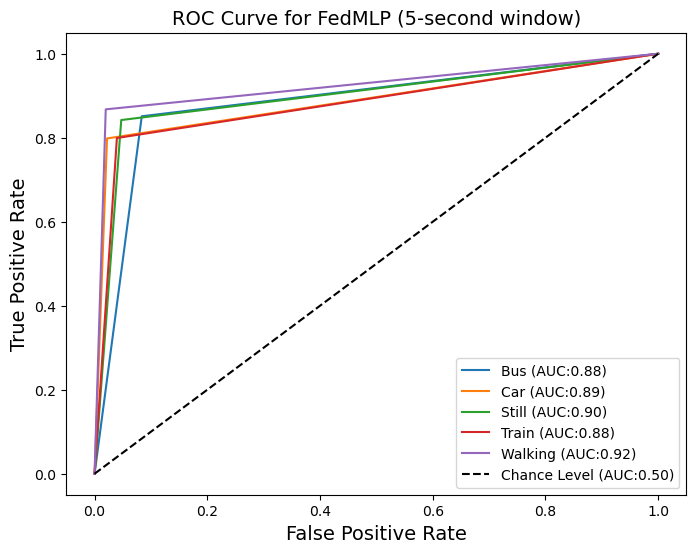

30/30 [==============================] - 0s 5ms/step - loss: 0.5573 - sparse_categorical_accuracy: 0.8142
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 79 | global_acc: 82.443% | global_loss: 1.1536405086517334
              precision    recall  f1-score   support

           0       0.70      0.86      0.77       235
           1       0.89      0.81      0.85       228
           2       0.79      0.86      0.82       228
           3       0.92      0.71      0.80       269
           4       0.89      0.90      0.90       219

    accuracy                           0.82      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.82      0.83      1179

0.8926531629154661


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


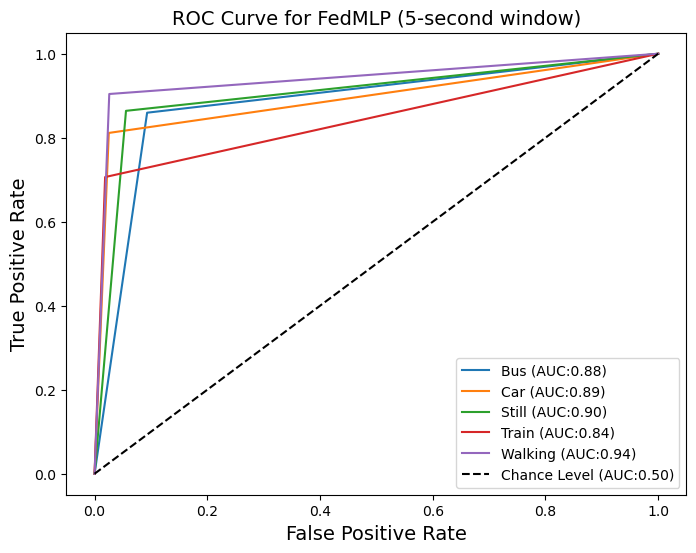

30/30 [==============================] - 0s 4ms/step - loss: 0.5723 - sparse_categorical_accuracy: 0.8004
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 80 | global_acc: 83.630% | global_loss: 1.1565154790878296
              precision    recall  f1-score   support

           0       0.74      0.84      0.79       235
           1       0.89      0.82      0.85       228
           2       0.77      0.89      0.83       228
           3       0.95      0.72      0.82       269
           4       0.88      0.93      0.90       219

    accuracy                           0.84      1179
   macro avg       0.84      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9002709243628052


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


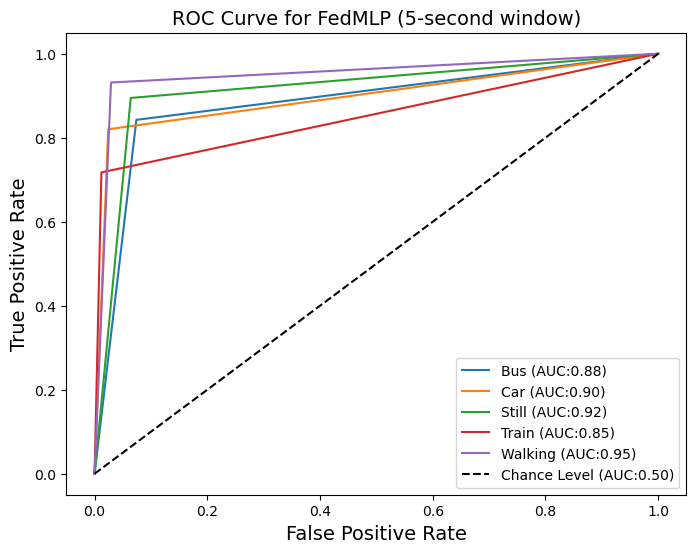

30/30 [==============================] - 0s 5ms/step - loss: 0.5649 - sparse_categorical_accuracy: 0.8079
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 81 | global_acc: 84.478% | global_loss: 1.1506973505020142
              precision    recall  f1-score   support

           0       0.72      0.86      0.78       235
           1       0.91      0.80      0.85       228
           2       0.88      0.83      0.86       228
           3       0.85      0.85      0.85       269
           4       0.91      0.89      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.9029130830332432


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


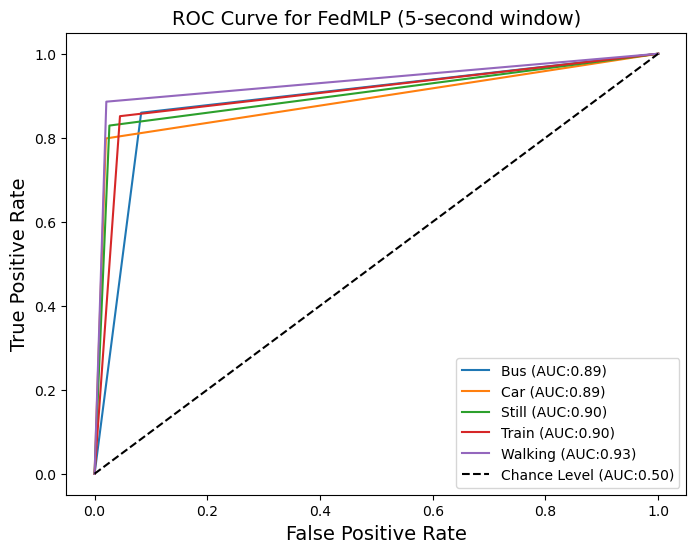

30/30 [==============================] - 0s 4ms/step - loss: 0.5965 - sparse_categorical_accuracy: 0.8153
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 82 | global_acc: 83.291% | global_loss: 1.1482239961624146
              precision    recall  f1-score   support

           0       0.70      0.87      0.78       235
           1       0.92      0.77      0.84       228
           2       0.84      0.84      0.84       228
           3       0.85      0.81      0.83       269
           4       0.91      0.88      0.89       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.84      1179
weighted avg       0.84      0.83      0.83      1179

0.8959989812931942


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


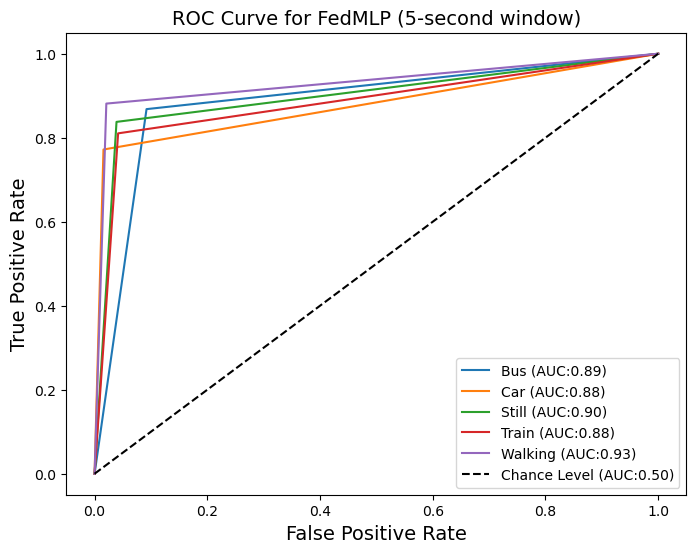

30/30 [==============================] - 0s 4ms/step - loss: 0.5924 - sparse_categorical_accuracy: 0.7739
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 83 | global_acc: 83.121% | global_loss: 1.1508537530899048
              precision    recall  f1-score   support

           0       0.71      0.86      0.78       235
           1       0.88      0.81      0.84       228
           2       0.79      0.86      0.82       228
           3       0.92      0.74      0.82       269
           4       0.91      0.89      0.90       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.8962797802182676


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


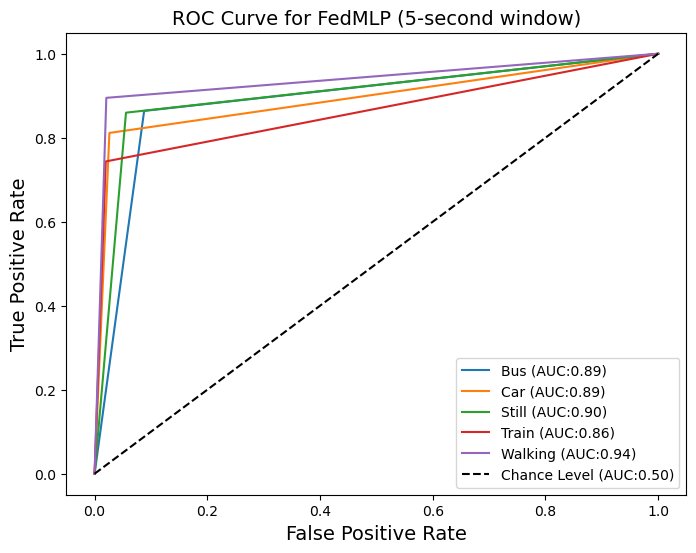

30/30 [==============================] - 0s 4ms/step - loss: 0.5798 - sparse_categorical_accuracy: 0.7803
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 84 | global_acc: 84.309% | global_loss: 1.1470248699188232
              precision    recall  f1-score   support

           0       0.76      0.84      0.80       235
           1       0.89      0.82      0.85       228
           2       0.83      0.83      0.83       228
           3       0.86      0.83      0.84       269
           4       0.88      0.90      0.89       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9024639230665785


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


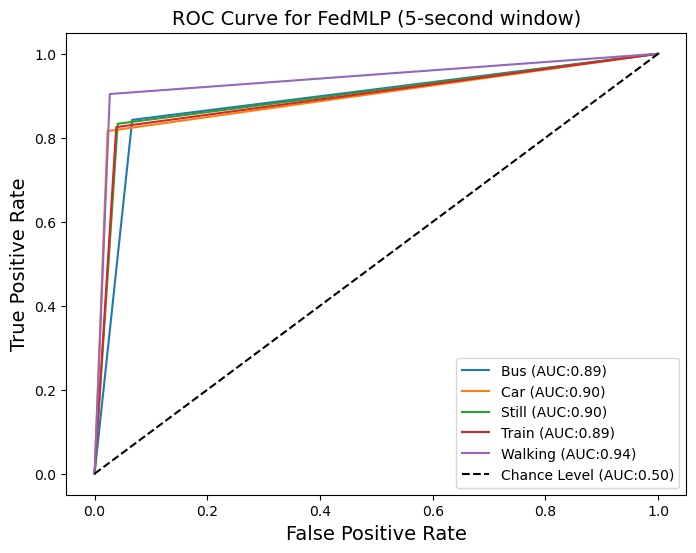

30/30 [==============================] - 1s 4ms/step - loss: 0.5933 - sparse_categorical_accuracy: 0.7856
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 85 | global_acc: 83.545% | global_loss: 1.148959994316101
              precision    recall  f1-score   support

           0       0.70      0.87      0.78       235
           1       0.94      0.76      0.84       228
           2       0.87      0.83      0.85       228
           3       0.82      0.86      0.84       269
           4       0.93      0.85      0.89       219

    accuracy                           0.84      1179
   macro avg       0.85      0.83      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.8966434850193984


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


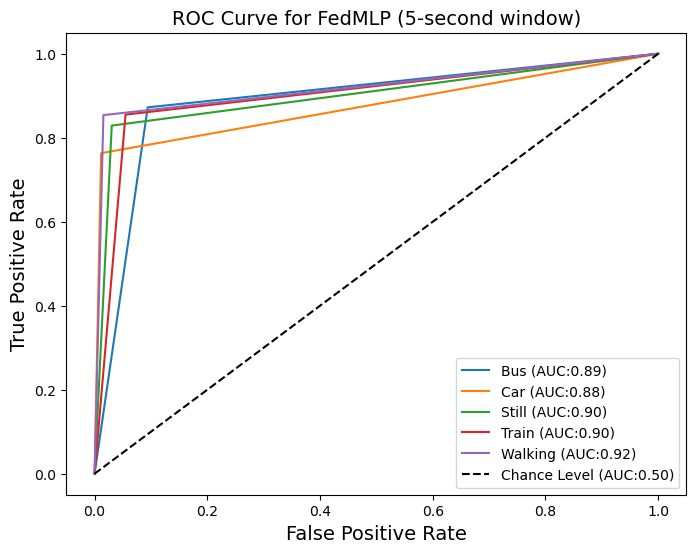

30/30 [==============================] - 0s 4ms/step - loss: 0.5706 - sparse_categorical_accuracy: 0.8068
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 86 | global_acc: 82.528% | global_loss: 1.1537257432937622
              precision    recall  f1-score   support

           0       0.72      0.83      0.77       235
           1       0.91      0.80      0.85       228
           2       0.72      0.91      0.80       228
           3       0.93      0.73      0.82       269
           4       0.92      0.87      0.89       219

    accuracy                           0.83      1179
   macro avg       0.84      0.83      0.83      1179
weighted avg       0.84      0.83      0.83      1179

0.8927407471109403


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


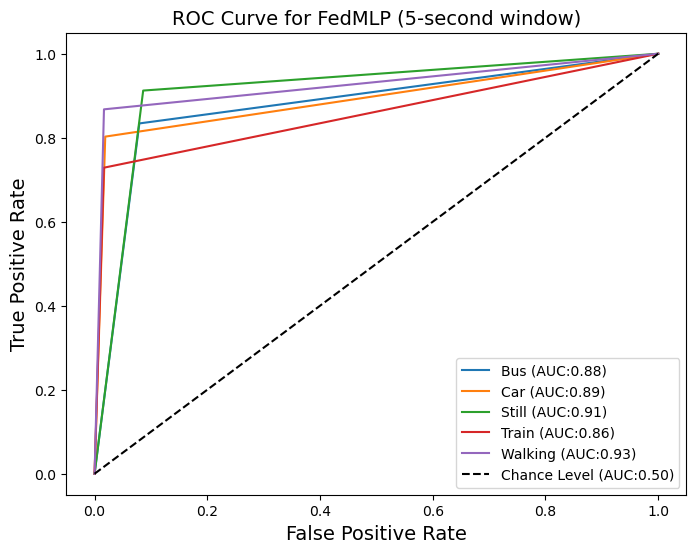

30/30 [==============================] - 0s 4ms/step - loss: 0.5517 - sparse_categorical_accuracy: 0.7962
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 87 | global_acc: 83.630% | global_loss: 1.1435343027114868
              precision    recall  f1-score   support

           0       0.71      0.87      0.78       235
           1       0.92      0.79      0.85       228
           2       0.80      0.85      0.82       228
           3       0.90      0.78      0.83       269
           4       0.90      0.91      0.91       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.8989450927435649


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


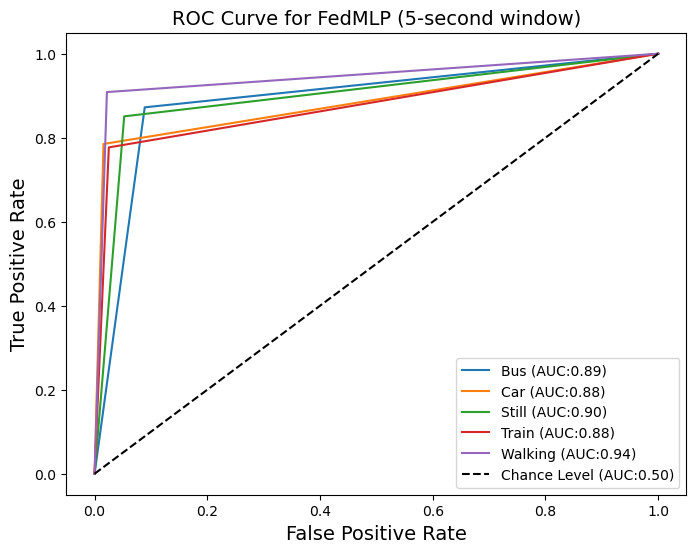

30/30 [==============================] - 0s 4ms/step - loss: 0.5612 - sparse_categorical_accuracy: 0.7983
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 88 | global_acc: 83.885% | global_loss: 1.1418050527572632
              precision    recall  f1-score   support

           0       0.71      0.87      0.78       235
           1       0.94      0.79      0.85       228
           2       0.79      0.86      0.83       228
           3       0.90      0.79      0.84       269
           4       0.91      0.89      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9002499252622386


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


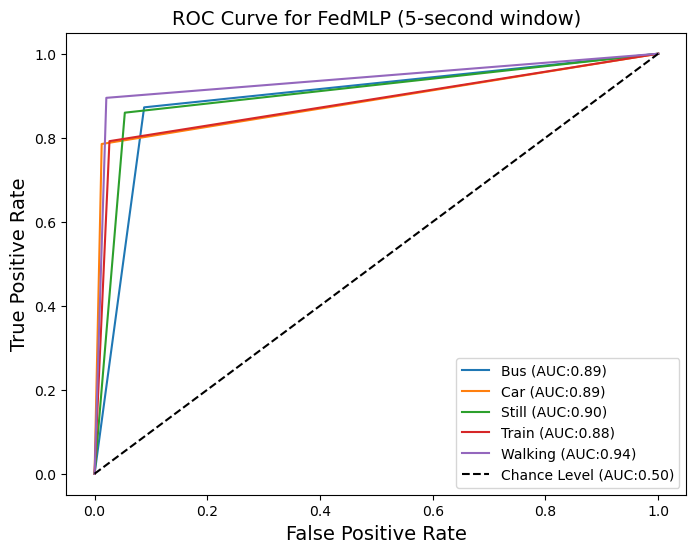

30/30 [==============================] - 0s 4ms/step - loss: 0.5608 - sparse_categorical_accuracy: 0.7941
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 89 | global_acc: 84.309% | global_loss: 1.14183509349823
              precision    recall  f1-score   support

           0       0.78      0.81      0.80       235
           1       0.91      0.80      0.85       228
           2       0.77      0.89      0.83       228
           3       0.88      0.82      0.85       269
           4       0.91      0.90      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9026911024657365


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


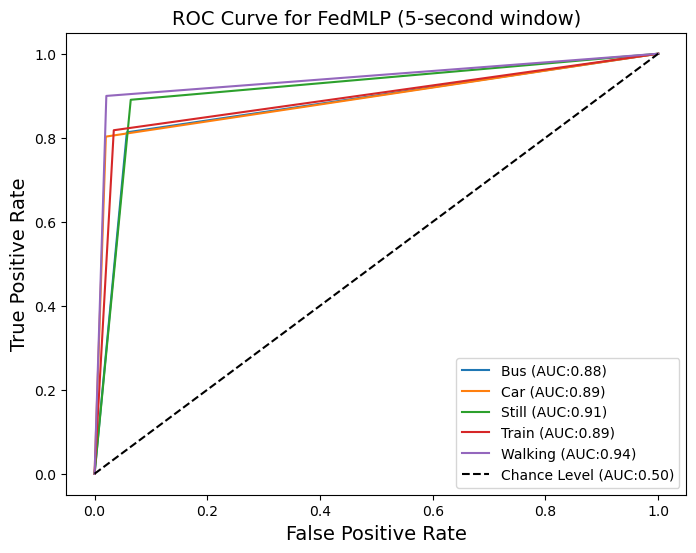

30/30 [==============================] - 0s 4ms/step - loss: 0.5485 - sparse_categorical_accuracy: 0.7994
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 90 | global_acc: 83.545% | global_loss: 1.138834834098816
              precision    recall  f1-score   support

           0       0.74      0.83      0.78       235
           1       0.91      0.79      0.85       228
           2       0.82      0.85      0.83       228
           3       0.84      0.85      0.84       269
           4       0.91      0.86      0.88       219

    accuracy                           0.84      1179
   macro avg       0.84      0.84      0.84      1179
weighted avg       0.84      0.84      0.84      1179

0.8969673143758584


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


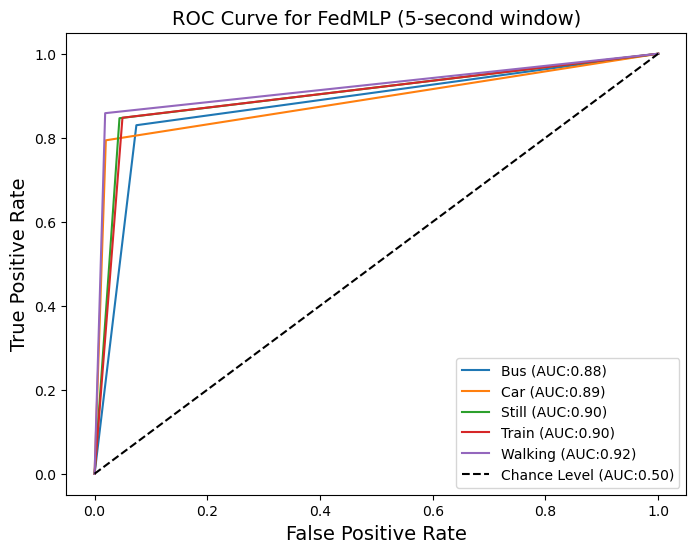

30/30 [==============================] - 0s 4ms/step - loss: 0.5533 - sparse_categorical_accuracy: 0.8079
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 91 | global_acc: 84.478% | global_loss: 1.138213872909546
              precision    recall  f1-score   support

           0       0.73      0.86      0.79       235
           1       0.90      0.81      0.85       228
           2       0.87      0.82      0.85       228
           3       0.85      0.86      0.85       269
           4       0.91      0.88      0.89       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.9028246026960731


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


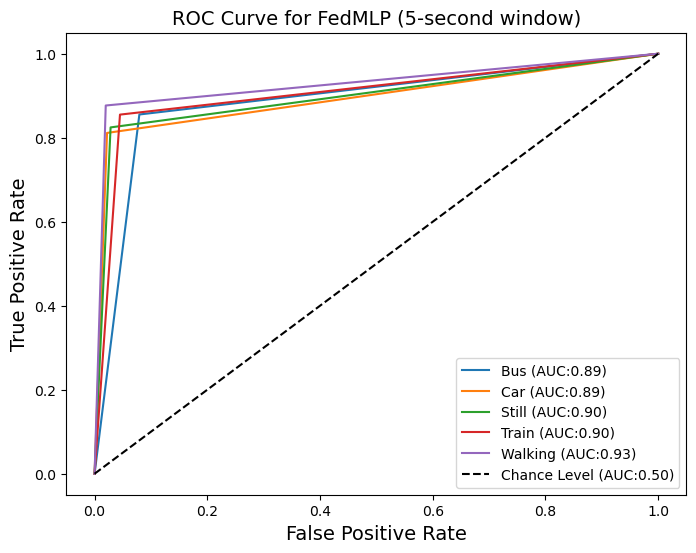

30/30 [==============================] - 0s 4ms/step - loss: 0.5288 - sparse_categorical_accuracy: 0.8195
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 92 | global_acc: 83.969% | global_loss: 1.1400669813156128
              precision    recall  f1-score   support

           0       0.75      0.85      0.80       235
           1       0.91      0.80      0.85       228
           2       0.81      0.85      0.83       228
           3       0.84      0.84      0.84       269
           4       0.91      0.87      0.89       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.84      0.84      0.84      1179

0.8998877295923972


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


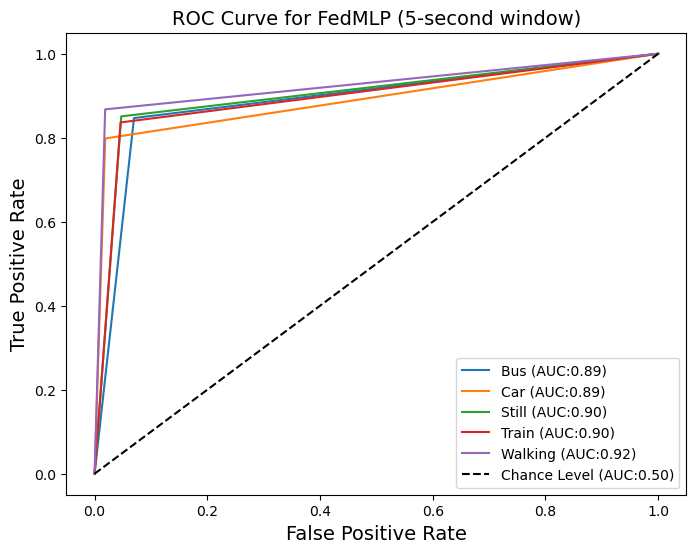

30/30 [==============================] - 0s 4ms/step - loss: 0.5400 - sparse_categorical_accuracy: 0.8089
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 93 | global_acc: 83.885% | global_loss: 1.1403214931488037
              precision    recall  f1-score   support

           0       0.72      0.87      0.79       235
           1       0.90      0.80      0.85       228
           2       0.78      0.89      0.83       228
           3       0.93      0.76      0.84       269
           4       0.92      0.88      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9007481388009475


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


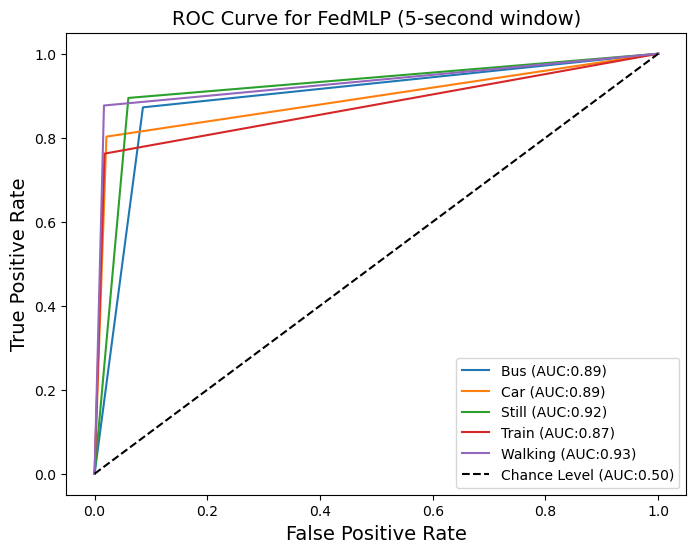

30/30 [==============================] - 0s 4ms/step - loss: 0.5554 - sparse_categorical_accuracy: 0.8015
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 94 | global_acc: 84.309% | global_loss: 1.1401387453079224
              precision    recall  f1-score   support

           0       0.73      0.87      0.79       235
           1       0.91      0.80      0.85       228
           2       0.80      0.87      0.83       228
           3       0.91      0.80      0.85       269
           4       0.92      0.88      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.85      1179
weighted avg       0.85      0.84      0.84      1179

0.9027072204406507


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


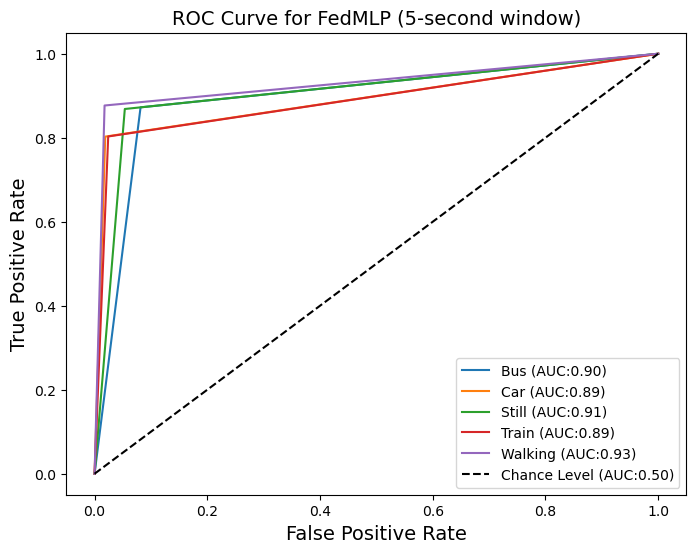

30/30 [==============================] - 0s 4ms/step - loss: 0.5194 - sparse_categorical_accuracy: 0.8206
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 95 | global_acc: 84.224% | global_loss: 1.1366777420043945
              precision    recall  f1-score   support

           0       0.73      0.86      0.79       235
           1       0.90      0.81      0.85       228
           2       0.83      0.84      0.83       228
           3       0.88      0.81      0.84       269
           4       0.91      0.90      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.902129662889276


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


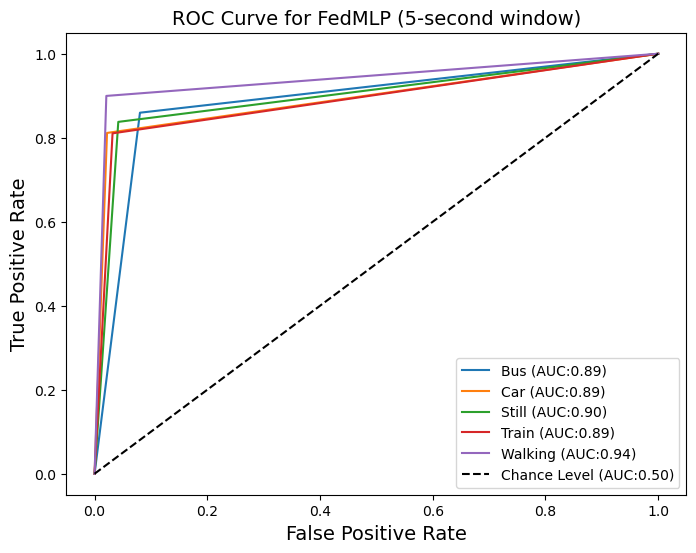

30/30 [==============================] - 0s 4ms/step - loss: 0.5327 - sparse_categorical_accuracy: 0.8174
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 96 | global_acc: 84.733% | global_loss: 1.1363505125045776
              precision    recall  f1-score   support

           0       0.74      0.86      0.80       235
           1       0.90      0.82      0.86       228
           2       0.85      0.83      0.84       228
           3       0.87      0.83      0.85       269
           4       0.92      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.85      0.85      1179

0.9050042803031685


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


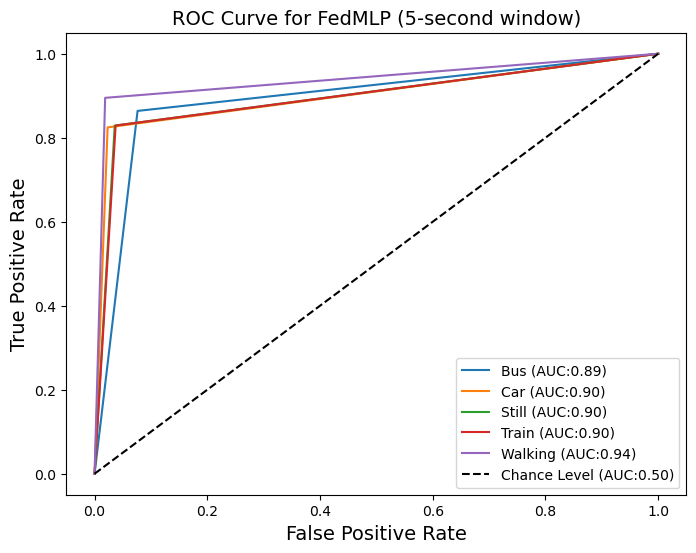

30/30 [==============================] - 0s 4ms/step - loss: 0.5595 - sparse_categorical_accuracy: 0.7909
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 97 | global_acc: 83.545% | global_loss: 1.1356288194656372
              precision    recall  f1-score   support

           0       0.69      0.88      0.77       235
           1       0.93      0.78      0.84       228
           2       0.87      0.81      0.84       228
           3       0.86      0.83      0.84       269
           4       0.91      0.89      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.8973401616274869


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


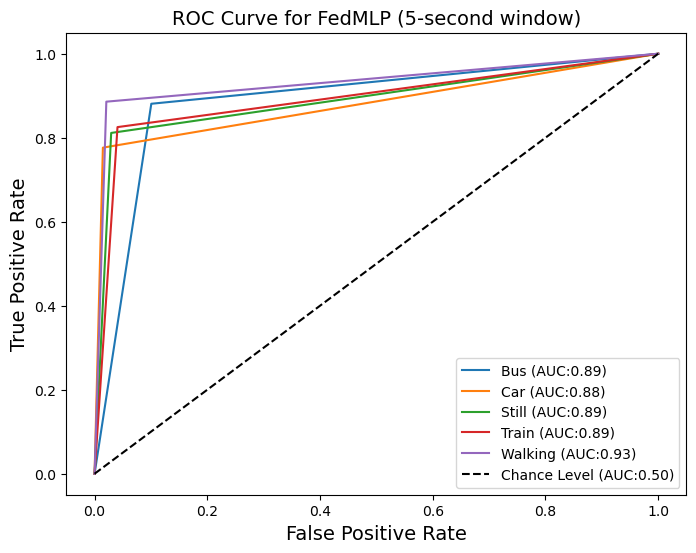

30/30 [==============================] - 0s 4ms/step - loss: 0.5510 - sparse_categorical_accuracy: 0.7951
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 98 | global_acc: 83.885% | global_loss: 1.1353470087051392
              precision    recall  f1-score   support

           0       0.70      0.88      0.78       235
           1       0.92      0.80      0.86       228
           2       0.86      0.83      0.84       228
           3       0.86      0.80      0.83       269
           4       0.91      0.89      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.8999349383908765


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


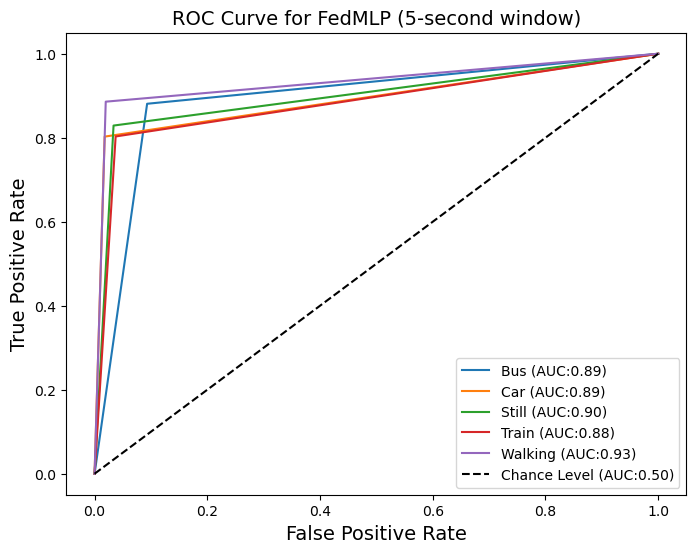

30/30 [==============================] - 0s 4ms/step - loss: 0.5420 - sparse_categorical_accuracy: 0.8100
y_pred = [1 0 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 99 | global_acc: 83.206% | global_loss: 1.133515477180481
              precision    recall  f1-score   support

           0       0.69      0.89      0.78       235
           1       0.94      0.75      0.84       228
           2       0.84      0.82      0.83       228
           3       0.84      0.83      0.84       269
           4       0.93      0.87      0.90       219

    accuracy                           0.83      1179
   macro avg       0.85      0.83      0.83      1179
weighted avg       0.85      0.83      0.83      1179

0.8949325337129184


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


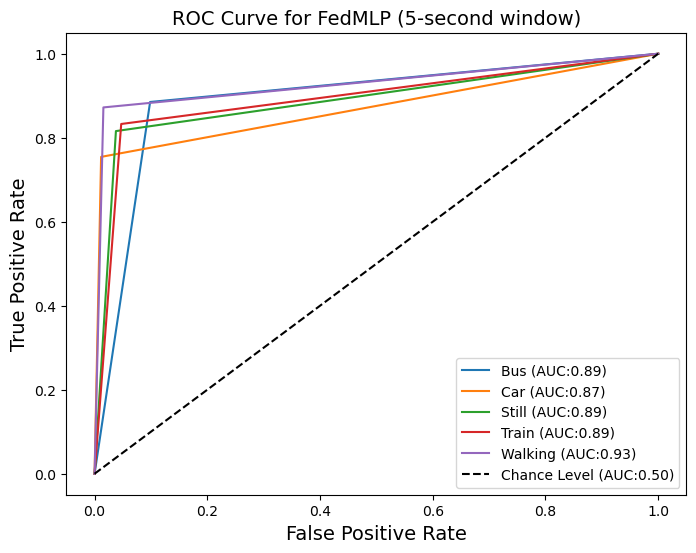

30/30 [==============================] - 0s 5ms/step - loss: 0.5487 - sparse_categorical_accuracy: 0.7877
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 100 | global_acc: 83.715% | global_loss: 1.1342753171920776
              precision    recall  f1-score   support

           0       0.70      0.89      0.78       235
           1       0.92      0.80      0.85       228
           2       0.83      0.81      0.82       228
           3       0.88      0.80      0.84       269
           4       0.91      0.90      0.91       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.899063080963665


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


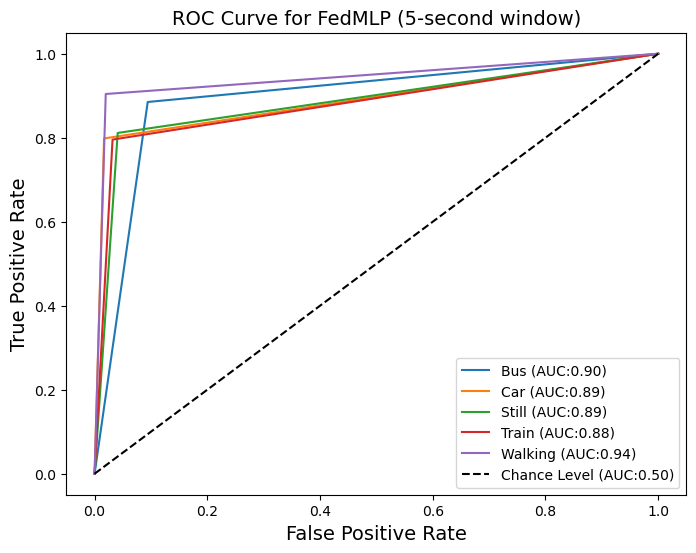

30/30 [==============================] - 0s 4ms/step - loss: 0.5412 - sparse_categorical_accuracy: 0.8079
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 101 | global_acc: 84.818% | global_loss: 1.1291630268096924
              precision    recall  f1-score   support

           0       0.75      0.86      0.80       235
           1       0.90      0.81      0.85       228
           2       0.82      0.85      0.83       228
           3       0.88      0.82      0.85       269
           4       0.90      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.85      0.85      1179

0.9058104992989836


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


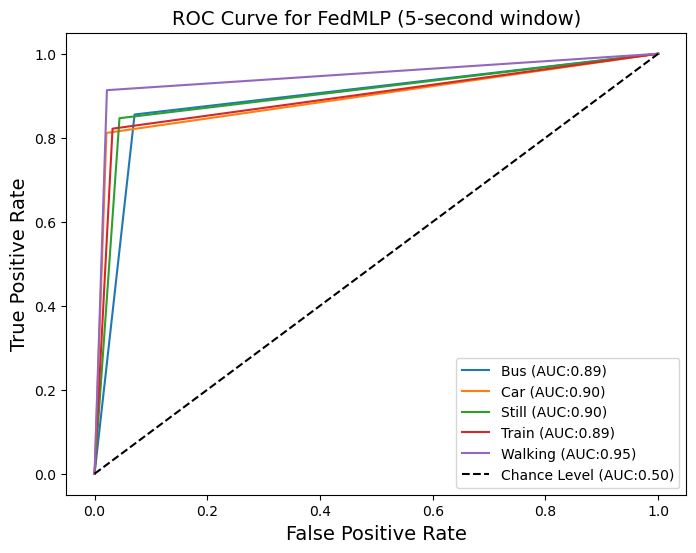

30/30 [==============================] - 0s 4ms/step - loss: 0.5445 - sparse_categorical_accuracy: 0.8089
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 102 | global_acc: 85.072% | global_loss: 1.1300359964370728
              precision    recall  f1-score   support

           0       0.76      0.86      0.81       235
           1       0.90      0.81      0.85       228
           2       0.85      0.85      0.85       228
           3       0.84      0.86      0.85       269
           4       0.92      0.89      0.90       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.85      0.85      0.85      1179

0.9066836086058065


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


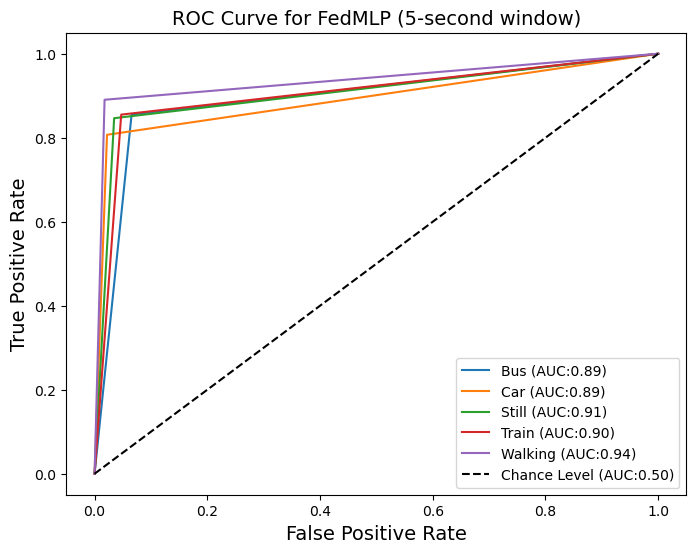

30/30 [==============================] - 1s 5ms/step - loss: 0.5005 - sparse_categorical_accuracy: 0.8312
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 103 | global_acc: 84.987% | global_loss: 1.1319899559020996
              precision    recall  f1-score   support

           0       0.74      0.88      0.80       235
           1       0.90      0.83      0.86       228
           2       0.86      0.83      0.84       228
           3       0.88      0.81      0.84       269
           4       0.91      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9070163171673359


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


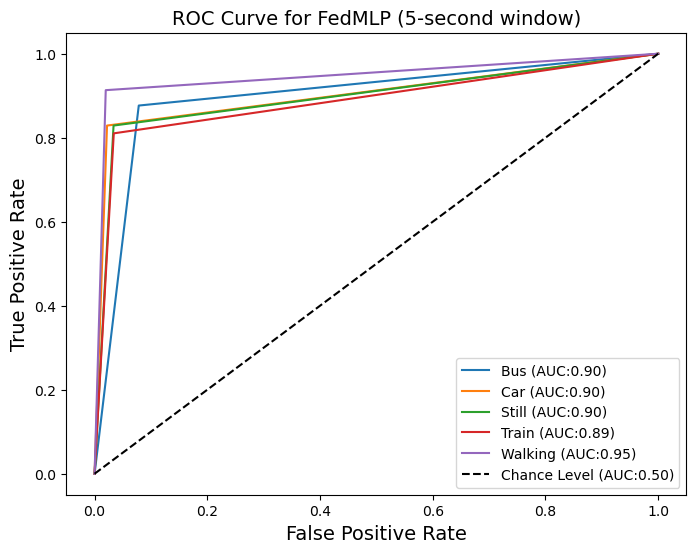

30/30 [==============================] - 0s 4ms/step - loss: 0.5431 - sparse_categorical_accuracy: 0.8132
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 104 | global_acc: 85.242% | global_loss: 1.13065767288208
              precision    recall  f1-score   support

           0       0.74      0.86      0.80       235
           1       0.90      0.82      0.86       228
           2       0.85      0.84      0.85       228
           3       0.87      0.85      0.86       269
           4       0.92      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.907937059247072


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


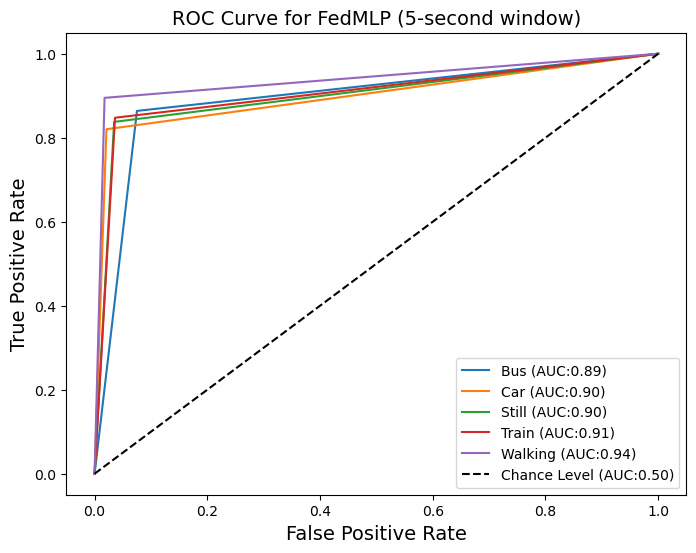

30/30 [==============================] - 0s 4ms/step - loss: 0.5438 - sparse_categorical_accuracy: 0.8259
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 105 | global_acc: 84.902% | global_loss: 1.1278733015060425
              precision    recall  f1-score   support

           0       0.75      0.86      0.80       235
           1       0.93      0.81      0.86       228
           2       0.81      0.85      0.83       228
           3       0.89      0.81      0.85       269
           4       0.89      0.93      0.91       219

    accuracy                           0.85      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.85      0.85      1179

0.9066074580215278


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


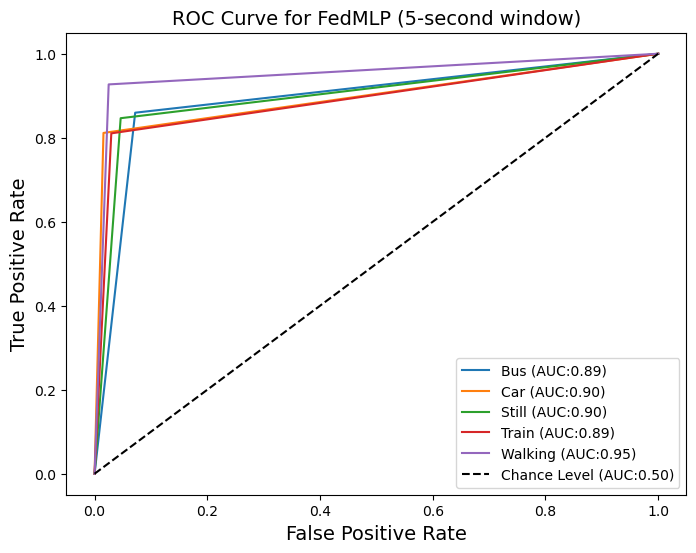

30/30 [==============================] - 0s 5ms/step - loss: 0.5569 - sparse_categorical_accuracy: 0.8089
y_pred = [1 0 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 106 | global_acc: 83.969% | global_loss: 1.1342065334320068
              precision    recall  f1-score   support

           0       0.68      0.89      0.77       235
           1       0.92      0.82      0.87       228
           2       0.80      0.88      0.84       228
           3       0.95      0.75      0.84       269
           4       0.93      0.87      0.90       219

    accuracy                           0.84      1179
   macro avg       0.86      0.84      0.84      1179
weighted avg       0.86      0.84      0.84      1179

0.9013383989927855


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


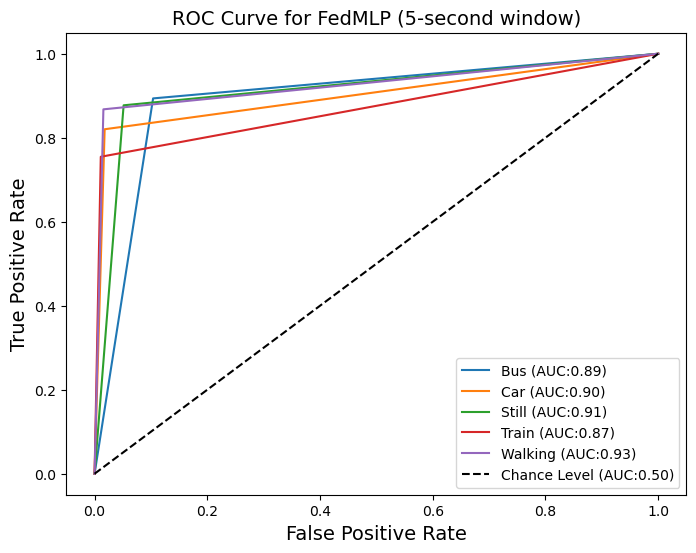

30/30 [==============================] - 0s 4ms/step - loss: 0.5258 - sparse_categorical_accuracy: 0.8238
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 107 | global_acc: 85.157% | global_loss: 1.1273895502090454
              precision    recall  f1-score   support

           0       0.74      0.87      0.80       235
           1       0.91      0.82      0.86       228
           2       0.82      0.85      0.84       228
           3       0.90      0.82      0.86       269
           4       0.92      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9079981139958297


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


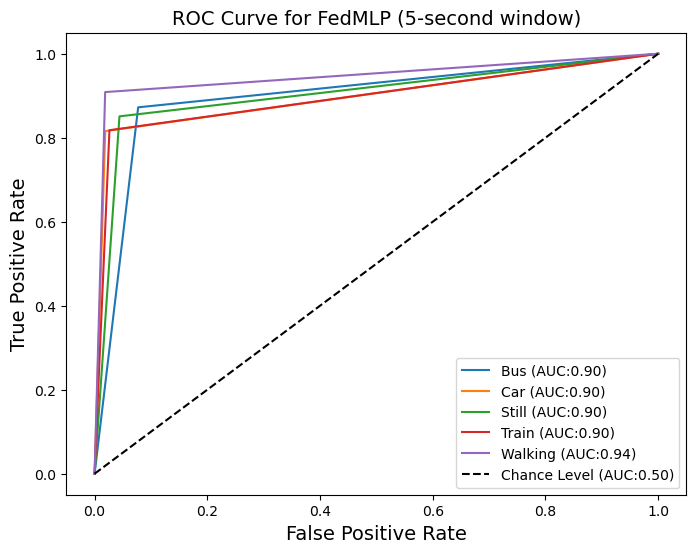

30/30 [==============================] - 0s 4ms/step - loss: 0.5259 - sparse_categorical_accuracy: 0.8248
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 108 | global_acc: 84.902% | global_loss: 1.128408670425415
              precision    recall  f1-score   support

           0       0.75      0.86      0.80       235
           1       0.93      0.79      0.86       228
           2       0.78      0.89      0.83       228
           3       0.90      0.80      0.85       269
           4       0.92      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.906659348329511


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


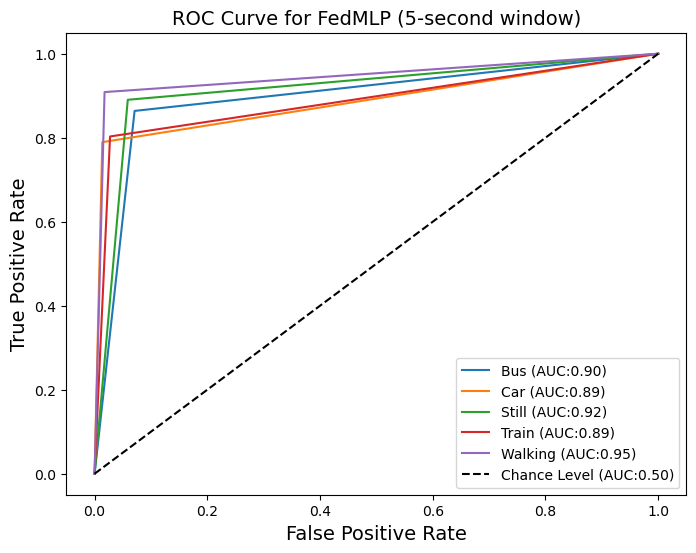

30/30 [==============================] - 0s 5ms/step - loss: 0.5079 - sparse_categorical_accuracy: 0.8291
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 109 | global_acc: 84.394% | global_loss: 1.1263043880462646
              precision    recall  f1-score   support

           0       0.73      0.86      0.79       235
           1       0.90      0.81      0.85       228
           2       0.81      0.86      0.83       228
           3       0.89      0.82      0.85       269
           4       0.93      0.87      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.9028779651552321


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


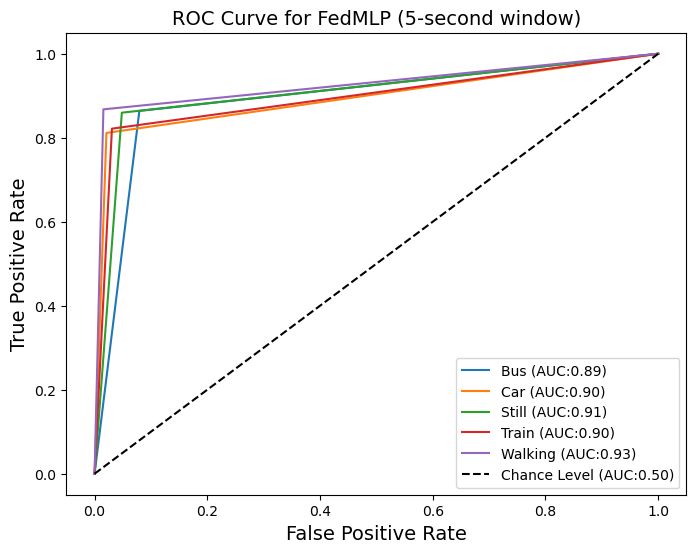

30/30 [==============================] - 0s 5ms/step - loss: 0.5356 - sparse_categorical_accuracy: 0.7994
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 110 | global_acc: 84.394% | global_loss: 1.127504587173462
              precision    recall  f1-score   support

           0       0.73      0.86      0.79       235
           1       0.89      0.82      0.85       228
           2       0.80      0.89      0.84       228
           3       0.91      0.80      0.85       269
           4       0.93      0.86      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.9033110162002613


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


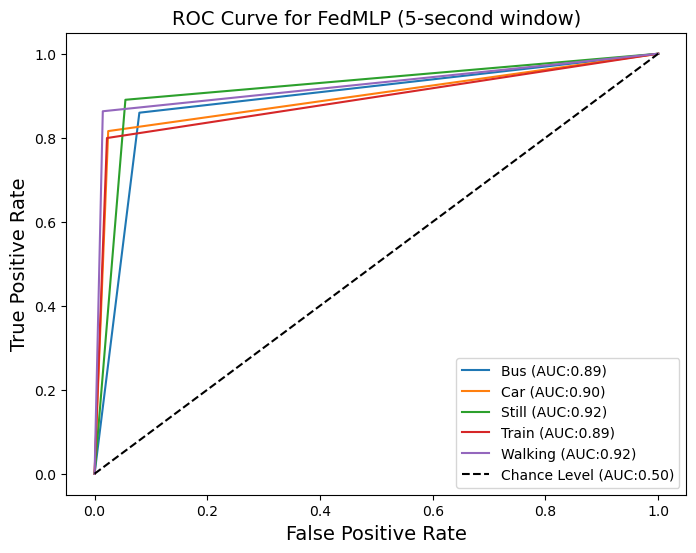

30/30 [==============================] - 0s 5ms/step - loss: 0.4904 - sparse_categorical_accuracy: 0.8312
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 111 | global_acc: 85.581% | global_loss: 1.1277209520339966
              precision    recall  f1-score   support

           0       0.77      0.86      0.81       235
           1       0.90      0.82      0.86       228
           2       0.80      0.89      0.84       228
           3       0.92      0.81      0.86       269
           4       0.91      0.92      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9110397447635288


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


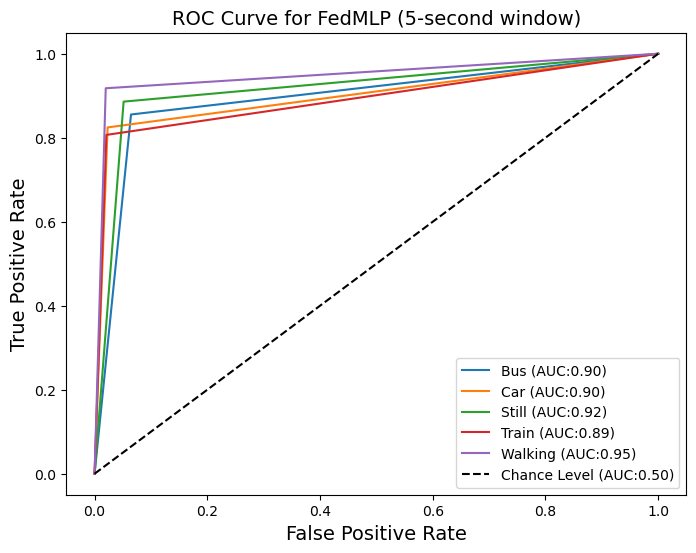

30/30 [==============================] - 0s 4ms/step - loss: 0.4890 - sparse_categorical_accuracy: 0.8301
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 112 | global_acc: 84.394% | global_loss: 1.1250030994415283
              precision    recall  f1-score   support

           0       0.75      0.85      0.79       235
           1       0.89      0.81      0.85       228
           2       0.78      0.89      0.83       228
           3       0.91      0.81      0.85       269
           4       0.92      0.88      0.90       219

    accuracy                           0.84      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.903286563881319


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


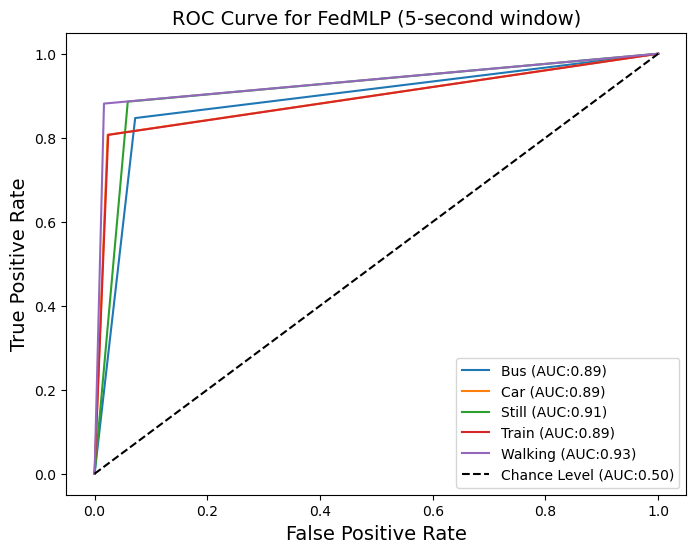

30/30 [==============================] - 0s 4ms/step - loss: 0.5462 - sparse_categorical_accuracy: 0.7994
y_pred = [1 0 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 113 | global_acc: 84.478% | global_loss: 1.125637412071228
              precision    recall  f1-score   support

           0       0.71      0.89      0.78       235
           1       0.92      0.80      0.85       228
           2       0.86      0.82      0.84       228
           3       0.87      0.84      0.85       269
           4       0.93      0.88      0.90       219

    accuracy                           0.84      1179
   macro avg       0.86      0.84      0.85      1179
weighted avg       0.85      0.84      0.85      1179

0.902948824327224


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


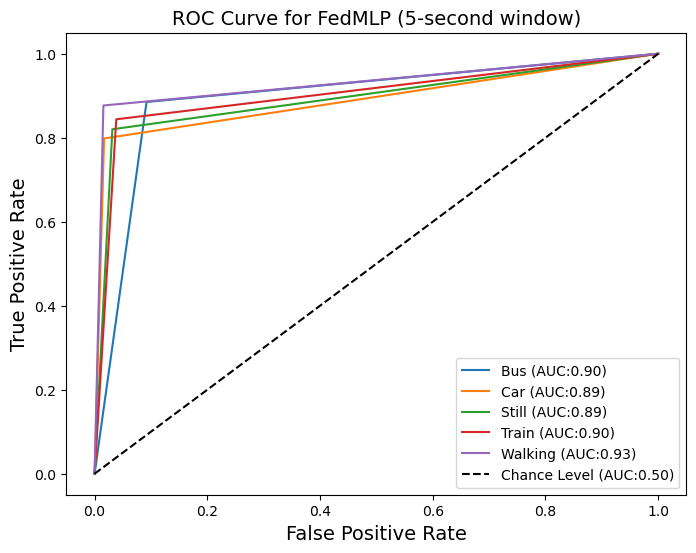

30/30 [==============================] - 0s 5ms/step - loss: 0.5073 - sparse_categorical_accuracy: 0.8163
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 114 | global_acc: 84.394% | global_loss: 1.1234678030014038
              precision    recall  f1-score   support

           0       0.72      0.89      0.79       235
           1       0.92      0.80      0.86       228
           2       0.78      0.89      0.83       228
           3       0.93      0.77      0.84       269
           4       0.93      0.89      0.91       219

    accuracy                           0.84      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.84      0.85      1179

0.9039616352085773


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


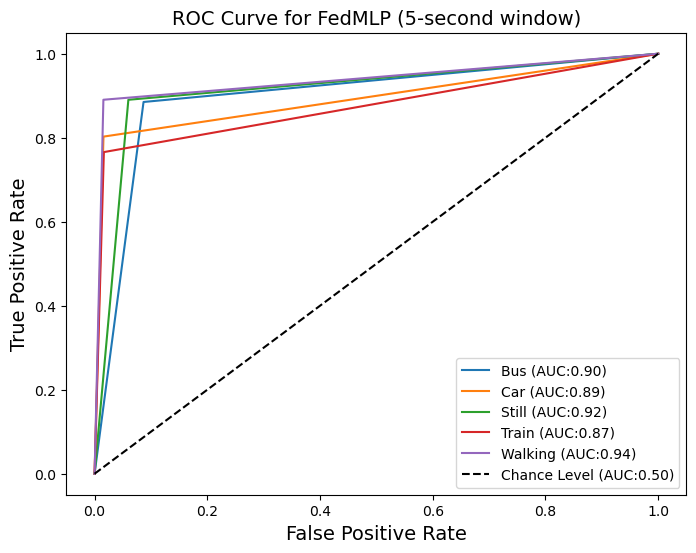

30/30 [==============================] - 0s 4ms/step - loss: 0.5363 - sparse_categorical_accuracy: 0.8025
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 115 | global_acc: 84.987% | global_loss: 1.1265195608139038
              precision    recall  f1-score   support

           0       0.72      0.88      0.79       235
           1       0.91      0.83      0.87       228
           2       0.82      0.86      0.84       228
           3       0.93      0.80      0.86       269
           4       0.92      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.907201898623575


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


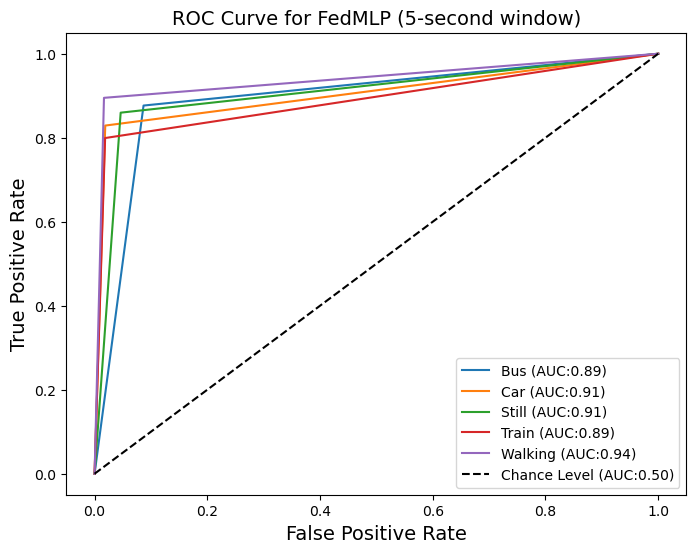

30/30 [==============================] - 1s 4ms/step - loss: 0.5150 - sparse_categorical_accuracy: 0.8163
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 116 | global_acc: 85.666% | global_loss: 1.1181834936141968
              precision    recall  f1-score   support

           0       0.76      0.85      0.80       235
           1       0.91      0.82      0.86       228
           2       0.81      0.88      0.84       228
           3       0.90      0.83      0.87       269
           4       0.92      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9110661247849983


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


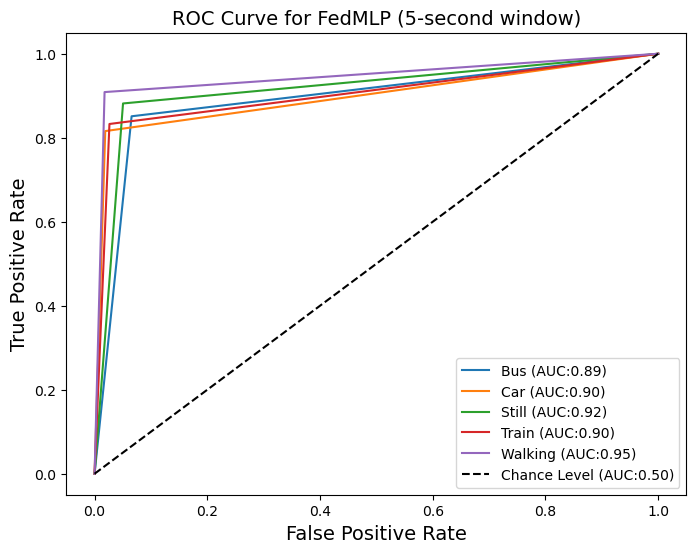

30/30 [==============================] - 0s 4ms/step - loss: 0.5252 - sparse_categorical_accuracy: 0.8163
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 117 | global_acc: 84.987% | global_loss: 1.1251548528671265
              precision    recall  f1-score   support

           0       0.74      0.86      0.80       235
           1       0.89      0.83      0.86       228
           2       0.81      0.86      0.83       228
           3       0.91      0.81      0.86       269
           4       0.92      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9069781518484538


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


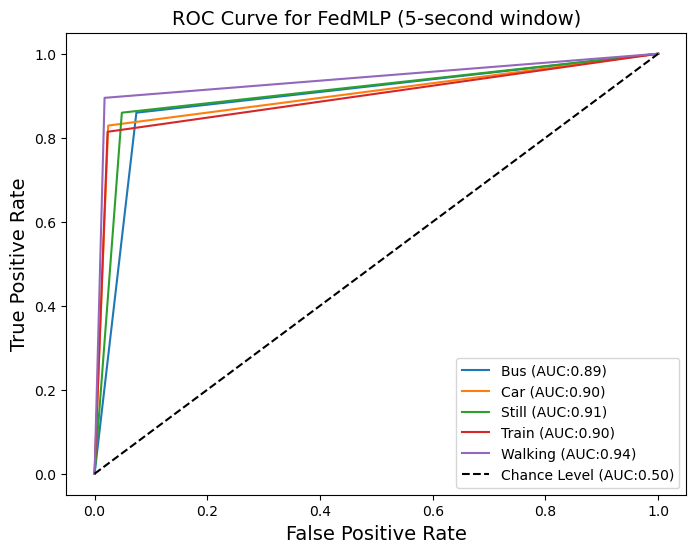

30/30 [==============================] - 0s 4ms/step - loss: 0.5286 - sparse_categorical_accuracy: 0.8206
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 118 | global_acc: 85.920% | global_loss: 1.1188009977340698
              precision    recall  f1-score   support

           0       0.79      0.83      0.81       235
           1       0.91      0.81      0.86       228
           2       0.89      0.82      0.85       228
           3       0.82      0.90      0.86       269
           4       0.91      0.93      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9115293964787586


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


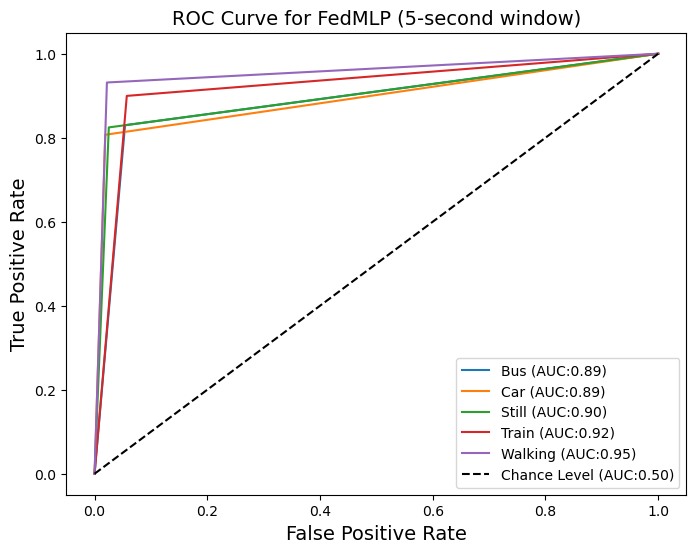

30/30 [==============================] - 0s 4ms/step - loss: 0.5149 - sparse_categorical_accuracy: 0.8100
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 119 | global_acc: 84.818% | global_loss: 1.122380256652832
              precision    recall  f1-score   support

           0       0.73      0.88      0.80       235
           1       0.91      0.82      0.86       228
           2       0.82      0.85      0.84       228
           3       0.89      0.83      0.86       269
           4       0.93      0.88      0.90       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9055120919441807


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


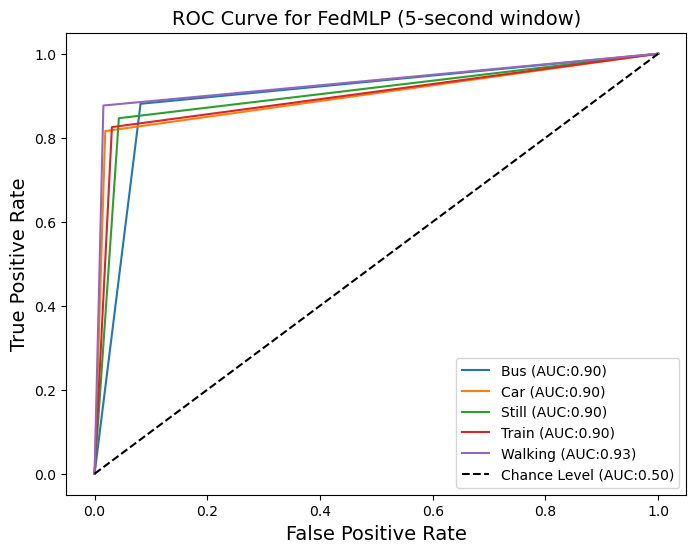

30/30 [==============================] - 0s 4ms/step - loss: 0.5313 - sparse_categorical_accuracy: 0.8174
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 120 | global_acc: 85.327% | global_loss: 1.1192522048950195
              precision    recall  f1-score   support

           0       0.74      0.87      0.80       235
           1       0.91      0.83      0.87       228
           2       0.81      0.86      0.84       228
           3       0.92      0.80      0.86       269
           4       0.92      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.85      0.85      1179

0.9093735190576224


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


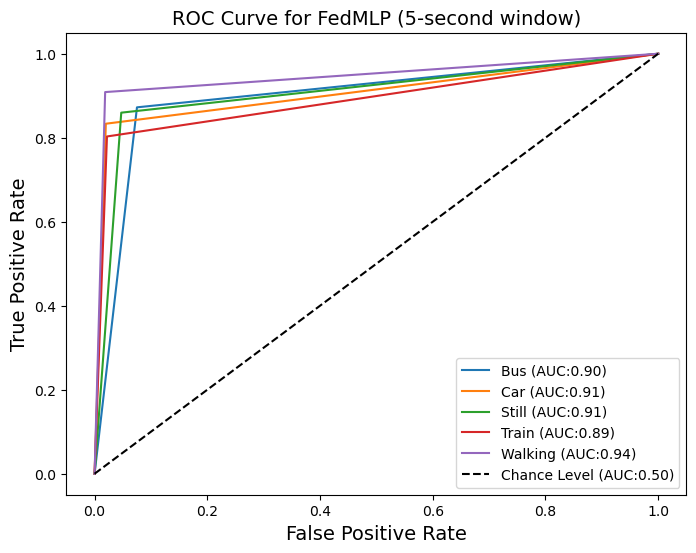

30/30 [==============================] - 0s 4ms/step - loss: 0.5102 - sparse_categorical_accuracy: 0.8217
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 121 | global_acc: 84.987% | global_loss: 1.120831847190857
              precision    recall  f1-score   support

           0       0.73      0.87      0.80       235
           1       0.91      0.82      0.87       228
           2       0.80      0.87      0.83       228
           3       0.92      0.78      0.84       269
           4       0.92      0.92      0.92       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9077143909098802


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


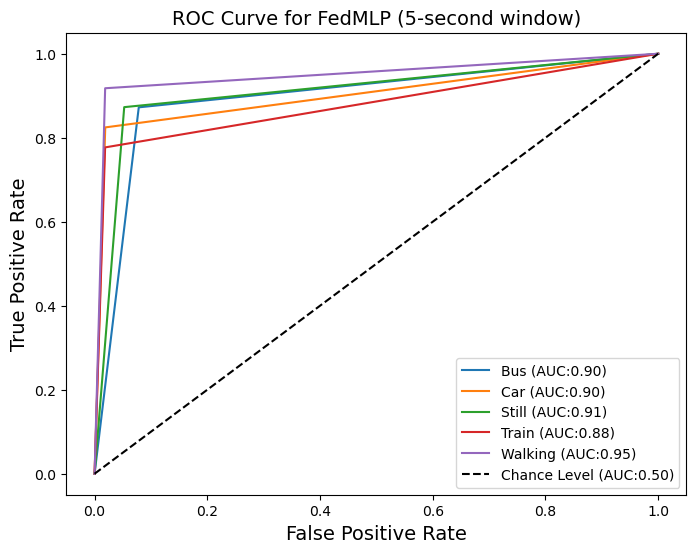

30/30 [==============================] - 0s 4ms/step - loss: 0.5342 - sparse_categorical_accuracy: 0.8185
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 122 | global_acc: 85.072% | global_loss: 1.1184810400009155
              precision    recall  f1-score   support

           0       0.73      0.87      0.80       235
           1       0.90      0.82      0.86       228
           2       0.83      0.86      0.84       228
           3       0.90      0.83      0.86       269
           4       0.93      0.88      0.90       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9072218468256039


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


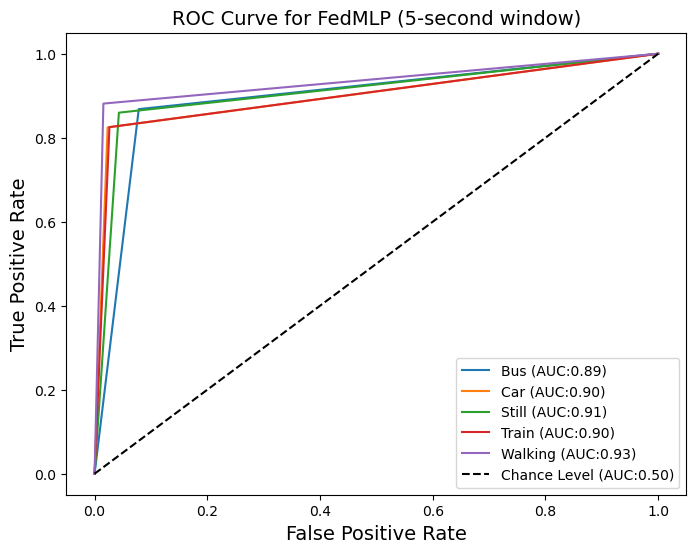

30/30 [==============================] - 0s 4ms/step - loss: 0.4964 - sparse_categorical_accuracy: 0.8259
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 123 | global_acc: 84.818% | global_loss: 1.120124340057373
              precision    recall  f1-score   support

           0       0.73      0.86      0.79       235
           1       0.90      0.83      0.87       228
           2       0.86      0.81      0.83       228
           3       0.88      0.82      0.85       269
           4       0.90      0.92      0.91       219

    accuracy                           0.85      1179
   macro avg       0.85      0.85      0.85      1179
weighted avg       0.85      0.85      0.85      1179

0.905878264563895


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


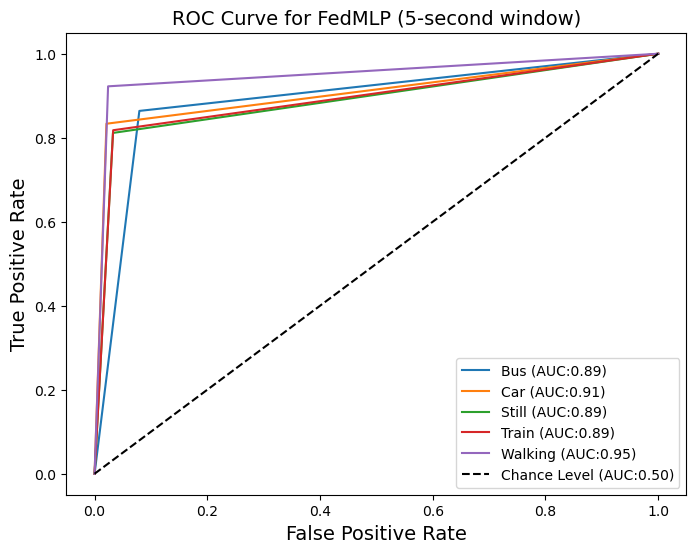

30/30 [==============================] - 0s 4ms/step - loss: 0.5284 - sparse_categorical_accuracy: 0.8132
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 124 | global_acc: 85.581% | global_loss: 1.1190967559814453
              precision    recall  f1-score   support

           0       0.73      0.88      0.80       235
           1       0.91      0.83      0.87       228
           2       0.83      0.86      0.84       228
           3       0.92      0.81      0.86       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9108756744236424


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


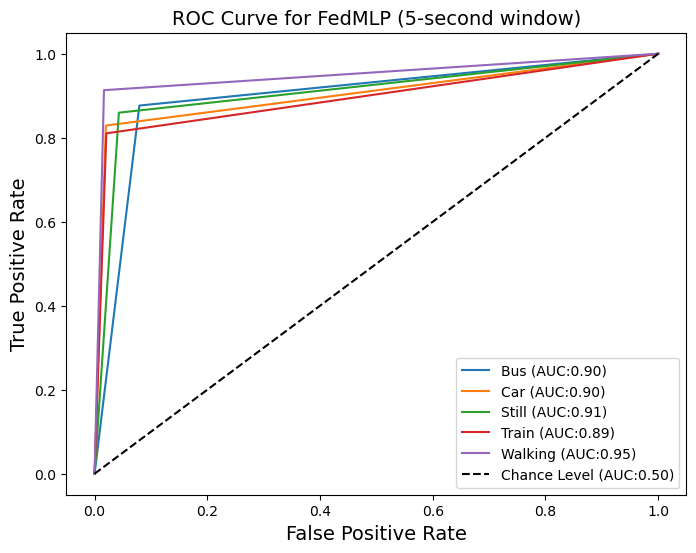

30/30 [==============================] - 0s 4ms/step - loss: 0.5010 - sparse_categorical_accuracy: 0.8312
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 125 | global_acc: 85.242% | global_loss: 1.1146007776260376
              precision    recall  f1-score   support

           0       0.74      0.87      0.80       235
           1       0.90      0.82      0.86       228
           2       0.87      0.83      0.85       228
           3       0.86      0.86      0.86       269
           4       0.92      0.89      0.90       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9077204664171111


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


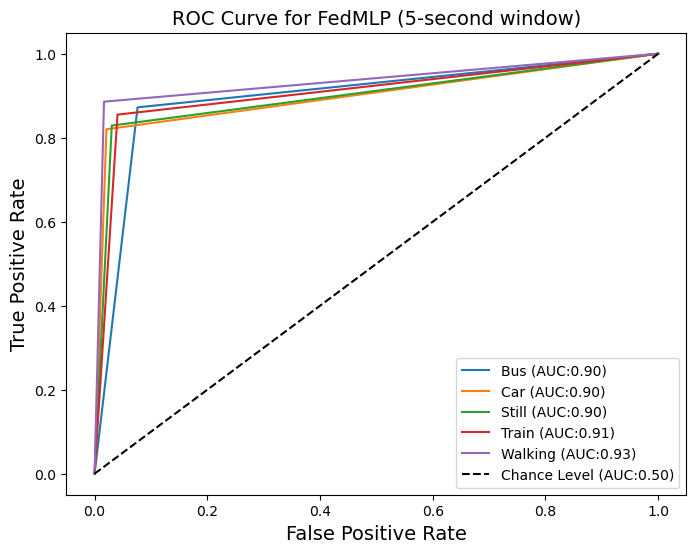

30/30 [==============================] - 0s 4ms/step - loss: 0.5215 - sparse_categorical_accuracy: 0.8238
y_pred = [1 2 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 126 | global_acc: 85.751% | global_loss: 1.11460542678833
              precision    recall  f1-score   support

           0       0.76      0.87      0.81       235
           1       0.90      0.82      0.86       228
           2       0.82      0.89      0.85       228
           3       0.91      0.83      0.87       269
           4       0.92      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9116301038623679


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


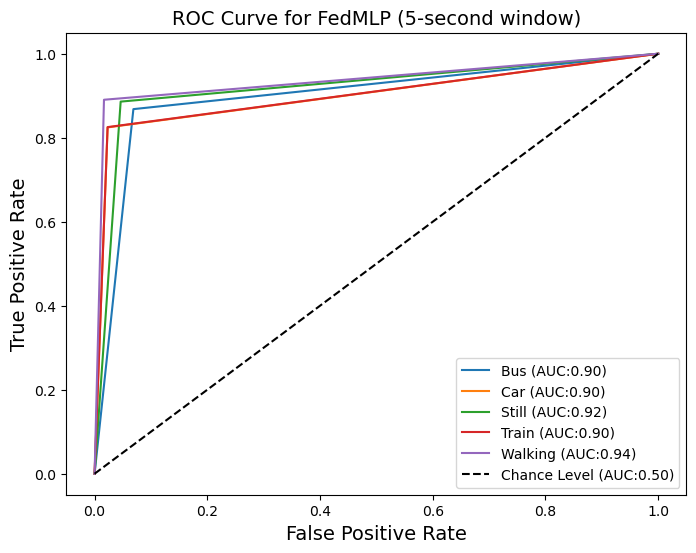

30/30 [==============================] - 0s 4ms/step - loss: 0.5079 - sparse_categorical_accuracy: 0.8291
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 127 | global_acc: 85.581% | global_loss: 1.1177306175231934
              precision    recall  f1-score   support

           0       0.76      0.86      0.80       235
           1       0.90      0.83      0.86       228
           2       0.81      0.89      0.85       228
           3       0.94      0.79      0.86       269
           4       0.91      0.93      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9113837562945128


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


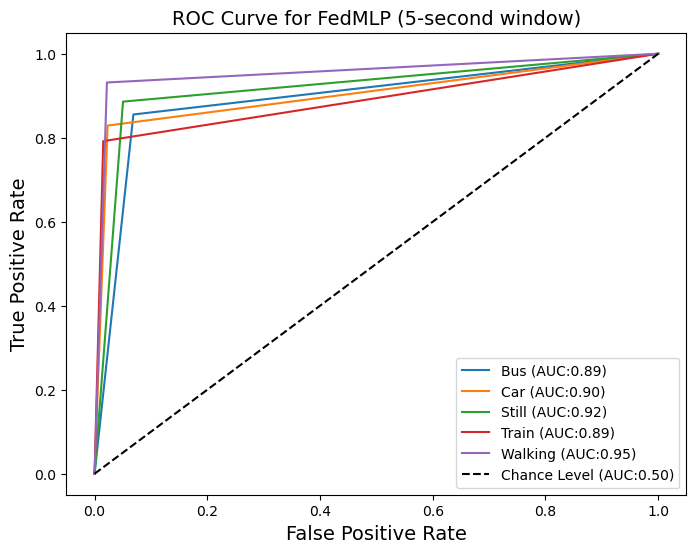

30/30 [==============================] - 0s 5ms/step - loss: 0.4986 - sparse_categorical_accuracy: 0.8323
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 128 | global_acc: 85.751% | global_loss: 1.1129597425460815
              precision    recall  f1-score   support

           0       0.76      0.86      0.81       235
           1       0.92      0.82      0.86       228
           2       0.82      0.88      0.85       228
           3       0.91      0.83      0.87       269
           4       0.91      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9116755337070603


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


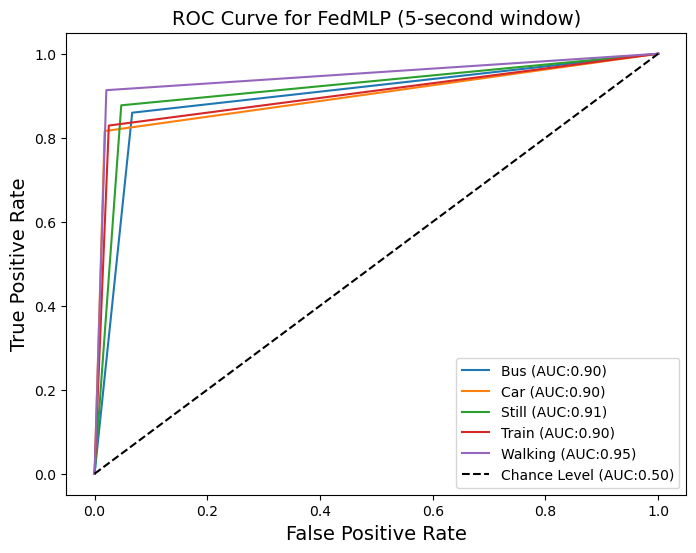

30/30 [==============================] - 0s 4ms/step - loss: 0.5132 - sparse_categorical_accuracy: 0.8280
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 129 | global_acc: 85.242% | global_loss: 1.1159331798553467
              precision    recall  f1-score   support

           0       0.75      0.87      0.80       235
           1       0.92      0.82      0.87       228
           2       0.81      0.87      0.84       228
           3       0.91      0.80      0.85       269
           4       0.90      0.91      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9089282674356784


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


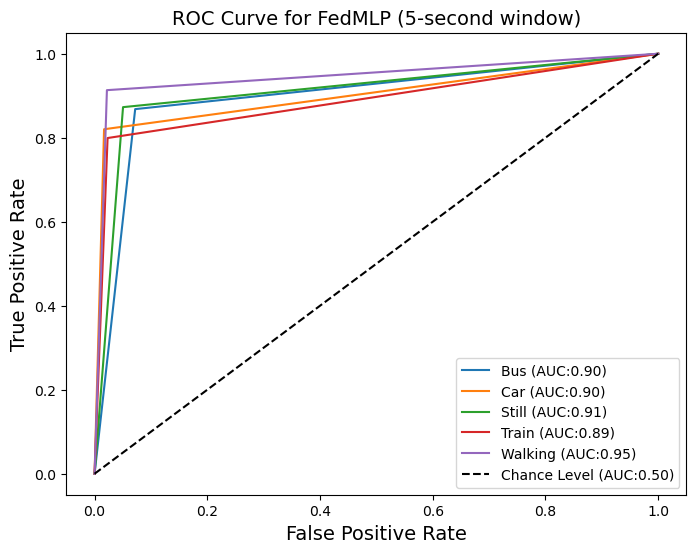

30/30 [==============================] - 0s 4ms/step - loss: 0.4563 - sparse_categorical_accuracy: 0.8397
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 130 | global_acc: 85.666% | global_loss: 1.1095384359359741
              precision    recall  f1-score   support

           0       0.77      0.86      0.81       235
           1       0.92      0.81      0.86       228
           2       0.82      0.87      0.84       228
           3       0.88      0.85      0.87       269
           4       0.91      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9107625338686625


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


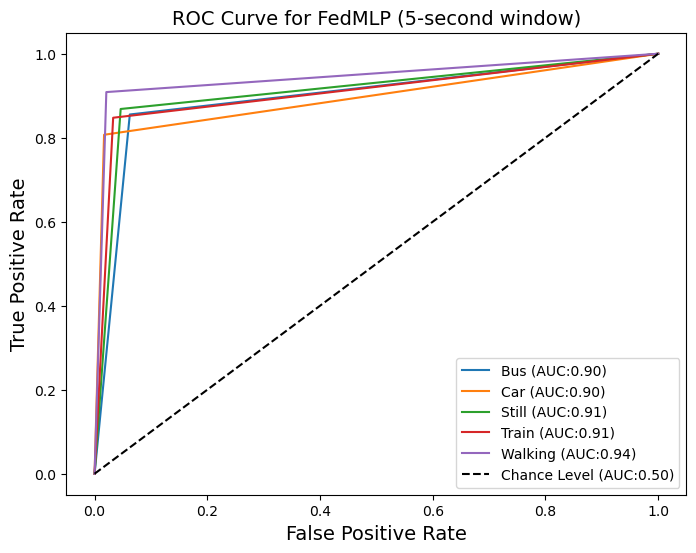

30/30 [==============================] - 0s 5ms/step - loss: 0.5053 - sparse_categorical_accuracy: 0.8132
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 131 | global_acc: 85.666% | global_loss: 1.110188364982605
              precision    recall  f1-score   support

           0       0.77      0.87      0.82       235
           1       0.92      0.82      0.86       228
           2       0.82      0.86      0.84       228
           3       0.89      0.83      0.86       269
           4       0.90      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9110900300381889


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


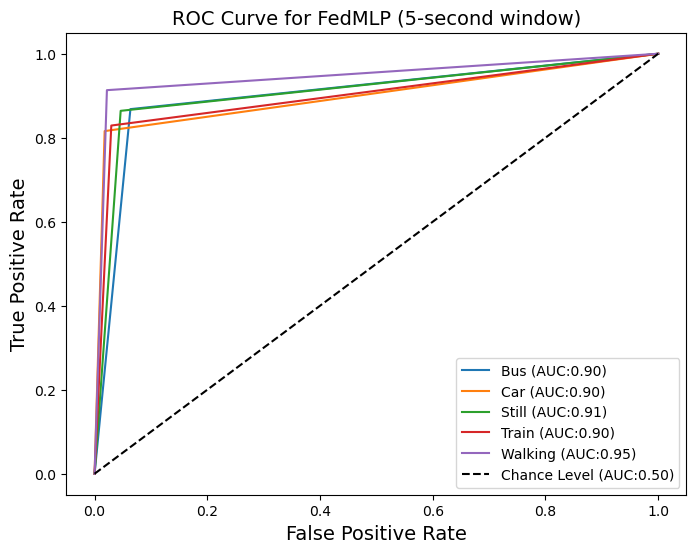

30/30 [==============================] - 0s 4ms/step - loss: 0.5210 - sparse_categorical_accuracy: 0.8057
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 132 | global_acc: 84.224% | global_loss: 1.1153424978256226
              precision    recall  f1-score   support

           0       0.70      0.89      0.78       235
           1       0.93      0.79      0.85       228
           2       0.82      0.82      0.82       228
           3       0.89      0.82      0.85       269
           4       0.93      0.90      0.91       219

    accuracy                           0.84      1179
   macro avg       0.85      0.84      0.84      1179
weighted avg       0.85      0.84      0.84      1179

0.9018890356296737


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


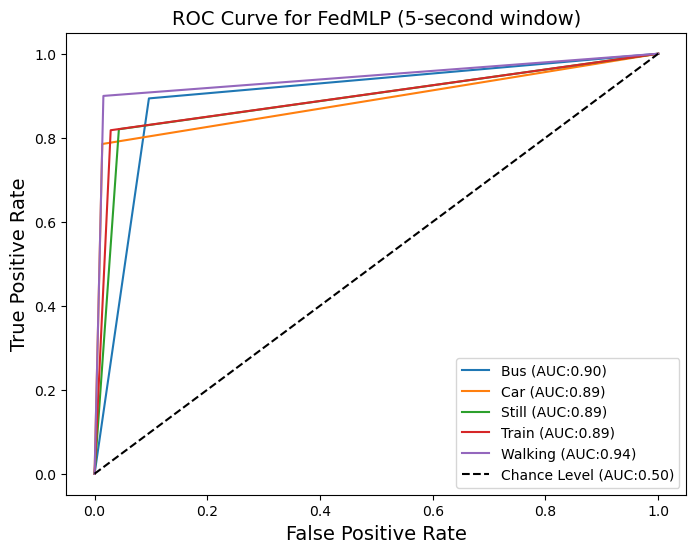

30/30 [==============================] - 0s 5ms/step - loss: 0.4961 - sparse_categorical_accuracy: 0.8227
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 133 | global_acc: 84.987% | global_loss: 1.1153899431228638
              precision    recall  f1-score   support

           0       0.71      0.89      0.79       235
           1       0.92      0.81      0.86       228
           2       0.81      0.88      0.84       228
           3       0.94      0.77      0.85       269
           4       0.93      0.91      0.92       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9076825467286612


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


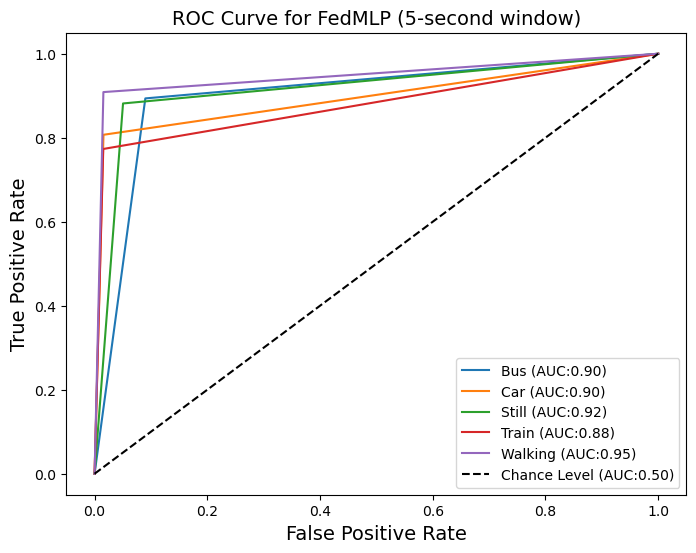

30/30 [==============================] - 0s 5ms/step - loss: 0.4903 - sparse_categorical_accuracy: 0.8333
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 134 | global_acc: 85.496% | global_loss: 1.1178210973739624
              precision    recall  f1-score   support

           0       0.71      0.91      0.80       235
           1       0.91      0.85      0.88       228
           2       0.83      0.86      0.84       228
           3       0.95      0.78      0.86       269
           4       0.92      0.90      0.91       219

    accuracy                           0.85      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.85      0.86      1179

0.9107515039811315


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


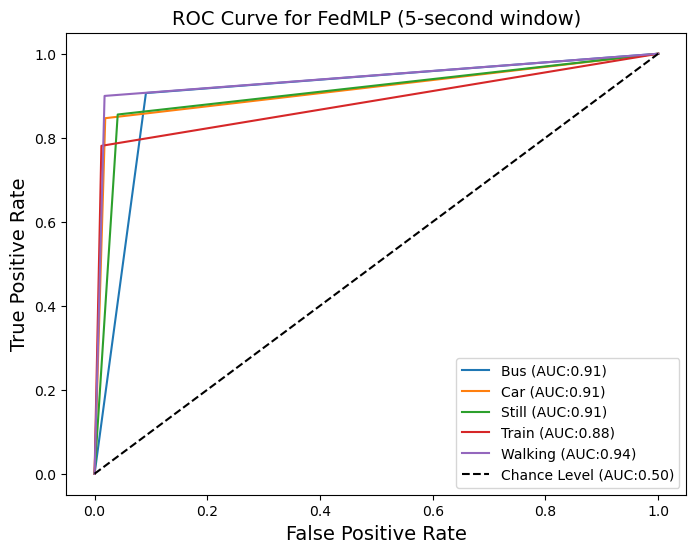

30/30 [==============================] - 0s 5ms/step - loss: 0.4744 - sparse_categorical_accuracy: 0.8185
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 135 | global_acc: 86.005% | global_loss: 1.1108208894729614
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       235
           1       0.92      0.82      0.87       228
           2       0.81      0.89      0.85       228
           3       0.92      0.83      0.87       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9131885892004155


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


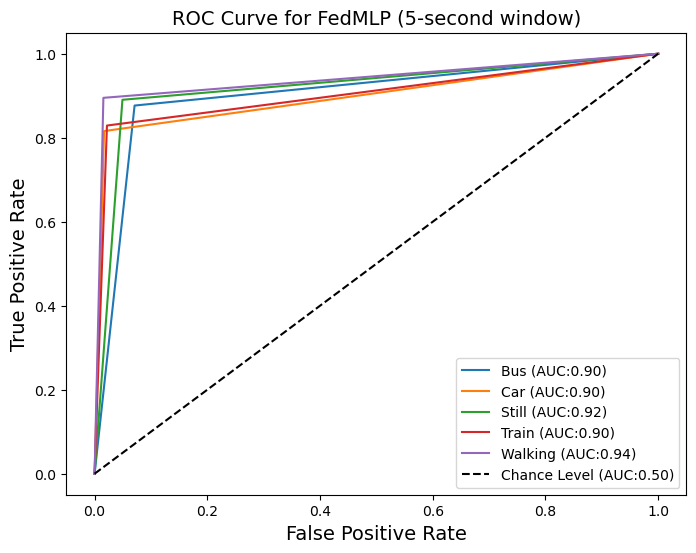

30/30 [==============================] - 0s 5ms/step - loss: 0.5145 - sparse_categorical_accuracy: 0.8195
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 136 | global_acc: 86.175% | global_loss: 1.1110128164291382
              precision    recall  f1-score   support

           0       0.76      0.87      0.81       235
           1       0.92      0.82      0.86       228
           2       0.83      0.88      0.85       228
           3       0.91      0.84      0.87       269
           4       0.92      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.91423247919845


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


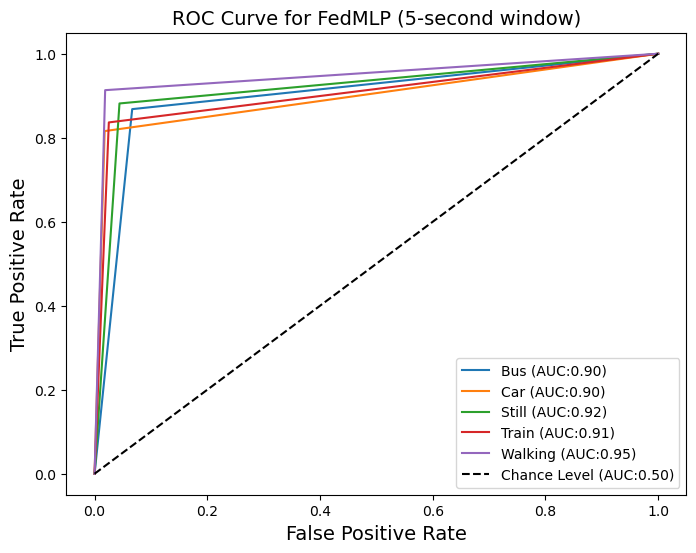

30/30 [==============================] - 1s 5ms/step - loss: 0.4913 - sparse_categorical_accuracy: 0.8280
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 137 | global_acc: 86.175% | global_loss: 1.1105999946594238
              precision    recall  f1-score   support

           0       0.78      0.86      0.82       235
           1       0.92      0.82      0.87       228
           2       0.82      0.88      0.85       228
           3       0.90      0.85      0.87       269
           4       0.91      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9140372107248436


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


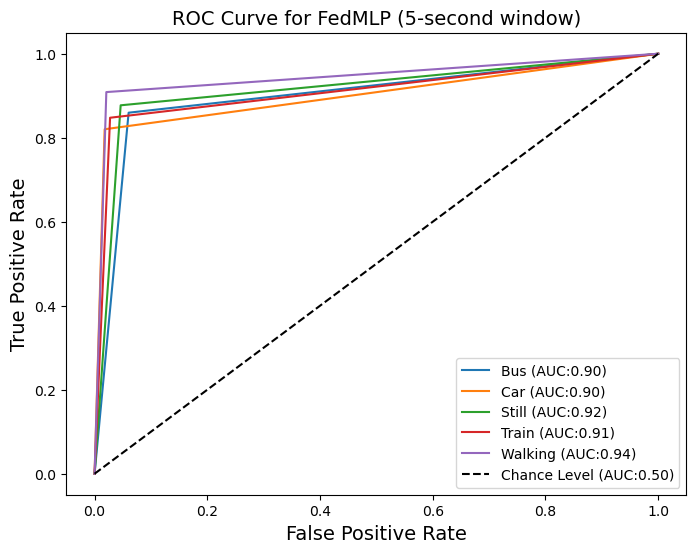

30/30 [==============================] - 0s 4ms/step - loss: 0.4963 - sparse_categorical_accuracy: 0.8333
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 138 | global_acc: 85.835% | global_loss: 1.110283613204956
              precision    recall  f1-score   support

           0       0.74      0.88      0.81       235
           1       0.92      0.82      0.87       228
           2       0.82      0.86      0.84       228
           3       0.91      0.84      0.87       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9118560804089763


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


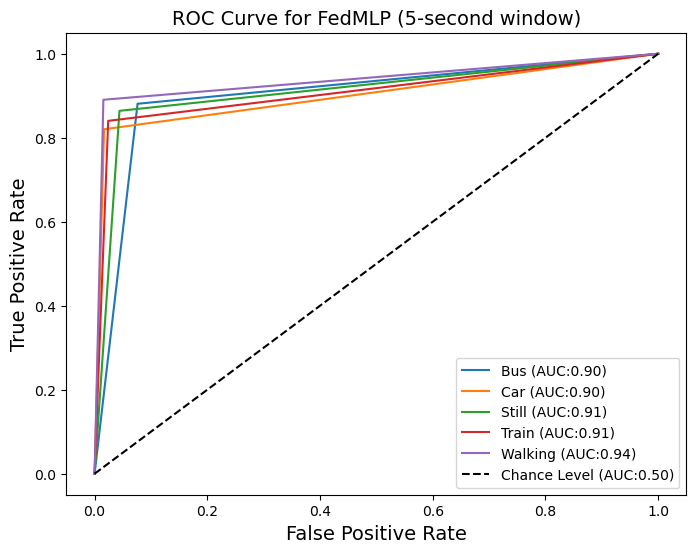

30/30 [==============================] - 1s 5ms/step - loss: 0.4964 - sparse_categorical_accuracy: 0.8100
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 139 | global_acc: 85.835% | global_loss: 1.108842134475708
              precision    recall  f1-score   support

           0       0.76      0.88      0.81       235
           1       0.92      0.82      0.87       228
           2       0.84      0.84      0.84       228
           3       0.88      0.86      0.87       269
           4       0.93      0.90      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9115812545917873


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


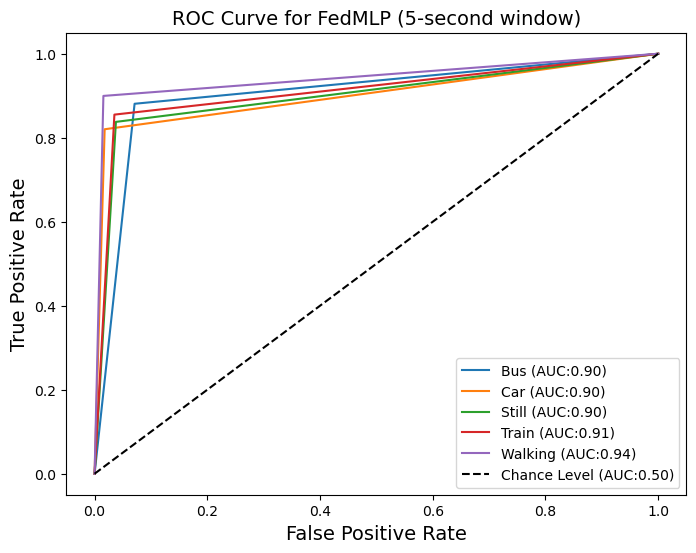

30/30 [==============================] - 0s 4ms/step - loss: 0.4498 - sparse_categorical_accuracy: 0.8439
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 140 | global_acc: 85.327% | global_loss: 1.1082861423492432
              precision    recall  f1-score   support

           0       0.76      0.87      0.81       235
           1       0.92      0.81      0.86       228
           2       0.81      0.87      0.84       228
           3       0.88      0.84      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9086616692880221


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


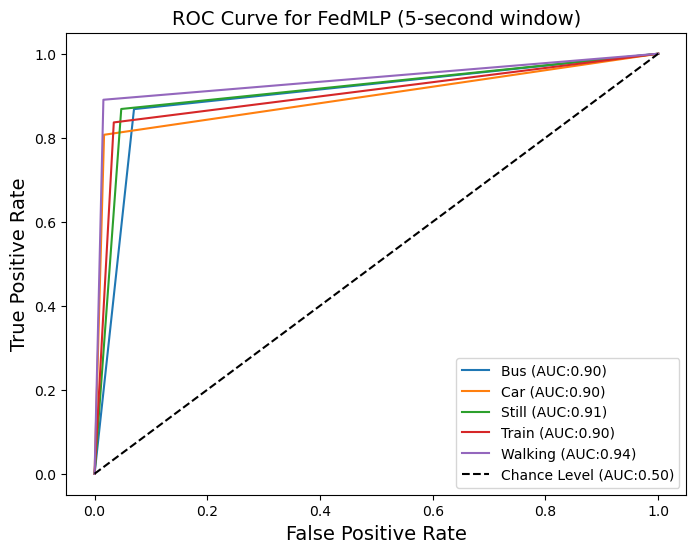

30/30 [==============================] - 0s 4ms/step - loss: 0.4989 - sparse_categorical_accuracy: 0.8323
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 141 | global_acc: 86.175% | global_loss: 1.1082215309143066
              precision    recall  f1-score   support

           0       0.77      0.87      0.82       235
           1       0.92      0.81      0.86       228
           2       0.82      0.87      0.85       228
           3       0.90      0.84      0.87       269
           4       0.91      0.92      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9141296651946009


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


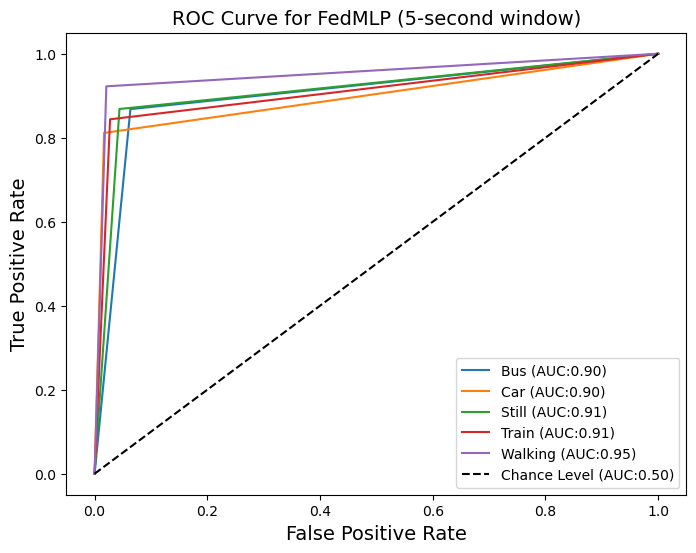

30/30 [==============================] - 0s 4ms/step - loss: 0.5056 - sparse_categorical_accuracy: 0.8270
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 142 | global_acc: 85.411% | global_loss: 1.1097227334976196
              precision    recall  f1-score   support

           0       0.75      0.87      0.80       235
           1       0.90      0.83      0.87       228
           2       0.83      0.83      0.83       228
           3       0.91      0.82      0.86       269
           4       0.91      0.93      0.92       219

    accuracy                           0.85      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.85      0.85      1179

0.9097480996458789


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


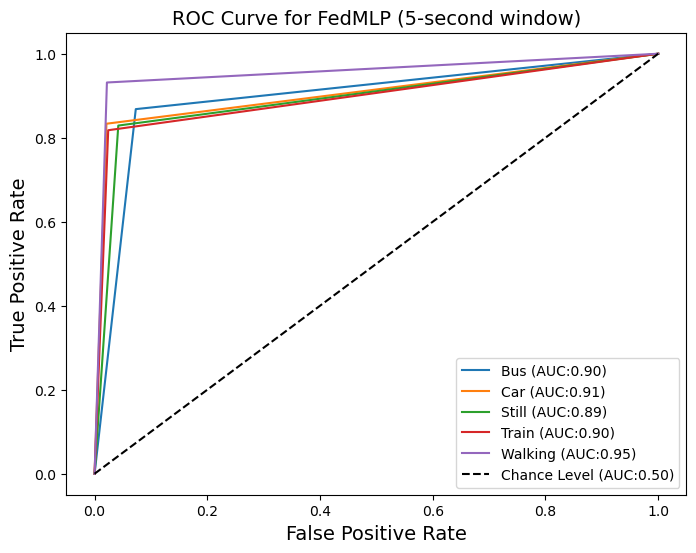

30/30 [==============================] - 0s 5ms/step - loss: 0.4987 - sparse_categorical_accuracy: 0.8397
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 143 | global_acc: 85.327% | global_loss: 1.1066912412643433
              precision    recall  f1-score   support

           0       0.76      0.86      0.81       235
           1       0.92      0.81      0.86       228
           2       0.83      0.86      0.85       228
           3       0.86      0.85      0.85       269
           4       0.93      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9084292951447932


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


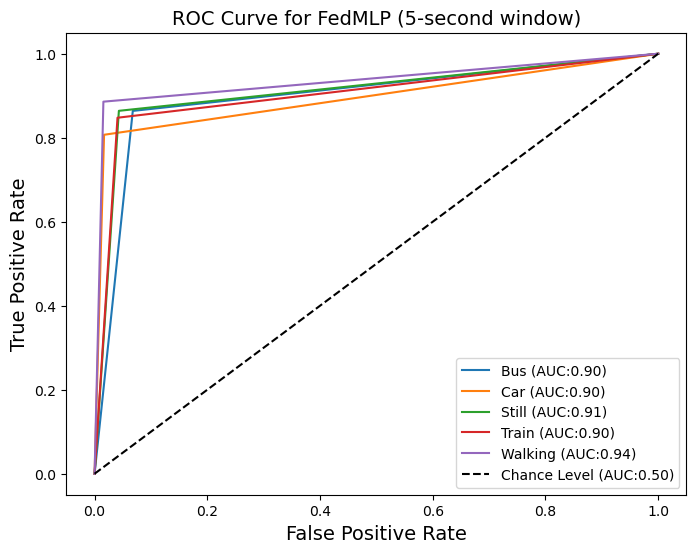

30/30 [==============================] - 0s 4ms/step - loss: 0.4968 - sparse_categorical_accuracy: 0.8280
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 144 | global_acc: 85.666% | global_loss: 1.1055619716644287
              precision    recall  f1-score   support

           0       0.74      0.87      0.80       235
           1       0.92      0.82      0.87       228
           2       0.82      0.86      0.84       228
           3       0.92      0.83      0.87       269
           4       0.91      0.92      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9111371725344991


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


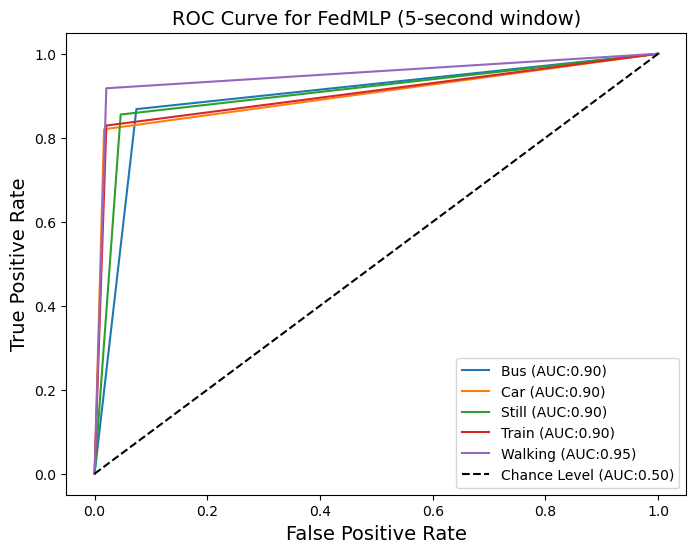

30/30 [==============================] - 0s 5ms/step - loss: 0.4849 - sparse_categorical_accuracy: 0.8461
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 145 | global_acc: 84.902% | global_loss: 1.1126089096069336
              precision    recall  f1-score   support

           0       0.71      0.89      0.79       235
           1       0.93      0.82      0.87       228
           2       0.81      0.87      0.84       228
           3       0.93      0.79      0.85       269
           4       0.93      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9067888252875514


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


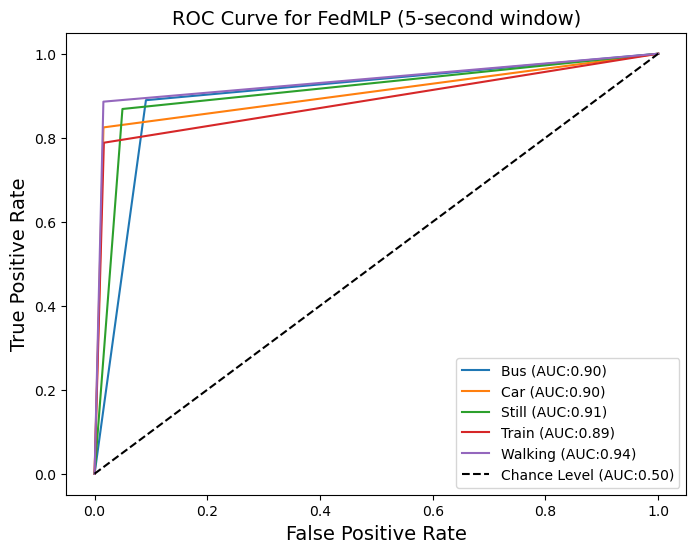

30/30 [==============================] - 0s 5ms/step - loss: 0.4635 - sparse_categorical_accuracy: 0.8397
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 146 | global_acc: 85.835% | global_loss: 1.1122925281524658
              precision    recall  f1-score   support

           0       0.73      0.90      0.80       235
           1       0.91      0.85      0.88       228
           2       0.83      0.86      0.85       228
           3       0.95      0.78      0.86       269
           4       0.91      0.92      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9130313770390709


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


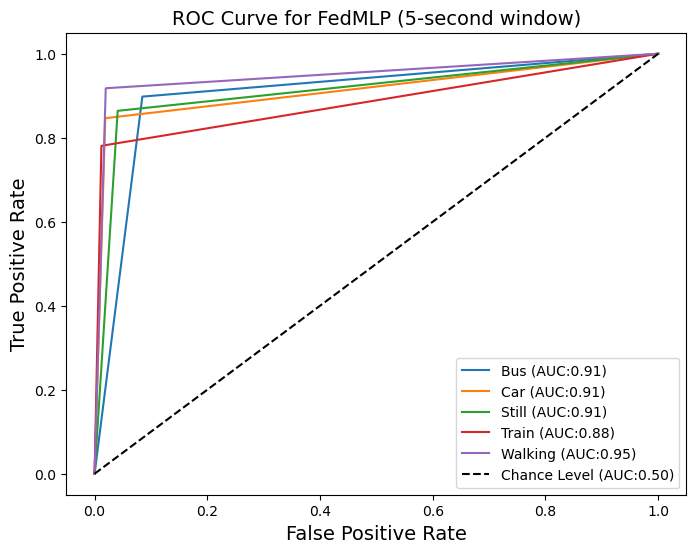

30/30 [==============================] - 0s 5ms/step - loss: 0.4839 - sparse_categorical_accuracy: 0.8355
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 147 | global_acc: 85.496% | global_loss: 1.1061046123504639
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       235
           1       0.91      0.82      0.87       228
           2       0.83      0.84      0.84       228
           3       0.91      0.83      0.87       269
           4       0.93      0.90      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.85      0.86      1179

0.9099007181865361


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


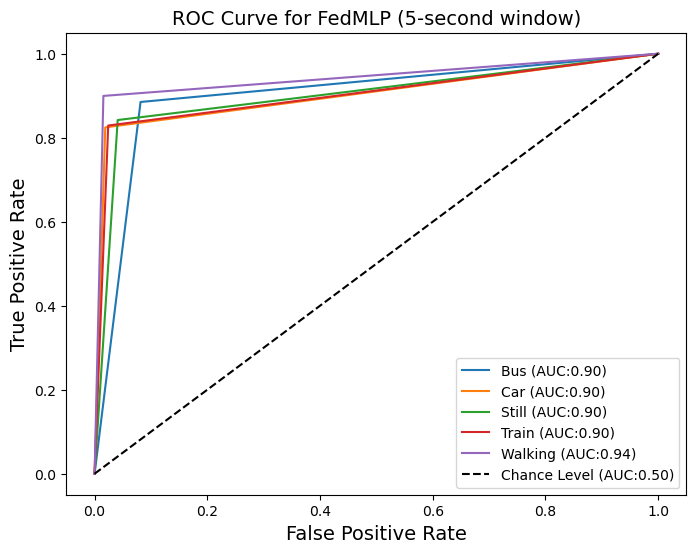

30/30 [==============================] - 0s 3ms/step - loss: 0.4379 - sparse_categorical_accuracy: 0.8482
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 148 | global_acc: 85.835% | global_loss: 1.10806405544281
              precision    recall  f1-score   support

           0       0.74      0.89      0.81       235
           1       0.93      0.82      0.87       228
           2       0.81      0.88      0.84       228
           3       0.93      0.80      0.86       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9125934505647099


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


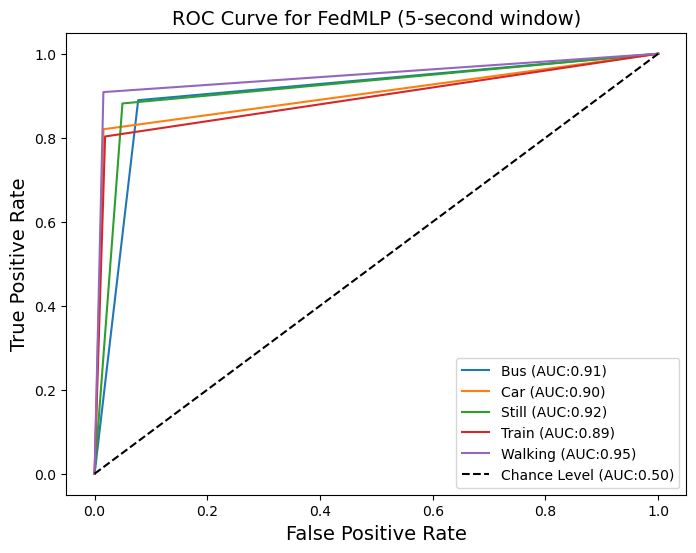

30/30 [==============================] - 0s 4ms/step - loss: 0.4876 - sparse_categorical_accuracy: 0.8206
y_pred = [1 4 2 ... 4 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 149 | global_acc: 86.599% | global_loss: 1.1056262254714966
              precision    recall  f1-score   support

           0       0.80      0.85      0.82       235
           1       0.90      0.83      0.87       228
           2       0.81      0.90      0.85       228
           3       0.93      0.82      0.87       269
           4       0.90      0.94      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9175079491143935


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


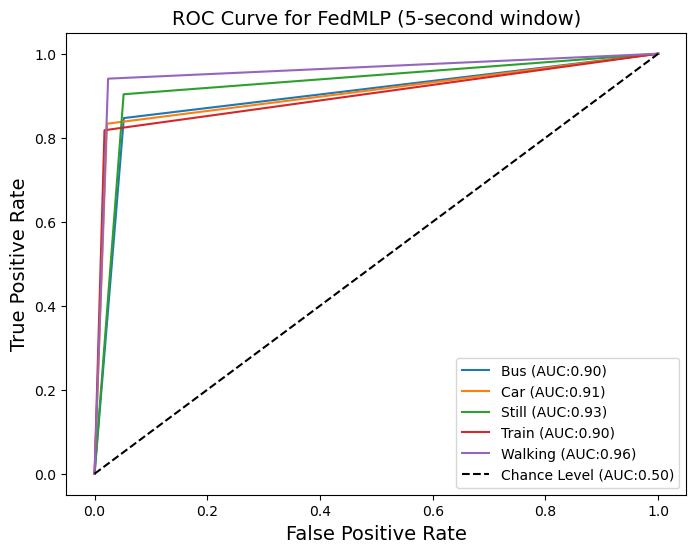

30/30 [==============================] - 0s 4ms/step - loss: 0.4798 - sparse_categorical_accuracy: 0.8301
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 150 | global_acc: 85.666% | global_loss: 1.104232907295227
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       235
           1       0.92      0.82      0.86       228
           2       0.84      0.85      0.85       228
           3       0.88      0.85      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9105898467345395


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


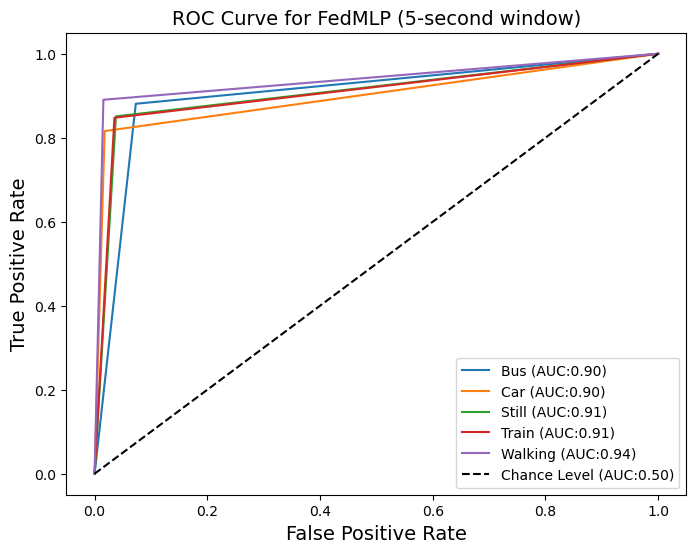

30/30 [==============================] - 0s 4ms/step - loss: 0.4756 - sparse_categorical_accuracy: 0.8344
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 151 | global_acc: 85.920% | global_loss: 1.1019260883331299
              precision    recall  f1-score   support

           0       0.77      0.86      0.82       235
           1       0.91      0.84      0.87       228
           2       0.86      0.83      0.84       228
           3       0.87      0.86      0.86       269
           4       0.90      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9121388840041978


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


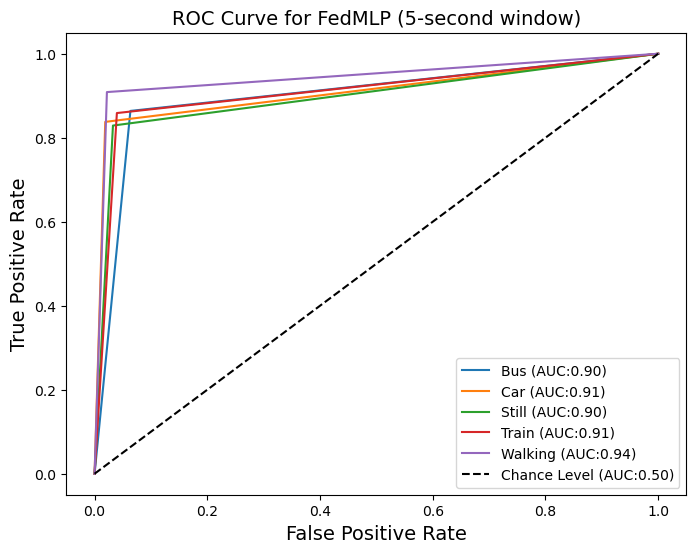

30/30 [==============================] - 0s 4ms/step - loss: 0.4739 - sparse_categorical_accuracy: 0.8376
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 152 | global_acc: 85.411% | global_loss: 1.103583574295044
              precision    recall  f1-score   support

           0       0.74      0.88      0.80       235
           1       0.91      0.83      0.87       228
           2       0.84      0.83      0.84       228
           3       0.89      0.83      0.86       269
           4       0.93      0.91      0.92       219

    accuracy                           0.85      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.85      0.86      1179

0.9094658557884004


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


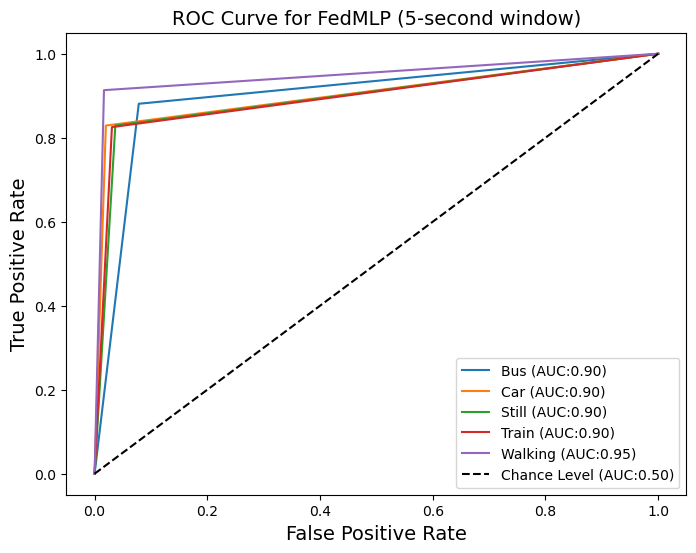

30/30 [==============================] - 0s 4ms/step - loss: 0.4800 - sparse_categorical_accuracy: 0.8248
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 153 | global_acc: 85.242% | global_loss: 1.1082653999328613
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       235
           1       0.91      0.83      0.87       228
           2       0.83      0.86      0.84       228
           3       0.91      0.82      0.86       269
           4       0.93      0.88      0.90       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9084018789907468


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


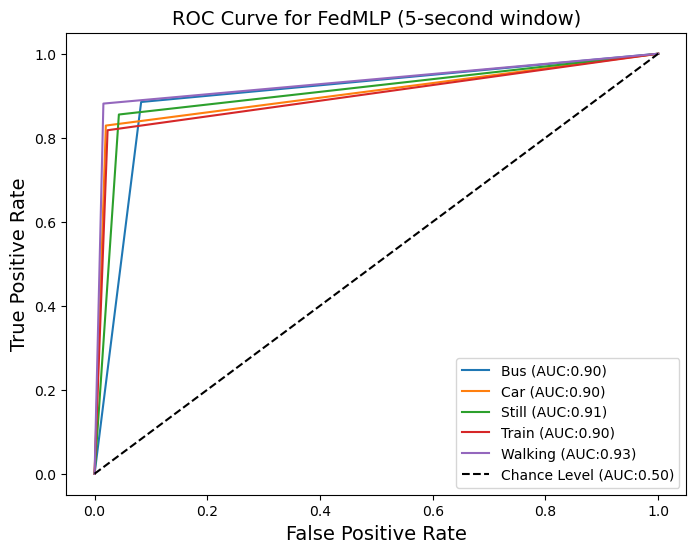

30/30 [==============================] - 0s 4ms/step - loss: 0.5009 - sparse_categorical_accuracy: 0.8323
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 154 | global_acc: 85.072% | global_loss: 1.1034845113754272
              precision    recall  f1-score   support

           0       0.72      0.89      0.80       235
           1       0.91      0.82      0.87       228
           2       0.84      0.83      0.83       228
           3       0.89      0.83      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.85      1179
   macro avg       0.86      0.85      0.85      1179
weighted avg       0.86      0.85      0.85      1179

0.9070358028969852


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


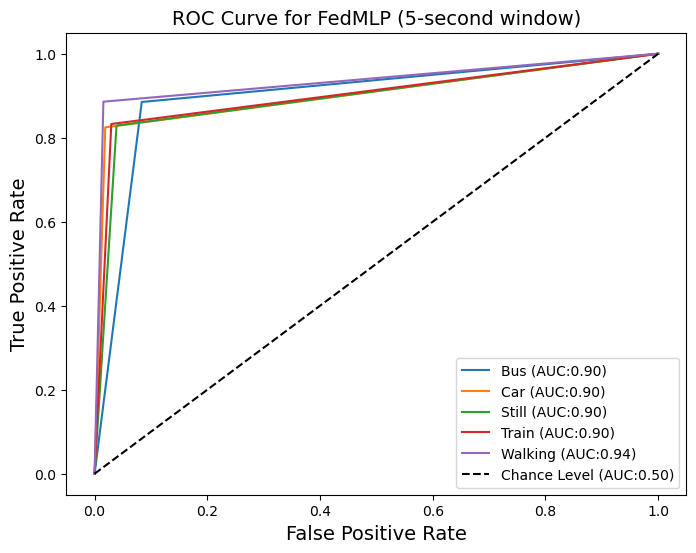

30/30 [==============================] - 0s 4ms/step - loss: 0.4780 - sparse_categorical_accuracy: 0.8259
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 155 | global_acc: 86.514% | global_loss: 1.1027730703353882
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.93      0.82      0.87       228
           2       0.83      0.88      0.85       228
           3       0.90      0.84      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9162049052881323


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


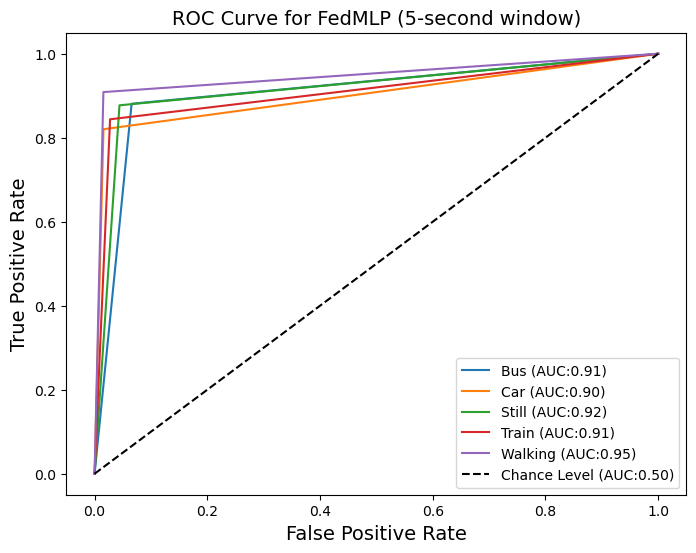

30/30 [==============================] - 0s 4ms/step - loss: 0.4406 - sparse_categorical_accuracy: 0.8408
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 156 | global_acc: 86.005% | global_loss: 1.1015944480895996
              precision    recall  f1-score   support

           0       0.76      0.88      0.81       235
           1       0.92      0.82      0.87       228
           2       0.83      0.84      0.84       228
           3       0.89      0.85      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9128101691295107


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


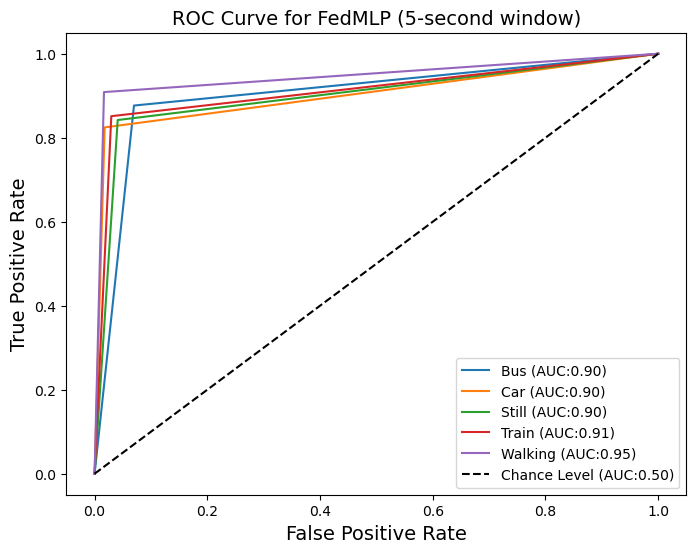

30/30 [==============================] - 0s 4ms/step - loss: 0.4745 - sparse_categorical_accuracy: 0.8471
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 157 | global_acc: 85.581% | global_loss: 1.1035808324813843
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       235
           1       0.91      0.83      0.87       228
           2       0.83      0.85      0.84       228
           3       0.92      0.81      0.86       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9107385843248214


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


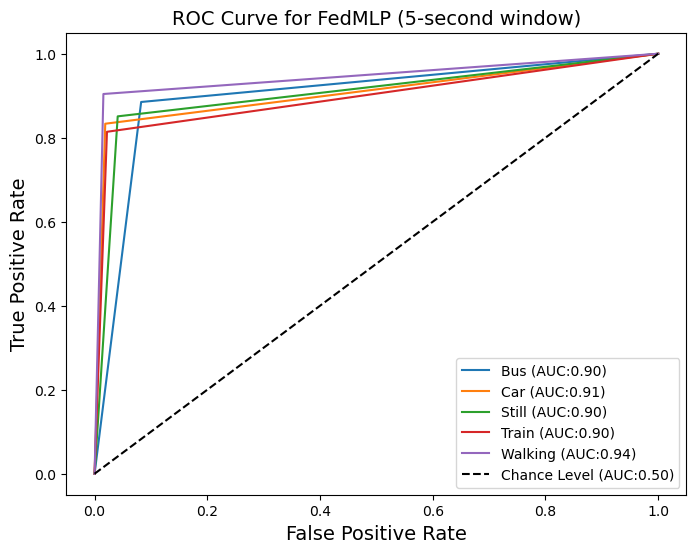

30/30 [==============================] - 0s 4ms/step - loss: 0.4288 - sparse_categorical_accuracy: 0.8567
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 158 | global_acc: 86.090% | global_loss: 1.1052197217941284
              precision    recall  f1-score   support

           0       0.75      0.89      0.81       235
           1       0.91      0.84      0.87       228
           2       0.81      0.89      0.85       228
           3       0.94      0.79      0.86       269
           4       0.92      0.91      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9144631306915689


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


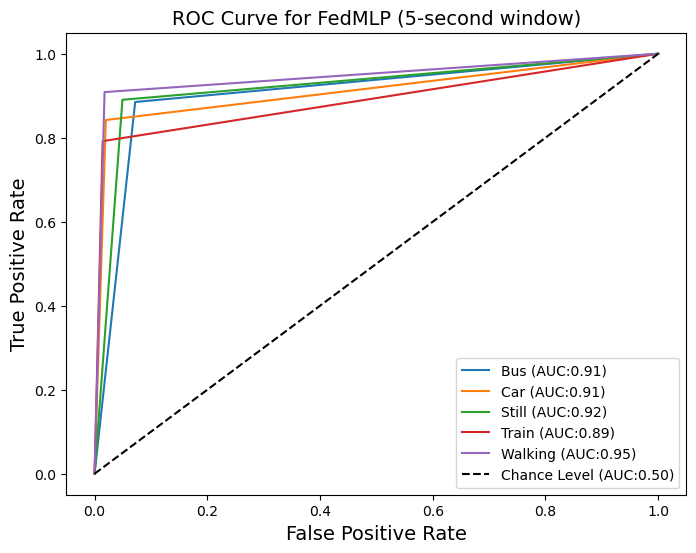

30/30 [==============================] - 0s 4ms/step - loss: 0.4737 - sparse_categorical_accuracy: 0.8344
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 159 | global_acc: 86.344% | global_loss: 1.101791262626648
              precision    recall  f1-score   support

           0       0.76      0.88      0.81       235
           1       0.92      0.83      0.88       228
           2       0.83      0.88      0.85       228
           3       0.91      0.84      0.87       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.87      1179
weighted avg       0.87      0.86      0.86      1179

0.9151185149378765


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


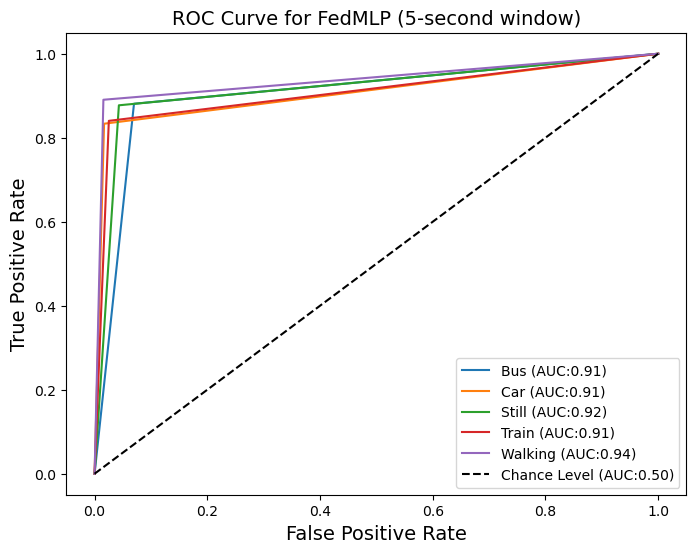

30/30 [==============================] - 0s 4ms/step - loss: 0.4601 - sparse_categorical_accuracy: 0.8301
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 160 | global_acc: 85.835% | global_loss: 1.1048966646194458
              precision    recall  f1-score   support

           0       0.75      0.89      0.81       235
           1       0.90      0.86      0.88       228
           2       0.83      0.83      0.83       228
           3       0.91      0.82      0.86       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9122989647809557


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


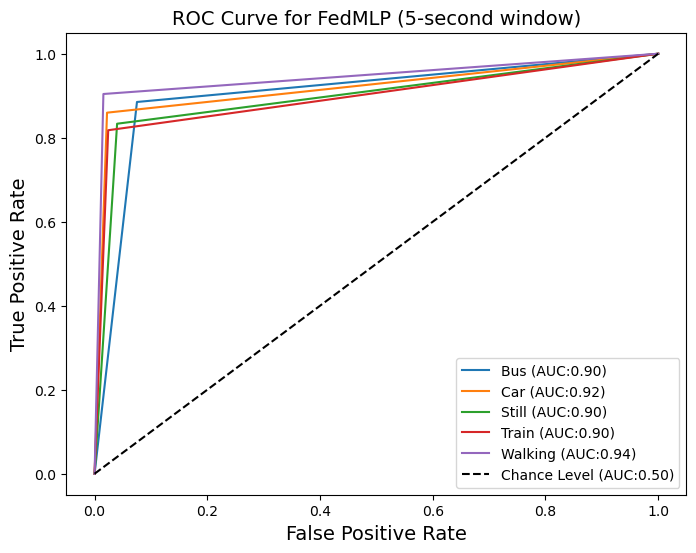

30/30 [==============================] - 0s 4ms/step - loss: 0.4698 - sparse_categorical_accuracy: 0.8238
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 161 | global_acc: 85.581% | global_loss: 1.1006457805633545
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       235
           1       0.91      0.83      0.87       228
           2       0.82      0.87      0.85       228
           3       0.93      0.81      0.86       269
           4       0.93      0.90      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9108692510188753


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


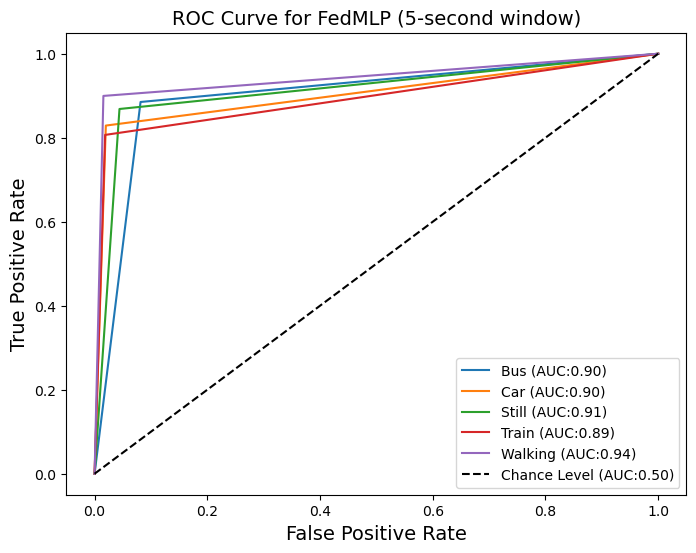

30/30 [==============================] - 0s 4ms/step - loss: 0.4698 - sparse_categorical_accuracy: 0.8386
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 162 | global_acc: 86.344% | global_loss: 1.0989094972610474
              precision    recall  f1-score   support

           0       0.80      0.86      0.83       235
           1       0.92      0.82      0.87       228
           2       0.84      0.87      0.85       228
           3       0.88      0.85      0.86       269
           4       0.91      0.92      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9150836539044491


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


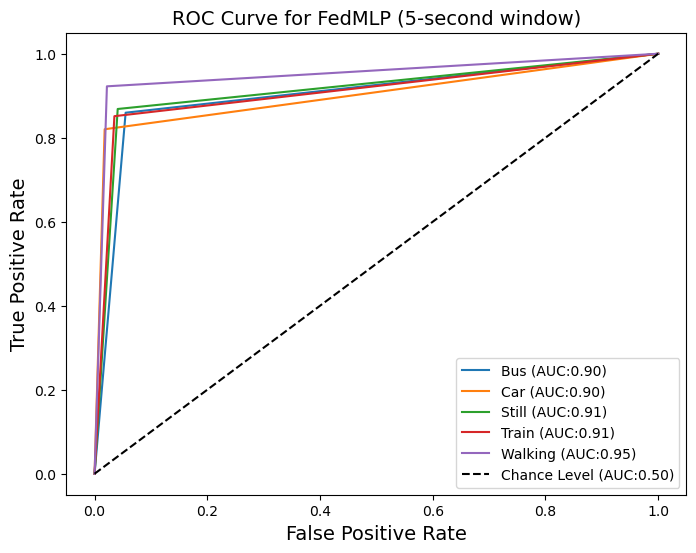

30/30 [==============================] - 1s 4ms/step - loss: 0.4559 - sparse_categorical_accuracy: 0.8365
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 163 | global_acc: 86.853% | global_loss: 1.1029871702194214
              precision    recall  f1-score   support

           0       0.78      0.88      0.83       235
           1       0.91      0.85      0.88       228
           2       0.83      0.88      0.85       228
           3       0.91      0.84      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9185504992935538


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


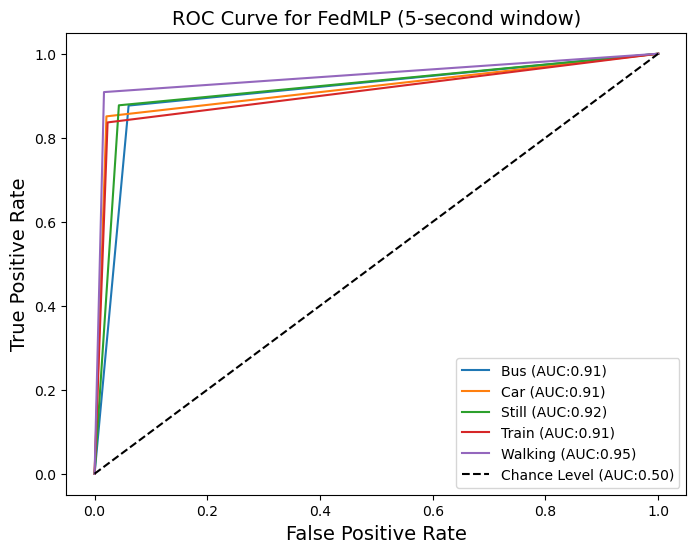

30/30 [==============================] - 0s 4ms/step - loss: 0.4549 - sparse_categorical_accuracy: 0.8376
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 164 | global_acc: 86.344% | global_loss: 1.0976176261901855
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.91      0.84      0.87       228
           2       0.83      0.86      0.84       228
           3       0.90      0.84      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.915130678011954


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


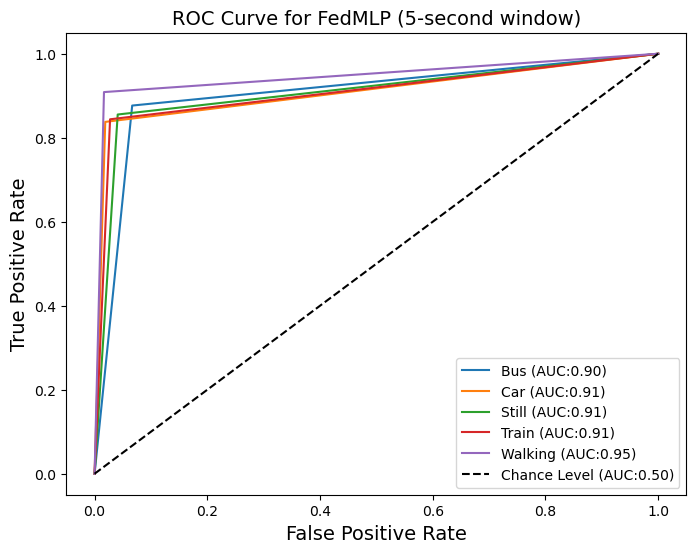

30/30 [==============================] - 1s 4ms/step - loss: 0.5001 - sparse_categorical_accuracy: 0.7983
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 165 | global_acc: 85.835% | global_loss: 1.099770188331604
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       235
           1       0.91      0.82      0.86       228
           2       0.83      0.86      0.84       228
           3       0.89      0.85      0.87       269
           4       0.93      0.88      0.90       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9115917781988013


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


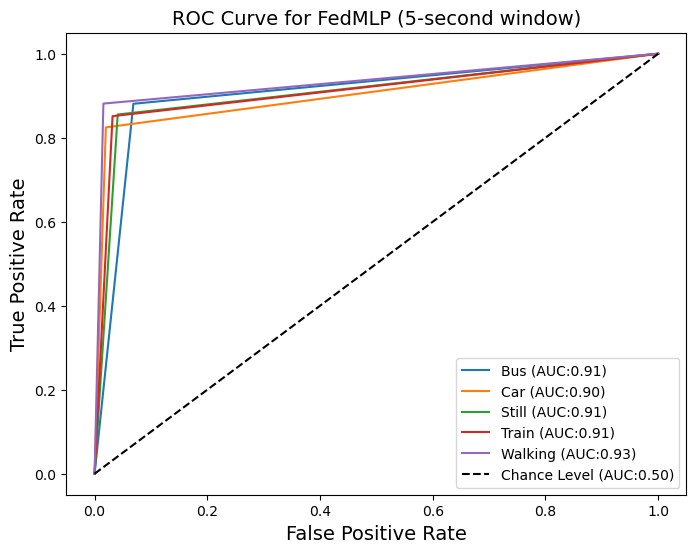

30/30 [==============================] - 0s 4ms/step - loss: 0.4631 - sparse_categorical_accuracy: 0.8567
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 166 | global_acc: 86.260% | global_loss: 1.0973275899887085
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.92      0.82      0.87       228
           2       0.83      0.87      0.85       228
           3       0.89      0.85      0.87       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9144876362684418


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


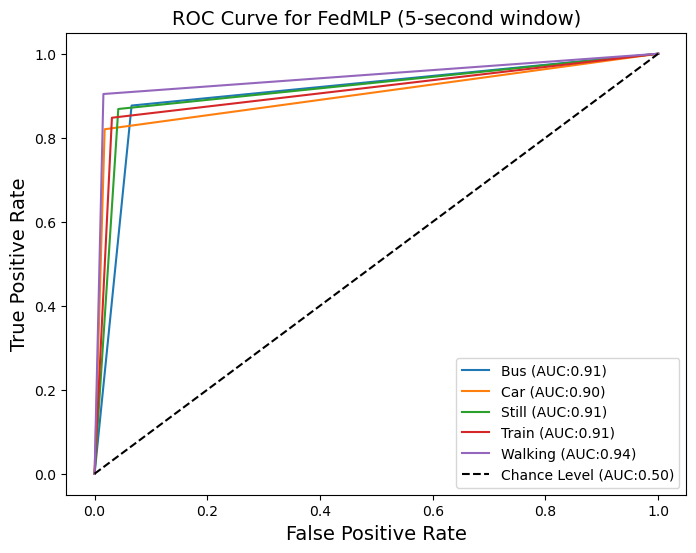

30/30 [==============================] - 1s 5ms/step - loss: 0.4523 - sparse_categorical_accuracy: 0.8429
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 167 | global_acc: 86.175% | global_loss: 1.0984245538711548
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       235
           1       0.91      0.82      0.87       228
           2       0.82      0.89      0.85       228
           3       0.93      0.81      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9146877438937476


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


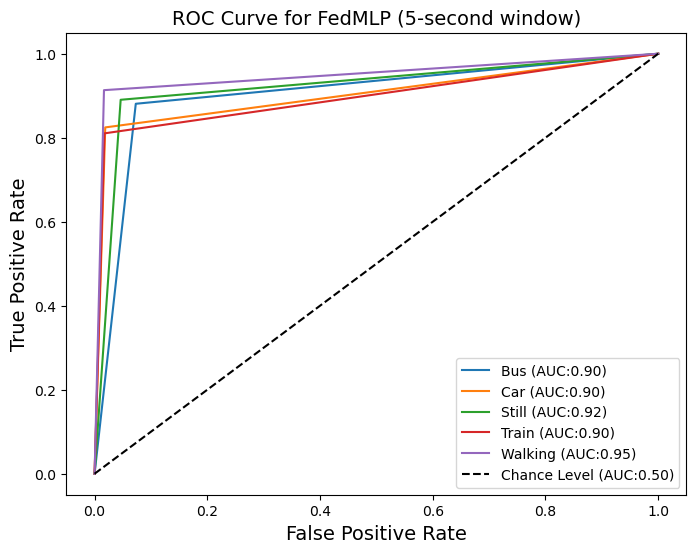

30/30 [==============================] - 0s 5ms/step - loss: 0.4486 - sparse_categorical_accuracy: 0.8355
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 168 | global_acc: 85.751% | global_loss: 1.1006478071212769
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       235
           1       0.92      0.83      0.87       228
           2       0.83      0.84      0.83       228
           3       0.91      0.83      0.87       269
           4       0.90      0.93      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9117509667136755


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


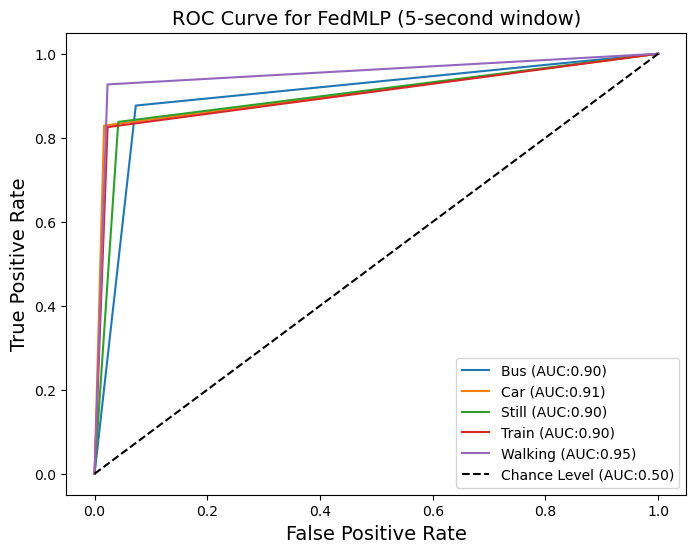

30/30 [==============================] - 1s 4ms/step - loss: 0.4247 - sparse_categorical_accuracy: 0.8567
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 169 | global_acc: 85.496% | global_loss: 1.1009567975997925
              precision    recall  f1-score   support

           0       0.72      0.88      0.79       235
           1       0.92      0.83      0.87       228
           2       0.82      0.85      0.84       228
           3       0.93      0.81      0.87       269
           4       0.93      0.92      0.92       219

    accuracy                           0.85      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.85      0.86      1179

0.9103424620144154


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


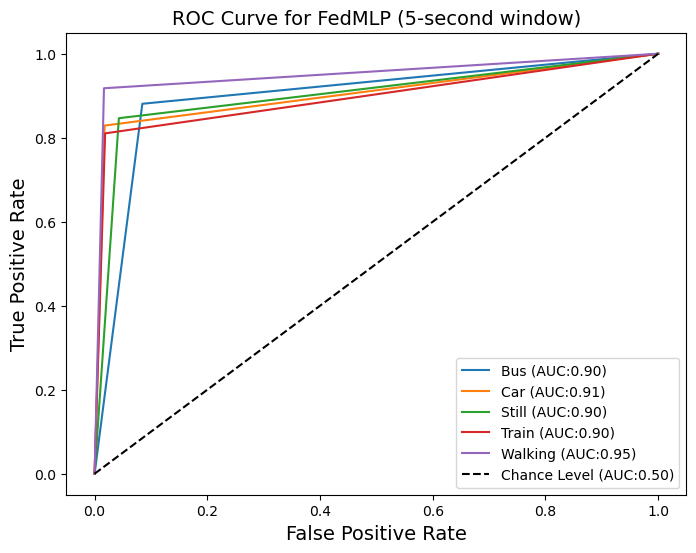

30/30 [==============================] - 0s 5ms/step - loss: 0.4461 - sparse_categorical_accuracy: 0.8450
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 170 | global_acc: 86.344% | global_loss: 1.0967727899551392
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.91      0.83      0.87       228
           2       0.83      0.88      0.86       228
           3       0.92      0.84      0.88       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9151008590323183


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


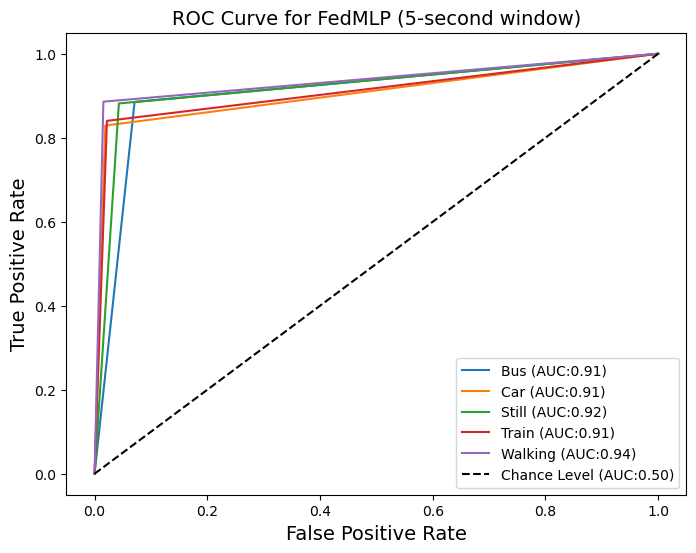

30/30 [==============================] - 1s 4ms/step - loss: 0.5051 - sparse_categorical_accuracy: 0.8291
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 171 | global_acc: 85.751% | global_loss: 1.0981701612472534
              precision    recall  f1-score   support

           0       0.74      0.89      0.81       235
           1       0.92      0.83      0.87       228
           2       0.84      0.83      0.84       228
           3       0.90      0.84      0.87       269
           4       0.93      0.90      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9113155856094719


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


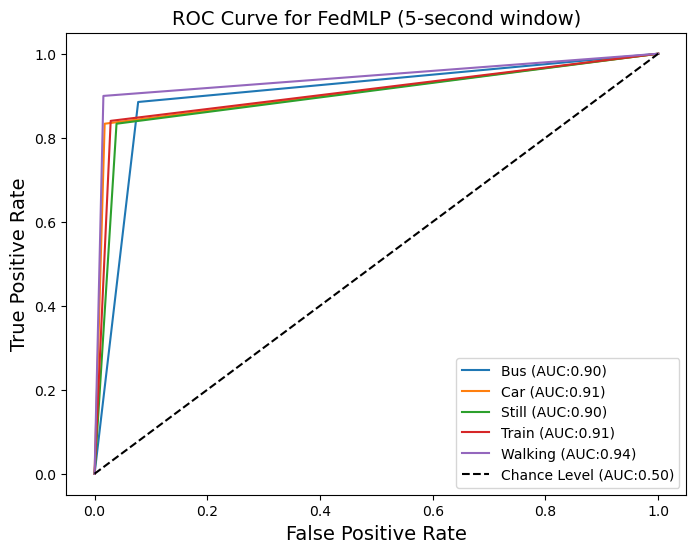

30/30 [==============================] - 0s 4ms/step - loss: 0.4353 - sparse_categorical_accuracy: 0.8556
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 172 | global_acc: 85.581% | global_loss: 1.0953266620635986
              precision    recall  f1-score   support

           0       0.76      0.88      0.81       235
           1       0.92      0.82      0.86       228
           2       0.84      0.85      0.84       228
           3       0.87      0.86      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.86      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9098955655570595


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


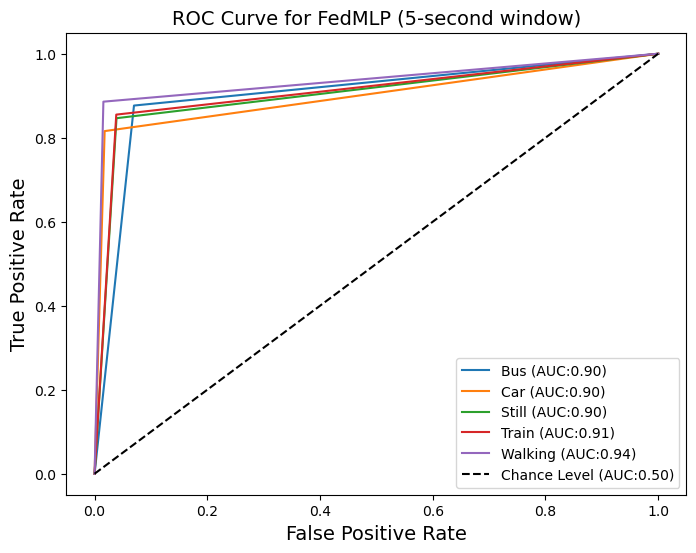

30/30 [==============================] - 1s 5ms/step - loss: 0.4652 - sparse_categorical_accuracy: 0.8323
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 173 | global_acc: 86.768% | global_loss: 1.0966283082962036
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.92      0.83      0.87       228
           2       0.83      0.88      0.86       228
           3       0.92      0.84      0.88       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9179120656074848


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


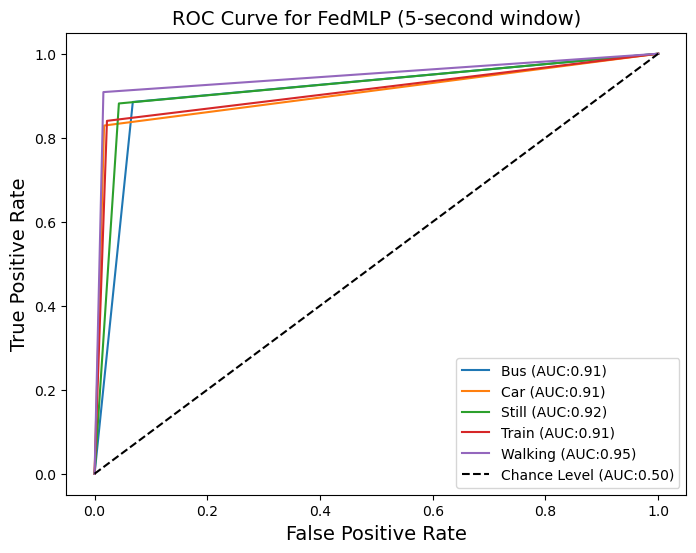

30/30 [==============================] - 0s 4ms/step - loss: 0.4355 - sparse_categorical_accuracy: 0.8524
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 174 | global_acc: 86.005% | global_loss: 1.097765564918518
              precision    recall  f1-score   support

           0       0.74      0.89      0.80       235
           1       0.92      0.82      0.87       228
           2       0.83      0.86      0.85       228
           3       0.92      0.82      0.87       269
           4       0.93      0.92      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9134581334083169


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


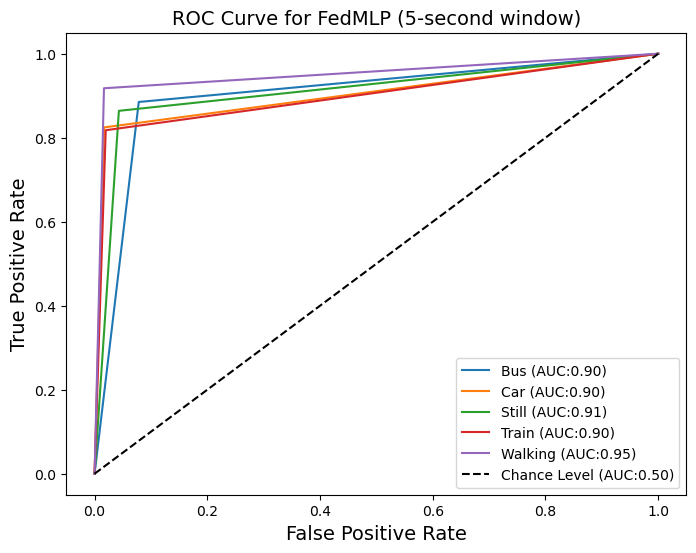

30/30 [==============================] - 1s 4ms/step - loss: 0.4203 - sparse_categorical_accuracy: 0.8567
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 175 | global_acc: 86.344% | global_loss: 1.0979468822479248
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.91      0.84      0.87       228
           2       0.84      0.88      0.86       228
           3       0.92      0.84      0.88       269
           4       0.93      0.88      0.90       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9150828345189801


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


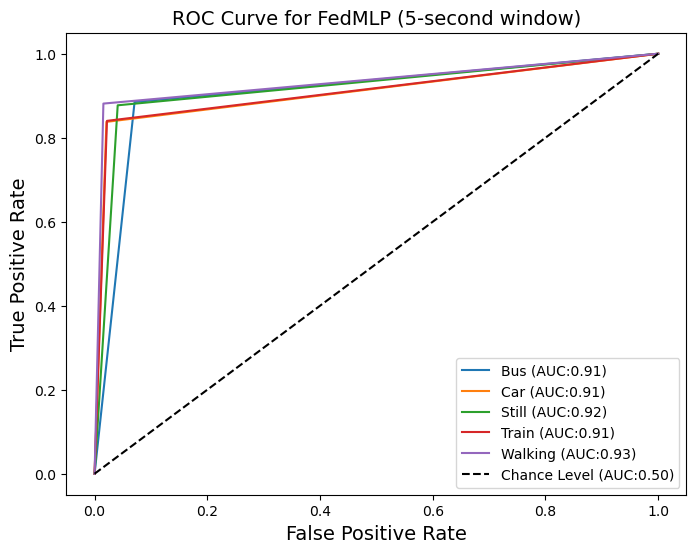

30/30 [==============================] - 0s 4ms/step - loss: 0.4476 - sparse_categorical_accuracy: 0.8471
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 176 | global_acc: 86.005% | global_loss: 1.0959699153900146
              precision    recall  f1-score   support

           0       0.78      0.88      0.82       235
           1       0.91      0.84      0.87       228
           2       0.86      0.83      0.84       228
           3       0.85      0.86      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.86      0.86      0.86      1179

0.9124936931299322


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


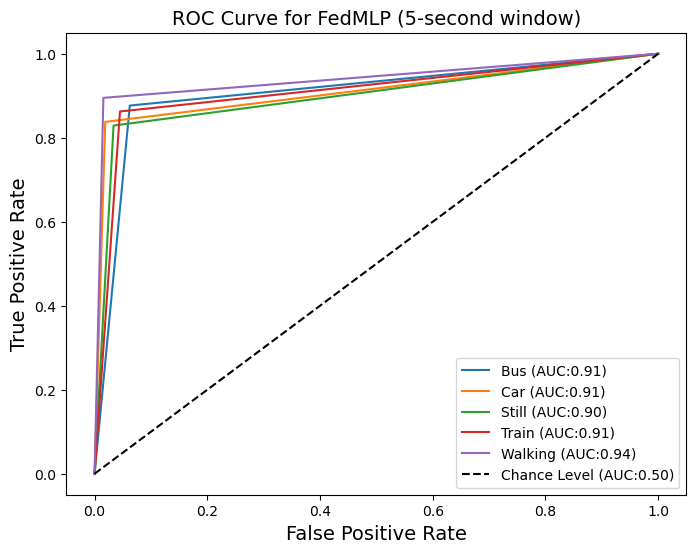

30/30 [==============================] - 1s 4ms/step - loss: 0.4752 - sparse_categorical_accuracy: 0.8142
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 177 | global_acc: 86.175% | global_loss: 1.0949259996414185
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.92      0.82      0.87       228
           2       0.84      0.85      0.84       228
           3       0.88      0.86      0.87       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.91377302485257


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


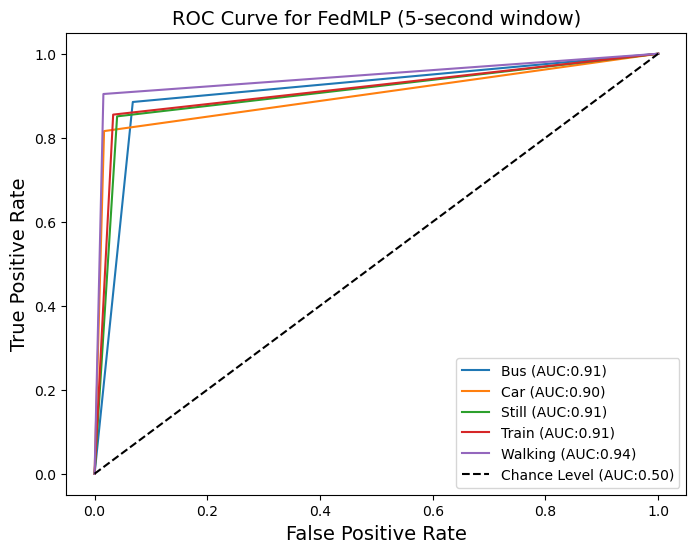

30/30 [==============================] - 0s 4ms/step - loss: 0.4288 - sparse_categorical_accuracy: 0.8535
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 178 | global_acc: 87.108% | global_loss: 1.0969375371932983
              precision    recall  f1-score   support

           0       0.78      0.88      0.83       235
           1       0.90      0.86      0.88       228
           2       0.83      0.89      0.86       228
           3       0.93      0.83      0.88       269
           4       0.93      0.90      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.88      0.87      0.87      1179

0.9203153849766252


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


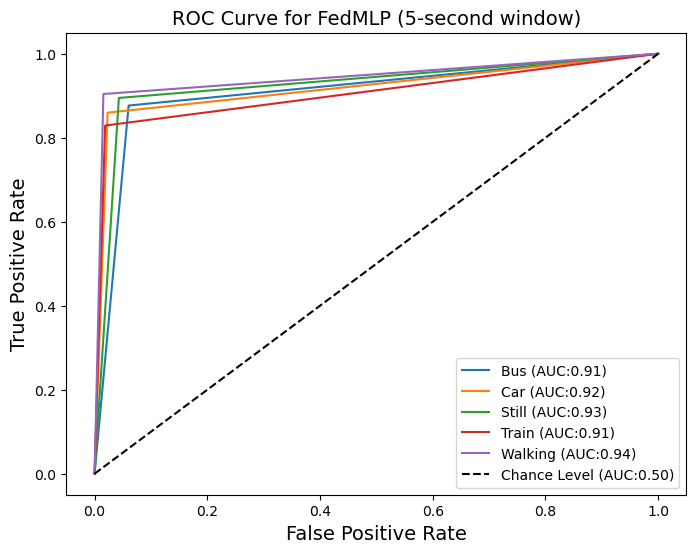

30/30 [==============================] - 1s 5ms/step - loss: 0.4622 - sparse_categorical_accuracy: 0.8376
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 179 | global_acc: 86.429% | global_loss: 1.0962083339691162
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.91      0.84      0.87       228
           2       0.81      0.90      0.85       228
           3       0.94      0.80      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.86      0.87      1179

0.9164371665585979


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


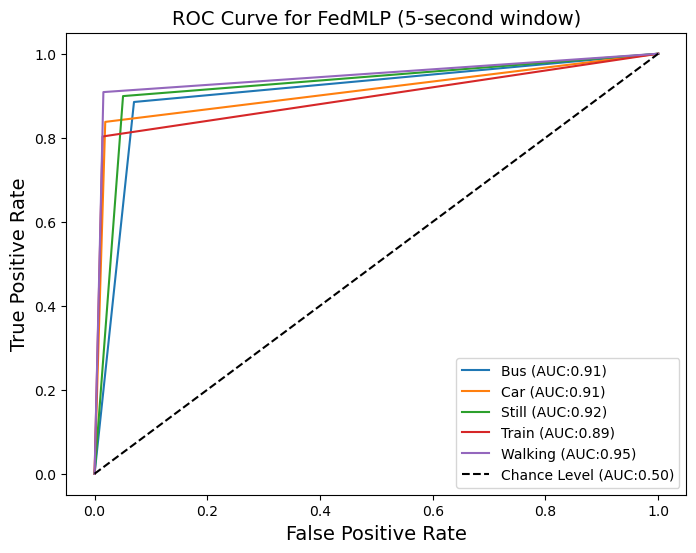

30/30 [==============================] - 0s 4ms/step - loss: 0.4660 - sparse_categorical_accuracy: 0.8376
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 180 | global_acc: 86.514% | global_loss: 1.0949105024337769
              precision    recall  f1-score   support

           0       0.78      0.88      0.82       235
           1       0.92      0.82      0.87       228
           2       0.82      0.89      0.85       228
           3       0.91      0.84      0.87       269
           4       0.92      0.91      0.91       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9163043286703895


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


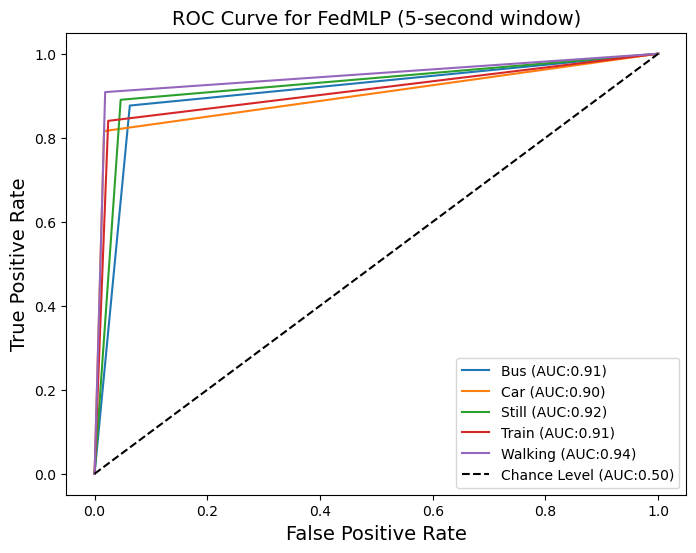

30/30 [==============================] - 0s 4ms/step - loss: 0.4400 - sparse_categorical_accuracy: 0.8493
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 181 | global_acc: 85.751% | global_loss: 1.0959042310714722
              precision    recall  f1-score   support

           0       0.73      0.90      0.80       235
           1       0.94      0.82      0.87       228
           2       0.83      0.86      0.85       228
           3       0.92      0.82      0.87       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9115983366894547


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


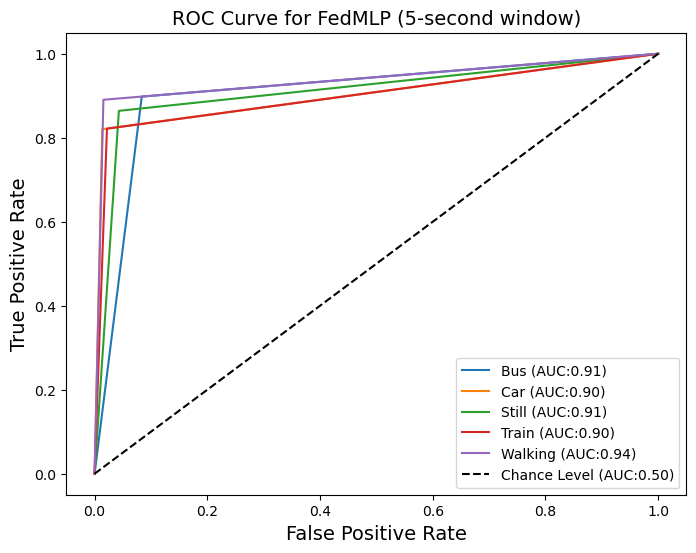

30/30 [==============================] - 0s 4ms/step - loss: 0.4897 - sparse_categorical_accuracy: 0.8280
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 182 | global_acc: 86.344% | global_loss: 1.0946753025054932
              precision    recall  f1-score   support

           0       0.75      0.89      0.82       235
           1       0.93      0.82      0.87       228
           2       0.84      0.87      0.85       228
           3       0.91      0.85      0.88       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9149244792076437


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


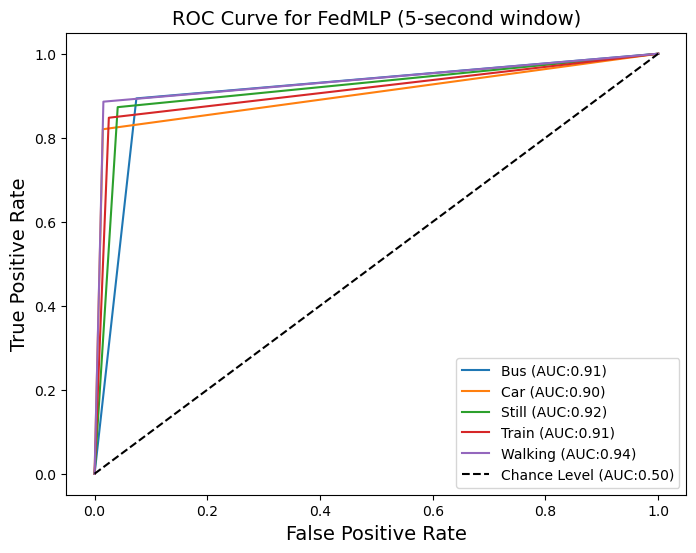

30/30 [==============================] - 0s 4ms/step - loss: 0.4791 - sparse_categorical_accuracy: 0.8259
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 183 | global_acc: 86.514% | global_loss: 1.092778205871582
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       235
           1       0.92      0.82      0.87       228
           2       0.83      0.86      0.85       228
           3       0.92      0.84      0.88       269
           4       0.91      0.94      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9164925966978869


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


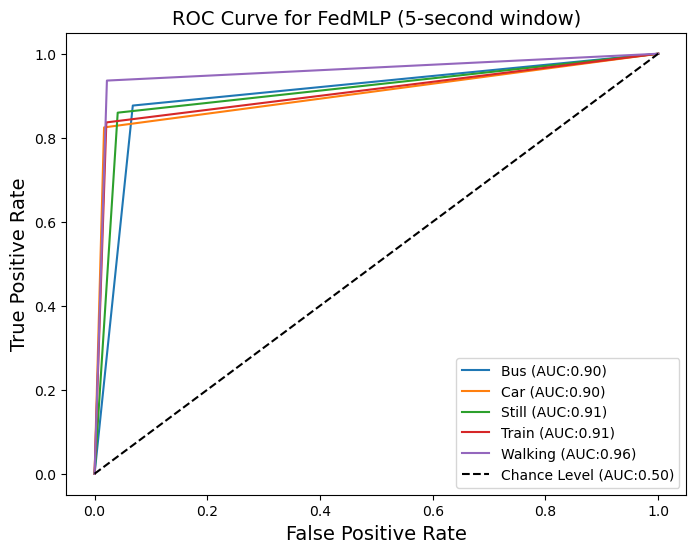

30/30 [==============================] - 0s 4ms/step - loss: 0.4498 - sparse_categorical_accuracy: 0.8386
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 184 | global_acc: 86.768% | global_loss: 1.0928846597671509
              precision    recall  f1-score   support

           0       0.79      0.87      0.83       235
           1       0.91      0.85      0.88       228
           2       0.83      0.86      0.85       228
           3       0.90      0.85      0.88       269
           4       0.91      0.92      0.91       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9178596704384494


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


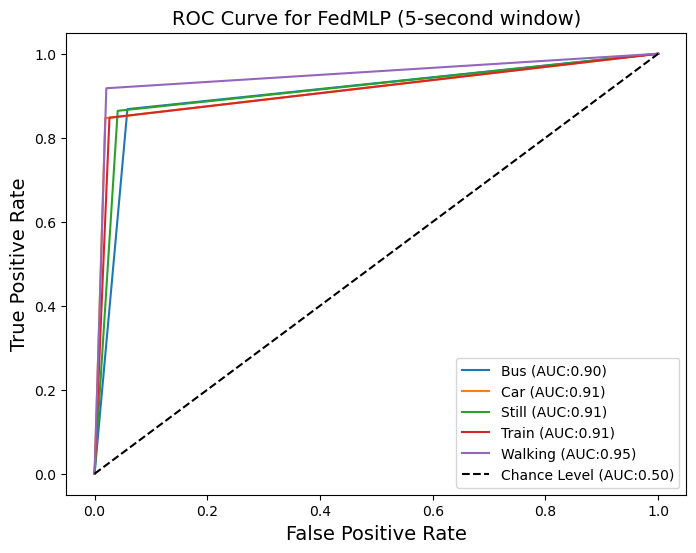

30/30 [==============================] - 0s 5ms/step - loss: 0.4198 - sparse_categorical_accuracy: 0.8461
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 185 | global_acc: 86.175% | global_loss: 1.092668056488037
              precision    recall  f1-score   support

           0       0.76      0.88      0.81       235
           1       0.92      0.82      0.87       228
           2       0.88      0.82      0.85       228
           3       0.86      0.88      0.87       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9132779041662026


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


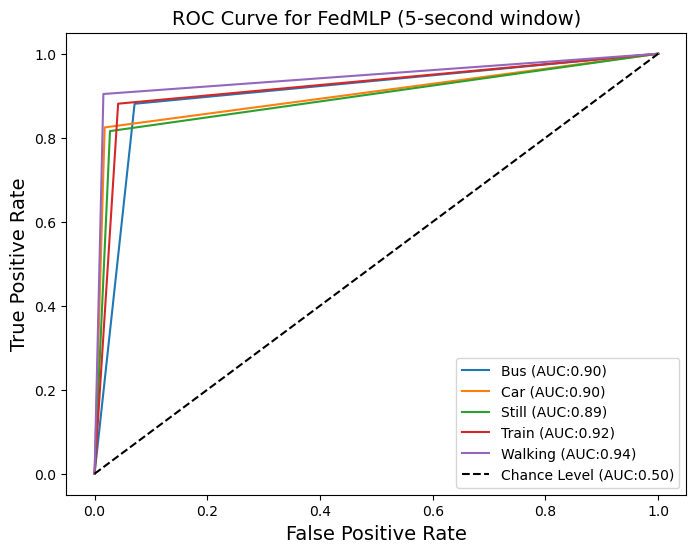

30/30 [==============================] - 0s 5ms/step - loss: 0.4435 - sparse_categorical_accuracy: 0.8270
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 186 | global_acc: 85.666% | global_loss: 1.0975884199142456
              precision    recall  f1-score   support

           0       0.72      0.89      0.80       235
           1       0.91      0.83      0.87       228
           2       0.83      0.89      0.86       228
           3       0.94      0.80      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9115721277309762


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


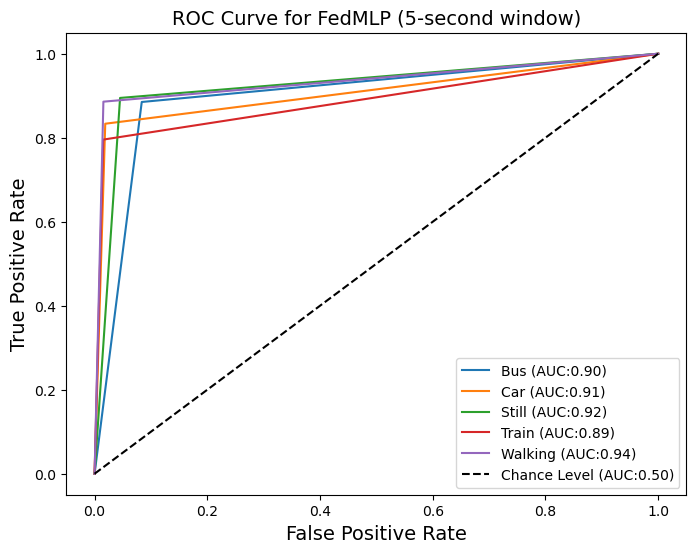

30/30 [==============================] - 0s 5ms/step - loss: 0.4363 - sparse_categorical_accuracy: 0.8556
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 187 | global_acc: 86.684% | global_loss: 1.093127965927124
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.91      0.84      0.87       228
           2       0.83      0.89      0.86       228
           3       0.92      0.84      0.88       269
           4       0.93      0.89      0.91       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9172439933534371


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


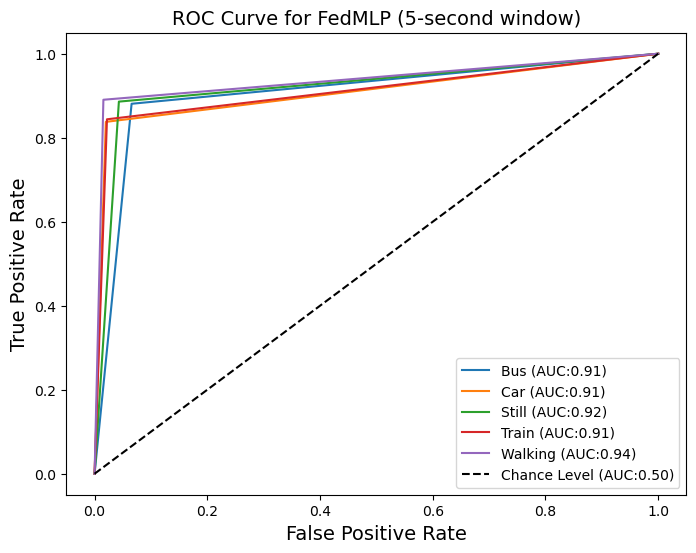

30/30 [==============================] - 0s 4ms/step - loss: 0.4521 - sparse_categorical_accuracy: 0.8514
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 188 | global_acc: 86.599% | global_loss: 1.0917080640792847
              precision    recall  f1-score   support

           0       0.75      0.89      0.82       235
           1       0.92      0.83      0.87       228
           2       0.83      0.89      0.86       228
           3       0.94      0.81      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9173180418399995


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


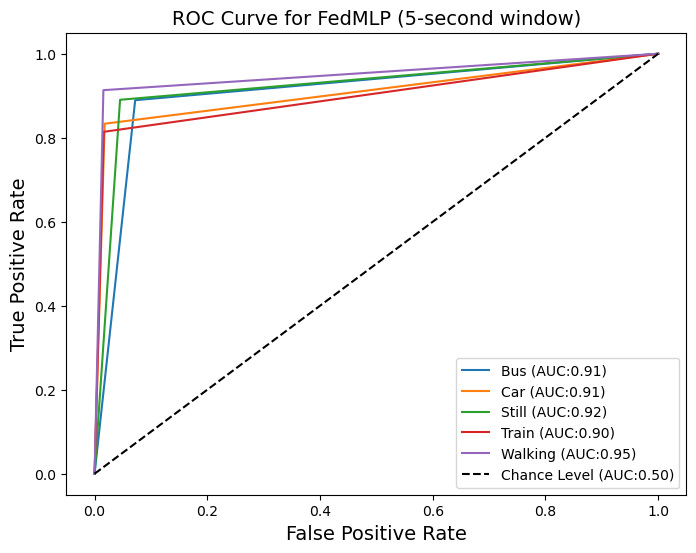

30/30 [==============================] - 0s 5ms/step - loss: 0.4234 - sparse_categorical_accuracy: 0.8556
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 189 | global_acc: 86.090% | global_loss: 1.0940673351287842
              precision    recall  f1-score   support

           0       0.74      0.90      0.81       235
           1       0.91      0.84      0.87       228
           2       0.85      0.82      0.84       228
           3       0.91      0.83      0.87       269
           4       0.92      0.92      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9138207229079592


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


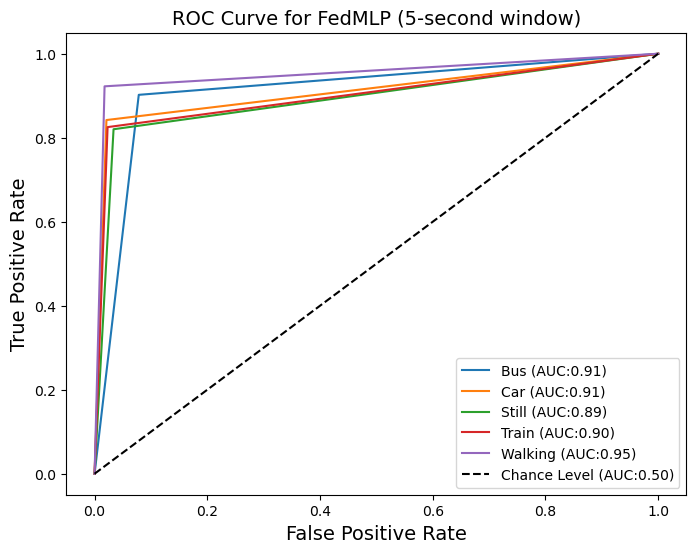

30/30 [==============================] - 0s 4ms/step - loss: 0.4307 - sparse_categorical_accuracy: 0.8493
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 190 | global_acc: 86.938% | global_loss: 1.0903583765029907
              precision    recall  f1-score   support

           0       0.78      0.88      0.82       235
           1       0.92      0.83      0.87       228
           2       0.83      0.89      0.86       228
           3       0.92      0.84      0.88       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9189580044281707


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


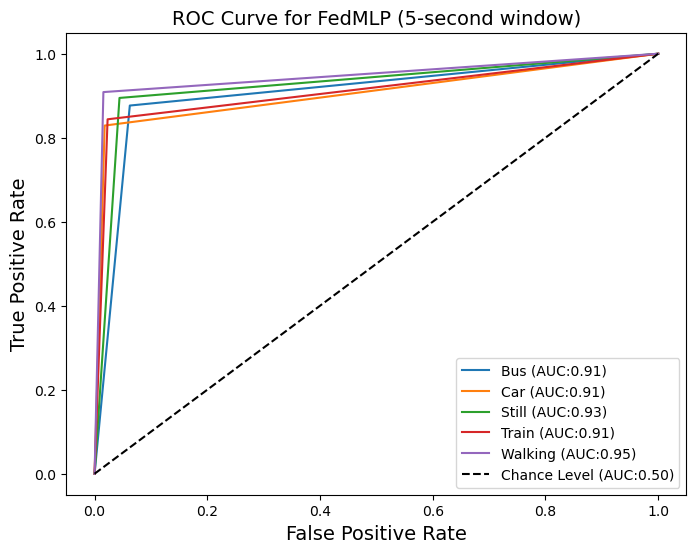

30/30 [==============================] - 0s 5ms/step - loss: 0.4224 - sparse_categorical_accuracy: 0.8546
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 191 | global_acc: 86.429% | global_loss: 1.0909466743469238
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.91      0.83      0.87       228
           2       0.83      0.86      0.84       228
           3       0.90      0.85      0.87       269
           4       0.93      0.90      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.87      1179
weighted avg       0.87      0.86      0.87      1179

0.9155054753473184


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


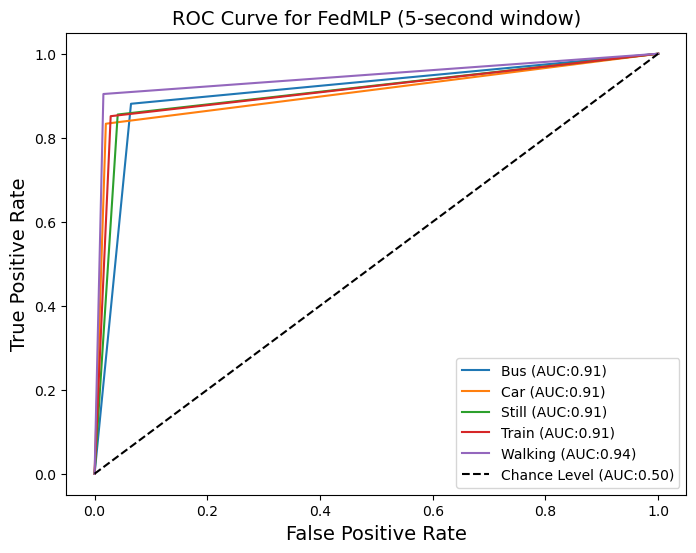

30/30 [==============================] - 0s 6ms/step - loss: 0.4587 - sparse_categorical_accuracy: 0.8280
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 192 | global_acc: 87.193% | global_loss: 1.0900529623031616
              precision    recall  f1-score   support

           0       0.80      0.87      0.83       235
           1       0.92      0.84      0.88       228
           2       0.88      0.84      0.86       228
           3       0.85      0.90      0.87       269
           4       0.93      0.91      0.92       219

    accuracy                           0.87      1179
   macro avg       0.88      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9196060280506904


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


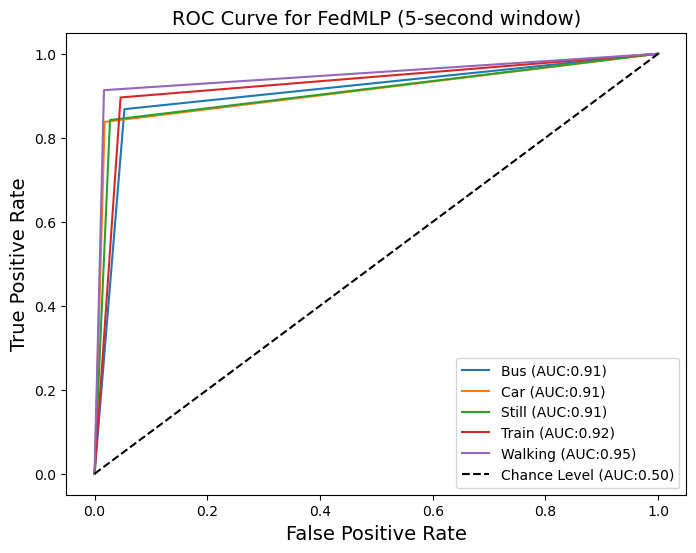

30/30 [==============================] - 0s 6ms/step - loss: 0.4769 - sparse_categorical_accuracy: 0.8301
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 193 | global_acc: 86.090% | global_loss: 1.0904500484466553
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       235
           1       0.92      0.85      0.88       228
           2       0.85      0.83      0.84       228
           3       0.87      0.86      0.86       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9131512918580122


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


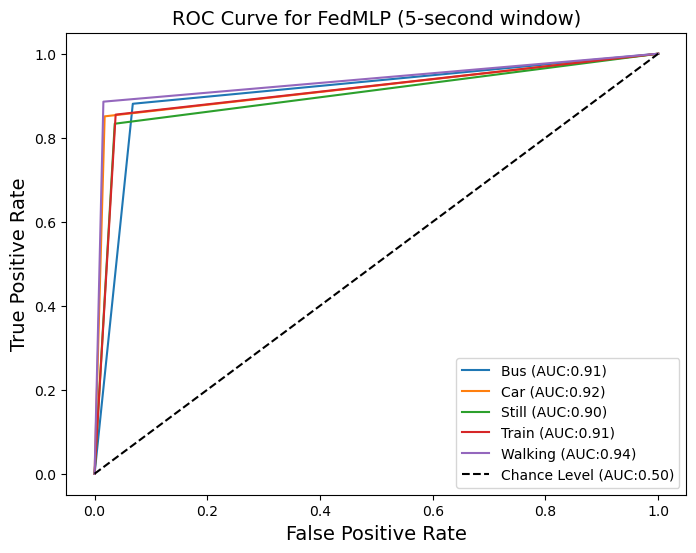

30/30 [==============================] - 0s 5ms/step - loss: 0.4704 - sparse_categorical_accuracy: 0.8365
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 194 | global_acc: 87.108% | global_loss: 1.0903111696243286
              precision    recall  f1-score   support

           0       0.78      0.88      0.83       235
           1       0.91      0.83      0.87       228
           2       0.84      0.89      0.86       228
           3       0.92      0.85      0.88       269
           4       0.92      0.91      0.91       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.88      0.87      0.87      1179

0.9199908796922145


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


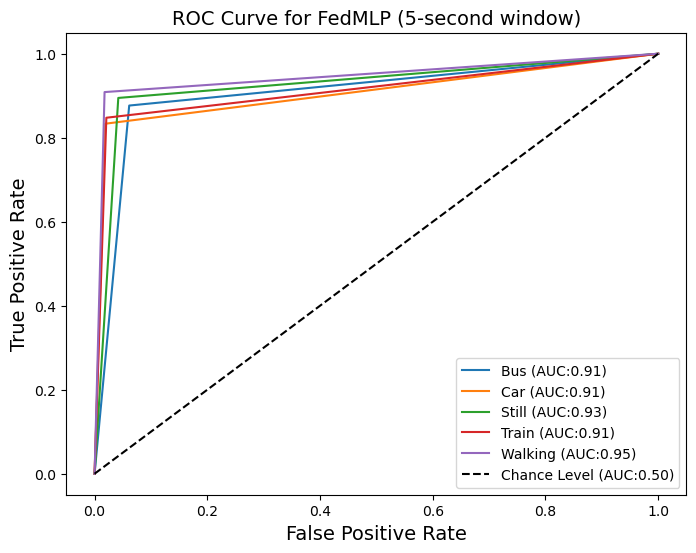

30/30 [==============================] - 0s 4ms/step - loss: 0.4748 - sparse_categorical_accuracy: 0.8323
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 195 | global_acc: 85.835% | global_loss: 1.0946389436721802
              precision    recall  f1-score   support

           0       0.73      0.89      0.80       235
           1       0.90      0.86      0.88       228
           2       0.84      0.85      0.84       228
           3       0.93      0.83      0.87       269
           4       0.93      0.88      0.90       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9120909752816019


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


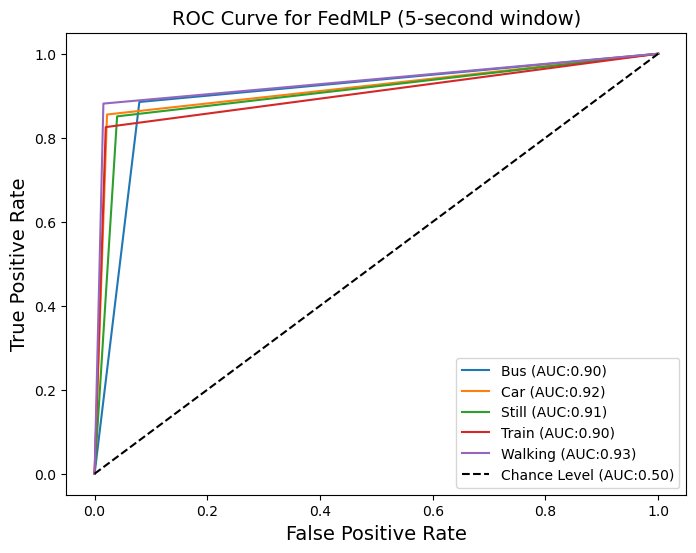

30/30 [==============================] - 0s 4ms/step - loss: 0.4526 - sparse_categorical_accuracy: 0.8450
y_pred = [1 4 2 ... 0 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 196 | global_acc: 86.090% | global_loss: 1.096028447151184
              precision    recall  f1-score   support

           0       0.75      0.89      0.81       235
           1       0.91      0.83      0.87       228
           2       0.81      0.90      0.86       228
           3       0.94      0.81      0.87       269
           4       0.93      0.89      0.91       219

    accuracy                           0.86      1179
   macro avg       0.87      0.86      0.86      1179
weighted avg       0.87      0.86      0.86      1179

0.9140842777189618


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


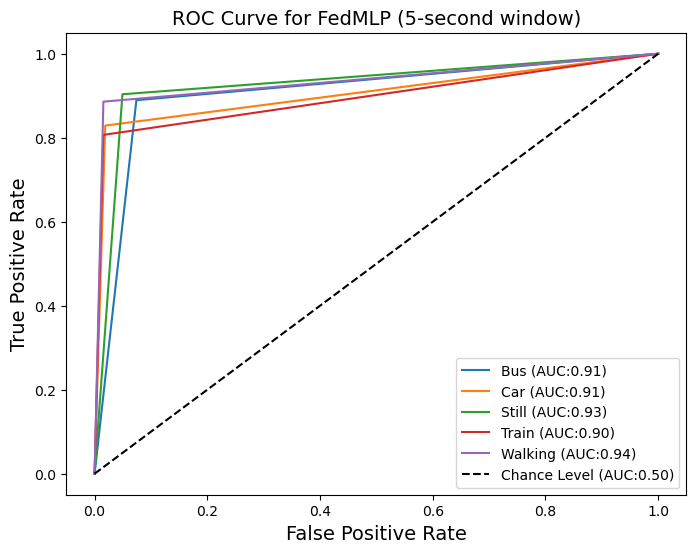

30/30 [==============================] - 0s 4ms/step - loss: 0.4486 - sparse_categorical_accuracy: 0.8652
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 197 | global_acc: 86.768% | global_loss: 1.0899507999420166
              precision    recall  f1-score   support

           0       0.77      0.88      0.82       235
           1       0.91      0.86      0.89       228
           2       0.83      0.89      0.86       228
           3       0.94      0.81      0.87       269
           4       0.93      0.90      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9184125831284827


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


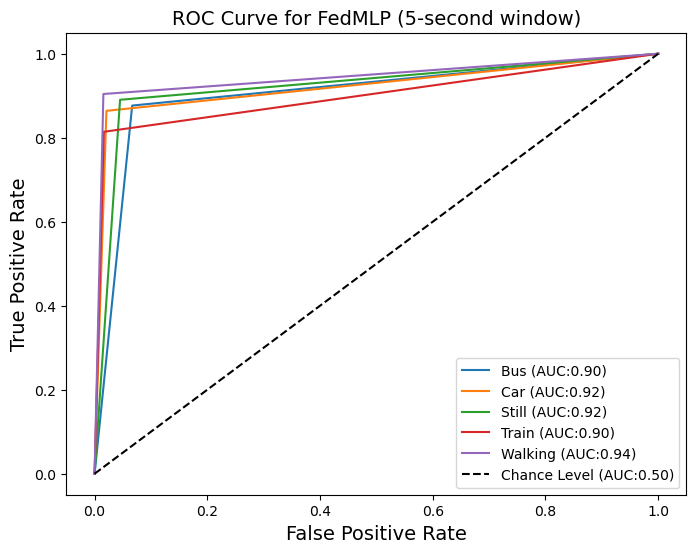

30/30 [==============================] - 0s 6ms/step - loss: 0.4185 - sparse_categorical_accuracy: 0.8577
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 198 | global_acc: 86.768% | global_loss: 1.0880420207977295
              precision    recall  f1-score   support

           0       0.80      0.87      0.83       235
           1       0.91      0.85      0.88       228
           2       0.84      0.85      0.84       228
           3       0.89      0.85      0.87       269
           4       0.91      0.93      0.92       219

    accuracy                           0.87      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.87      0.87      1179

0.9178195417353227


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


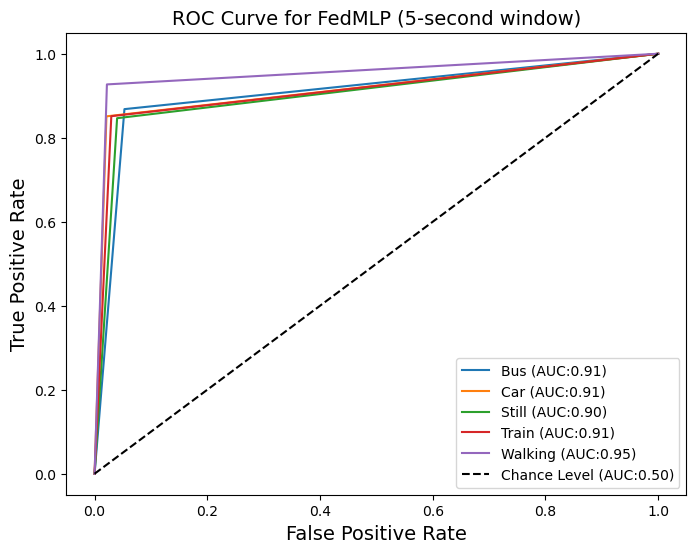

30/30 [==============================] - 0s 4ms/step - loss: 0.4676 - sparse_categorical_accuracy: 0.8312
y_pred = [1 4 2 ... 1 4 4]
tf.Tensor([1 4 2 ... 1 4 4], shape=(1179,), dtype=int64)
(1179,)
(1179,)
comm_round: 199 | global_acc: 86.429% | global_loss: 1.0919064283370972
              precision    recall  f1-score   support

           0       0.76      0.89      0.82       235
           1       0.91      0.83      0.87       228
           2       0.81      0.90      0.85       228
           3       0.95      0.80      0.86       269
           4       0.93      0.91      0.92       219

    accuracy                           0.86      1179
   macro avg       0.87      0.87      0.87      1179
weighted avg       0.87      0.86      0.87      1179

0.9165815484974893


C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_10052\1964235933.py:108: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


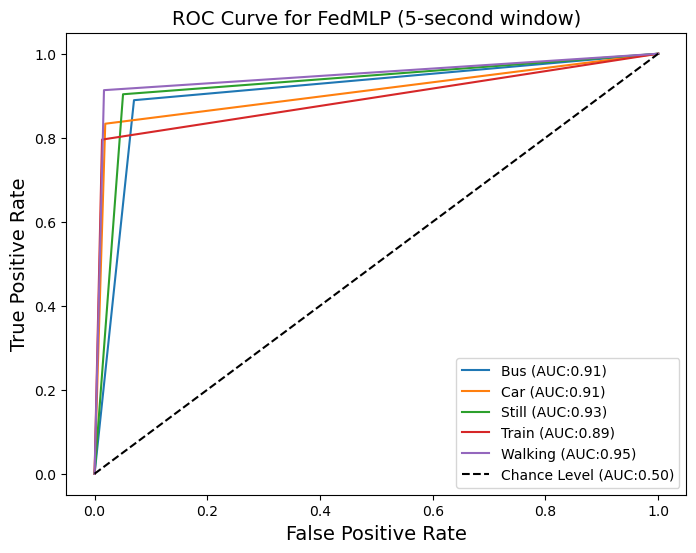

In [99]:
#initialize global model
smlp_global = SimpleMLP()
global_model = smlp_global.build(20, 5)
        
#commence global training loop
for comm_round in range(comms_round):
            
    # get the global model's weights - will serve as the initial weights for all local models
    global_weights = global_model.get_weights()
    
    #initial list to collect local model weights after scalling
    scaled_local_weight_list = list()

    #randomize client data - using keys
    client_names= list(clients_batched.keys())
    random.shuffle(client_names)
    
    #loop through each client and create new local model
    for client in client_names:
        #print(4)
        smlp_local = SimpleMLP()
        local_model = smlp_local.build(20, 5)
        local_model.compile(loss=loss, 
                      optimizer=optimizer, 
                      metrics=metrics)
        
        #set local model weight to the weight of the global model
        local_model.set_weights(global_weights)
        
        #fit local model with client's data
        local_model.fit(clients_batched[client], epochs=1, verbose=1)
        
        #scale the model weights and add to list
        scaling_factor = weight_scalling_factor(clients_batched, client)
        scaled_weights = scale_model_weights(local_model.get_weights(), scaling_factor)
        scaled_local_weight_list.append(scaled_weights)
        
        #clear session to free memory after each communication round
        K.clear_session()
        
    #to get the average over all the local model, we simply take the sum of the scaled weights
    average_weights = sum_scaled_weights(scaled_local_weight_list)
    #print(average_weights)
    #update global model 
    global_model.set_weights(average_weights)

    #test global model and print out metrics after each communications round
    for(X_test, Y_test) in test_batched:
        global_acc, global_loss = test_model(X_test, Y_test, global_model, comm_round)